In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import os,sys, gc
import keras

dirpath = os.getcwd().split("code")[0]+"code/"
sys.path.append(dirpath)
from pre_process import clean_LC,generate_representation
from evaluation import calculate_metrics, evaluate_metadata, evaluate_metadata_raw


folder = "../../KOI_Data/"
folder_lc = "/work/work_teamEXOPLANET/KOI_LC/"

Using TensorFlow backend.


### Load Metadata and pre-process

In [2]:
def impute_on_pandas(df):
    return df.fillna(df.median(),inplace=False)

df_meta = pd.read_csv(folder+"/kepler_dataset.csv")
all_labels = df_meta["NExScI Disposition"]
mask_conf = (all_labels=="CONFIRMED").values
mask_fp = (all_labels=="FALSE POSITIVE").values
mask_cand = (all_labels=="CANDIDATE").values

metadata_used = ["Period", "Duration", "Time of Transit Epoch", 
                 "Inclination", "Transit Number",
                 "Teq", "r/R", "a/R", #"Semi-major Axis"
                 "Limb Darkening Coeff1", "Limb Darkening Coeff2", "Fitted Stellar Density",
                "Teff","Stellar Radius", "Stellar Mass"]
#dividir duration por 24??
df_meta["Duration"] = df_meta["Duration"]/24

time_kepler = np.load(folder_lc+"npy/KOI_LC_time.npy")
df_meta["Time of Transit Epoch"] = df_meta["Time of Transit Epoch"]- time_kepler[:,0] #modificacion

df_meta_obj = df_meta[metadata_used]
mask_nan = pd.isna(df_meta_obj)

df_meta_obj = impute_on_pandas(df_meta_obj)

df_meta_obj.head()

,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,Stellar Radius,Stellar Mass
0,8.884923,0.086252,38.478971,89.89,153,770.0,0.114,36.466,0.497,0.204,11.62061,5332.0,0.843,0.821
1,5.092465,0.152458,226.023232,89.14,225,844.0,0.014,10.670,0.551,0.165,0.88510,5037.0,0.751,0.727
2,275.073650,0.140417,183.735888,89.93,4,303.0,0.014,512.000,0.437,0.243,33.55994,5604.0,1.187,0.864
3,8.460439,0.197288,2.261777,85.68,164,804.0,0.478,14.087,0.299,0.306,0.73874,5951.0,0.702,0.796
4,21.761298,0.051792,35.027740,89.95,62,486.0,0.032,137.070,0.627,0.108,102.86534,4859.0,0.720,0.781


In [3]:
df_sets = pd.read_csv(folder+"/koi_sets_unb.csv") 
mask_train = (df_sets["Set"] == "Train").values
mask_test = (df_sets["Set"] == "Test").values
mask_unlabeled = (df_sets["Set"] == "Unlabeled").values

mask_train_conf = mask_train & mask_conf
mask_test_conf = mask_test & mask_conf

In [4]:
Y_train = df_meta_obj.values[mask_train_conf]
Y_test = df_meta_obj.values[mask_test_conf]
Y_train.shape

(1776, 14)

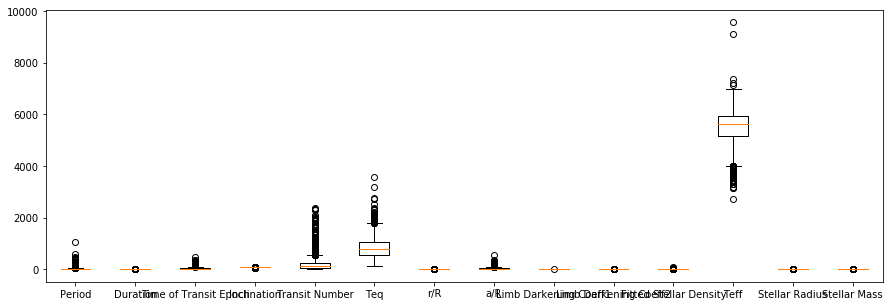

,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,Stellar Radius,Stellar Mass
count,1776.000000,1776.000000,1776.000000,1776.000000,1776.000000,1776.000000,1776.000000,1776.000000,1776.000000,1776.000000,1776.000000,1776.000000,1776.000000,1776.000000
mean,26.770958,0.178254,25.351408,87.975490,207.111486,840.867680,0.025715,31.210928,0.436031,0.242360,2.431488,5469.600788,1.067643,0.931707
std,53.253481,0.113039,42.055208,3.507531,296.638191,396.090465,0.022297,37.462095,0.099668,0.067242,4.408321,688.837399,0.685182,0.232760
min,0.341842,0.017829,-10.946495,40.980000,3.000000,129.000000,0.005000,1.268000,0.210000,0.034000,0.006780,2703.000000,0.118000,0.096000
25%,5.012505,0.105170,2.736897,87.580000,47.000000,553.000000,0.014000,10.820000,0.359000,0.204000,0.519590,5156.000000,0.805000,0.816750
50%,11.326234,0.148019,9.074998,89.100000,107.000000,771.000000,0.021000,19.688500,0.419000,0.260000,1.394665,5610.000000,0.966000,0.937000
75%,25.372859,0.218844,39.465683,89.810000,242.000000,1046.000000,0.029000,35.500000,0.497000,0.289000,2.785210,5926.250000,1.207000,1.044000
max,1071.232624,1.017500,458.206990,90.000000,2354.000000,3559.000000,0.415000,557.300000,0.731000,0.442000,67.074260,9565.000000,19.530000,3.573000


In [5]:
### boxplot de las variables..
plt.figure(figsize=(15,5))
plt.boxplot(Y_train)
plt.xticks(np.arange(len(metadata_used))+1,metadata_used)
plt.show()
aux_df = pd.DataFrame(Y_train)
aux_df.columns = metadata_used
aux_df.describe()

In [5]:
#pre-process: scale metadata
from sklearn.preprocessing import StandardScaler, RobustScaler
#scaler_meta = RobustScaler()
scaler_meta = StandardScaler()

Ystd_train = scaler_meta.fit_transform(Y_train)
Ystd_test = scaler_meta.transform(Y_test)

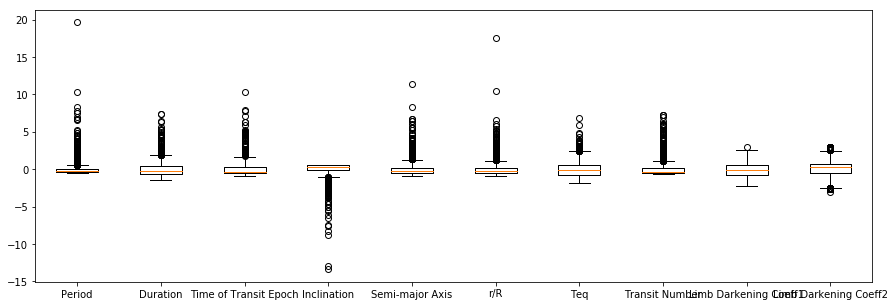

,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
count,1.776000e+03,1.776000e+03,1.776000e+03,1.776000e+03,1.776000e+03,1.776000e+03,1.776000e+03,1.776000e+03,1.776000e+03,1.776000e+03
mean,-7.285839e-17,6.227188e-16,6.990686e-15,-7.418934e-14,-7.514009e-17,-3.722201e-15,-5.188542e-18,-4.071130e-17,-1.323991e-14,2.691253e-14
std,1.000282e+00,1.000282e+00,1.000282e+00,1.000282e+00,1.000282e+00,1.000282e+00,1.000282e+00,1.000282e+00,1.000282e+00,1.000282e+00
min,-4.964288e-01,-1.419601e+00,-8.633419e-01,-1.340223e+01,-8.961943e-01,-9.292957e-01,-1.797741e+00,-6.882761e-01,-2.268470e+00,-3.099549e+00
25%,-4.086978e-01,-6.467246e-01,-5.378791e-01,-1.127862e-01,-5.718343e-01,-5.255484e-01,-7.269773e-01,-5.399055e-01,-7.730908e-01,-5.706383e-01
50%,-2.901045e-01,-2.675544e-01,-3.871383e-01,3.206891e-01,-3.070507e-01,-2.115228e-01,-1.764429e-01,-3.375819e-01,-1.709246e-01,2.624147e-01
75%,-2.626105e-02,3.591757e-01,3.356950e-01,5.231677e-01,1.761795e-01,1.473637e-01,5.180385e-01,1.176461e-01,6.118915e-01,6.938172e-01
max,1.961855e+01,7.426481e+00,1.029546e+01,5.773521e-01,1.137653e+01,1.746364e+01,6.864336e+00,7.239436e+00,2.960340e+00,2.969837e+00


In [6]:
### boxplot de las variables..
plt.figure(figsize=(15,5))
plt.boxplot(Ystd_train)
plt.xticks(np.arange(len(metadata_used))+1,metadata_used)
plt.show()
aux_df = pd.DataFrame(Ystd_train)
aux_df.columns = metadata_used
aux_df.describe()

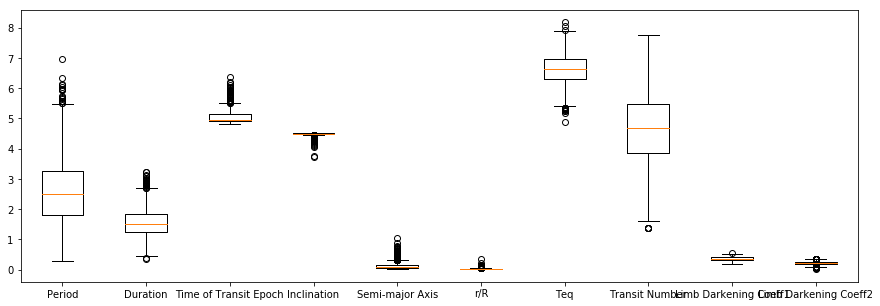

In [7]:
### boxplot de las variables..
plt.figure(figsize=(15,5))
plt.boxplot(np.log(Y_train+1))
plt.xticks(np.arange(len(metadata_used))+1,metadata_used)
plt.show()

In [6]:
#probar agregar errores
metadata_errors = ["Period err1", "Period err2", "Duration err1", "Duration err2", "Time err1", "Time err2",
                  "Inclination err1", "Inclination err2", "Semi-major Axus err1", "Semi-major Axis err2",
                  "r/R err1", "r/R err2", "Teq err1", "Teq err2", "Transit Number"]
aux = df_meta[metadata_errors].abs()

df_meta_err = pd.DataFrame()
df_meta_err["Period err"] = (aux["Period err1"]+aux["Period err2"])/2
df_meta_err["Duration err"] = (aux["Duration err1"]+aux["Duration err2"])/2
df_meta_err["Time err"] = (aux["Time err1"]+aux["Time err2"])/2
df_meta_err["Inclination err"] = (aux["Inclination err1"]+aux["Inclination err2"])/2
df_meta_err["Semi-major Axis err"] = (aux["Semi-major Axus err1"]+aux["Semi-major Axis err2"])/2
df_meta_err["r/R err"] = (aux["r/R err1"]+aux["r/R err2"])/2
df_meta_err["Teq err"] = (aux["Teq err1"]+aux["Teq err2"])/2
df_meta_err["Number err"] = np.nan
df_meta_err["Coeff1 err"] = np.nan
df_meta_err["Coeff2 err"] = np.nan

mask_nan_err = pd.isna(df_meta_err)

df_meta_err.head()

,Period err,Duration err,Time err,Inclination err,Semi-major Axis err,r/R err,Teq err,Number err,Coeff1 err,Coeff2 err
0,1.636000e-06,0.007,0.000144,NaN,NaN,0.000331,NaN,NaN,NaN,NaN
1,4.390000e-05,0.199,0.005000,NaN,NaN,0.000661,NaN,NaN,NaN,NaN
2,3.900000e-02,5.500,0.094000,NaN,NaN,0.001246,NaN,NaN,NaN,NaN
3,6.290000e-07,0.003,0.000063,NaN,NaN,0.010500,NaN,NaN,NaN,NaN
4,1.727000e-05,0.026,0.000641,NaN,NaN,0.000770,NaN,NaN,NaN,NaN


In [7]:
Y_train_err = df_meta_err.values[mask_train_conf]
#Y_test_err = df_meta_err.values[mask_test_conf]
Y_train_err.shape

(1776, 10)

/users/fmena/anaconda3/envs/tesis/lib/python3.5/site-packages/numpy/lib/function_base.py:3826: RuntimeWarning: Invalid value encountered in percentile
  interpolation=interpolation)


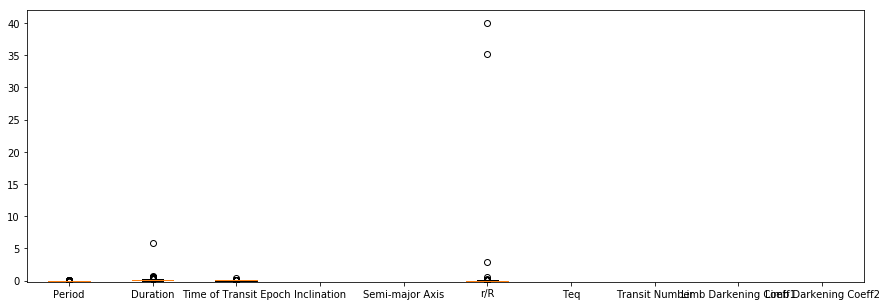

,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
count,5.050000e+02,505.000000,505.000000,0.0,0.0,505.000000,0.0,0.0,0.0,0.0
mean,2.723024e-04,0.129247,0.004544,NaN,NaN,0.157463,NaN,NaN,NaN,NaN
std,2.307667e-03,0.276396,0.016095,NaN,NaN,2.372793,NaN,NaN,NaN,NaN
min,7.100000e-08,0.000730,0.000025,NaN,NaN,0.000066,NaN,NaN,NaN,NaN
25%,1.266000e-05,0.054000,0.001000,NaN,NaN,0.000468,NaN,NaN,NaN,NaN
50%,3.311000e-05,0.088000,0.003000,NaN,NaN,0.000831,NaN,NaN,NaN,NaN
75%,1.205000e-04,0.148000,0.005000,NaN,NaN,0.002000,NaN,NaN,NaN,NaN
max,5.100000e-02,5.900000,0.345000,NaN,NaN,40.034500,NaN,NaN,NaN,NaN


In [43]:
### boxplot de las variables..
plt.figure(figsize=(15,5))
plt.boxplot(Y_test_err)
plt.xticks(np.arange(len(metadata_used))+1,metadata_used)
plt.ylim(-0.2)
plt.show()
aux_df = pd.DataFrame(Y_test_err)
aux_df.columns = metadata_used
aux_df.describe()

In [8]:
Ystd_train_err = Y_train_err/ scaler_meta.scale_
#Ystd_test_err = Y_test_err/ scaler_meta.scale_

/users/fmena/anaconda3/envs/tesis/lib/python3.5/site-packages/numpy/lib/function_base.py:3826: RuntimeWarning: Invalid value encountered in percentile
  interpolation=interpolation)


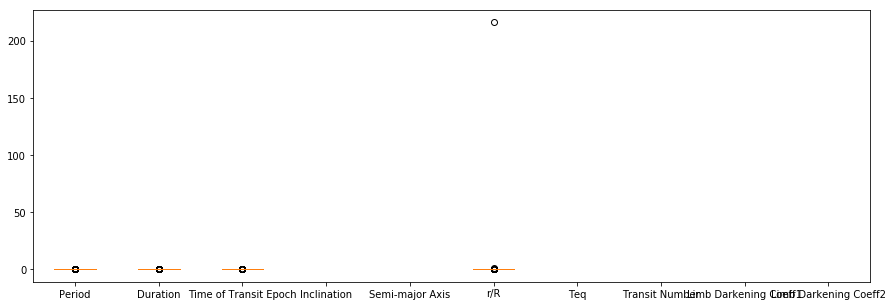

,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
count,1.776000e+03,1.776000e+03,1.776000e+03,0.0,0.0,1776.000000,0.0,0.0,0.0,0.0
mean,7.297788e-14,6.433805e-06,1.560230e-10,NaN,NaN,0.131200,NaN,NaN,NaN,NaN
std,2.735139e-13,6.182039e-06,2.623024e-10,NaN,NaN,5.128310,NaN,NaN,NaN,NaN
min,1.014196e-17,4.219924e-08,3.351447e-13,NaN,NaN,0.000269,NaN,NaN,NaN,NaN
25%,4.099983e-15,2.705080e-06,3.852238e-11,NaN,NaN,0.002940,NaN,NaN,NaN,NaN
50%,1.438656e-14,4.760940e-06,1.155671e-10,NaN,NaN,0.004894,NaN,NaN,NaN,NaN
75%,4.654974e-14,8.331645e-06,1.926119e-10,NaN,NaN,0.011959,NaN,NaN,NaN,NaN
max,5.258796e-12,6.492191e-05,4.853820e-09,NaN,NaN,216.124642,NaN,NaN,NaN,NaN


In [86]:
### boxplot de las variables..
plt.figure(figsize=(15,5))
plt.boxplot(Ystd_train_err)
plt.xticks(np.arange(len(metadata_used))+1,metadata_used)
#plt.ylim(-0.2,1)
plt.show()
aux_df = pd.DataFrame(Ystd_train_err)
aux_df.columns = metadata_used
aux_df.describe()

In [9]:
Ystd_train_err[mask_nan_err[mask_train_conf]] = np.nanmin(Ystd_train_err)


In [11]:
Ystd_train_err[mask_nan_err[mask_train_conf]] = 1
#Ystd_test_err[mask_nan_err[mask_test_conf]] = 1

from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler
scaler_meta_err = MinMaxScaler(feature_range=(1, 100)) #o un shift de 1...

Ystd_train_err = scaler_meta_err.fit_transform(Ystd_train_err)
#Ystd_test_err = scaler_meta_err.transform(Ystd_test_err)

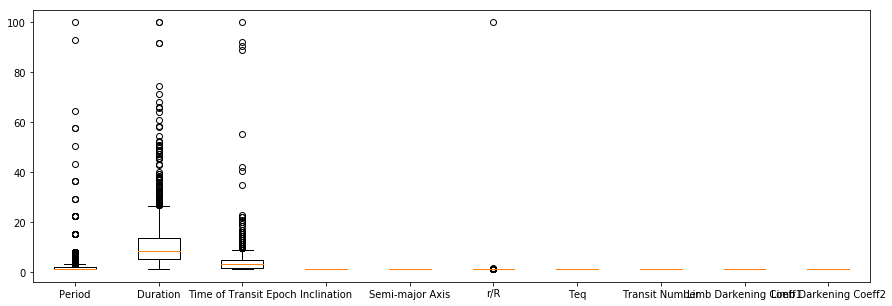

,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
count,1776.000000,1776.000000,1776.000000,1776.0,1776.0,1776.000000,1776.0,1776.0,1776.0,1776.0
mean,2.373664,10.752956,4.175677,1.0,1.0,1.059976,1.0,1.0,1.0,1.0
std,5.149073,9.433177,5.350369,0.0,0.0,2.349123,0.0,0.0,0.0,0.0
min,1.000000,1.000000,1.000000,1.0,1.0,1.000000,1.0,1.0,1.0,1.0
25%,1.076994,5.063291,1.778932,1.0,1.0,1.001224,1.0,1.0,1.0,1.0
50%,1.270645,8.200330,3.350469,1.0,1.0,1.002119,1.0,1.0,1.0,1.0
75%,1.876138,13.648872,4.922007,1.0,1.0,1.005355,1.0,1.0,1.0,1.0
max,100.000000,100.000000,100.000000,1.0,1.0,100.000000,1.0,1.0,1.0,1.0


In [12]:
### boxplot de las variables..
plt.figure(figsize=(15,5))
plt.boxplot(Ystd_train_err)
plt.xticks(np.arange(len(metadata_used))+1,metadata_used)
plt.show()
aux_df = pd.DataFrame(Ystd_train_err)
aux_df.columns = metadata_used
aux_df.describe()

### Read light curves processed (detrended)

(8054, 71427)


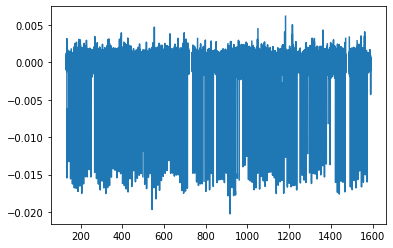

In [6]:
time_kepler = np.load(folder_lc+"npy/KOI_LC_time.npy")
#lc_kepler = np.load(folder_lc+"npy/KOI_LC_init.npy" )
process_lc = np.load(folder_lc+'/cleaned/LC_kepler_processed.npy')
N, T = time_kepler.shape
print((N,T))

plt.plot(time_kepler[0],process_lc[0])
plt.show()

In [7]:
time_kepler = time_kepler[mask_conf]
process_lc = process_lc[mask_conf]
N, T = time_kepler.shape
print((N,T))

(2281, 71427)


## Generate representation
> Continous values (with zeros)  
>> **Selected:** Coupled values (adding time) + delta time

In [8]:
for i in range(N):
    if i%1000 == 0:
        print("Va en el ",i)
    time_kepler[i], process_lc[i] = generate_representation(time_kepler[i], process_lc[i])

Va en el  0
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423941 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampli

New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old le

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old le

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old le

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old le

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old le

In [9]:
#borrar nans... arreglo variable
coupled_lc = []
coupled_time = []
delta_time = []
for i in range(N):
    mask_nan_aux = np.isnan(process_lc[i])
    coupled_lc.append(process_lc[i][~mask_nan_aux])
    
    time = time_kepler[i][~mask_nan_aux]
    # calculate delta time --> this could be done after padding is done..
    delta_time.append(np.hstack([[0],np.diff(time)]))
    coupled_time.append(time)
    
coupled_lc = np.asarray(coupled_lc)
coupled_time = np.asarray(coupled_time)
delta_time = np.asarray(delta_time)
coupled_time

array([array([ 131.5127147 ,  131.53314799,  131.55358129, ..., 1590.94020852,
       1590.96064181, 1590.98107511]),
       array([ 131.5126641 ,  131.53309739,  131.55353069, ..., 1590.94017122,
       1590.96060451, 1590.98103781]),
       array([ 131.5127088 ,  131.53314209,  131.55357539, ..., 1590.94023102,
       1590.96066431, 1590.98109761]),
       ...,
       array([ 131.5119906,  131.5324239,  131.5528572, ..., 1590.9400861,
       1590.9605194, 1590.9809527]),
       array([ 131.5119561,  131.5323894,  131.5528227, ..., 1590.9400454,
       1590.9604787, 1590.980912 ]),
       array([ 131.5119643,  131.5323976,  131.5528309, ..., 1590.9400596,
       1590.9604929, 1590.9809262])], dtype=object)

### Process --scale and center
> center?  
> With what value scale? (min, iqr, std)  
> Multiplicar por -1 por los max pooling?
>> **Selected:** normalizar (unit variance) --already median centered 

In [10]:
#pre-process seleccionado

coupled_lc_scaled = []
for i in range(coupled_lc.shape[0]):
    std_i = coupled_lc[i].std(keepdims=True)
    coupled_lc_scaled.append( coupled_lc[i]/std_i )
coupled_lc_scaled = np.asarray(coupled_lc_scaled)
coupled_lc_scaled.shape

(2281,)

In [11]:
#flip/mirror cada curva de luz.. (así se duplican los datos..) time: tambn y shift del 0 que sobra..

flip_coupled_lc_scaled = []
flip_delta_time = []
for i in range(coupled_lc.shape[0]):    
    flip_coupled_lc_scaled.append( coupled_lc_scaled[i][::-1] )
    flip_delta_time.append(  np.hstack([[0], delta_time[i][1:][::-1]]) )
    
flip_coupled_lc_scaled = np.asarray(flip_coupled_lc_scaled)
flip_delta_time = np.asarray(flip_delta_time)


delta_time = np.concatenate([flip_delta_time,delta_time])
coupled_lc_scaled = np.concatenate([flip_coupled_lc_scaled,coupled_lc_scaled])

del flip_delta_time, flip_coupled_lc_scaled
gc.collect()
coupled_lc_scaled.shape

(4562,)

### Padding for Keras

In [12]:
lens_lc = list(map(len,coupled_time))
max_len = np.max(lens_lc)

max_len = 64482 #as were builded


## do padding with keras..
X_time = keras.preprocessing.sequence.pad_sequences(delta_time,maxlen=max_len, value=0,dtype='float32',padding='post')
X_lc_scaled = keras.preprocessing.sequence.pad_sequences(coupled_lc_scaled,maxlen=max_len, value=0,dtype='float32',padding='post')
print("Shape with padding: ", X_lc_scaled.shape)

#need data with extra dim
X_lc_scaled = np.expand_dims(np.squeeze(X_lc_scaled),axis=-1)
X_time = np.expand_dims(np.squeeze(X_time),axis=-1)

T = X_lc_scaled.shape[1]
channels = 2
print("Shape with extra-dim: ", X_lc_scaled.shape)

X_lc_scaled

Shape with padding:  (4562, 64482)
Shape with extra-dim:  (4562, 64482, 1)


array([[[-0.08730856],
        [-3.0120108 ],
        [ 0.06760287],
        ...,
        [ 0.        ],
        [ 0.        ],
        [ 0.        ]],

       [[-0.27543724],
        [-9.160291  ],
        [ 0.7185589 ],
        ...,
        [ 0.        ],
        [ 0.        ],
        [ 0.        ]],

       [[-0.15168639],
        [ 1.1390879 ],
        [-0.31746146],
        ...,
        [ 0.        ],
        [ 0.        ],
        [ 0.        ]],

       ...,

       [[-0.40176523],
        [ 0.55774933],
        [ 0.        ],
        ...,
        [ 0.        ],
        [ 0.        ],
        [ 0.        ]],

       [[-0.96442634],
        [ 1.0596648 ],
        [ 0.4071325 ],
        ...,
        [ 0.        ],
        [ 0.        ],
        [ 0.        ]],

       [[ 1.0009062 ],
        [ 0.29136676],
        [-1.8706189 ],
        ...,
        [ 0.        ],
        [ 0.        ],
        [ 0.        ]]], dtype=float32)

### Load Encoder

In [13]:
from keras import backend as K
from keras.models import Sequential, Model
from keras.layers import Input, Conv1D, Dense, Flatten, MaxPool1D, Reshape, UpSampling1D, Lambda, AveragePooling1D
from keras.layers import GlobalAveragePooling1D,GlobalMaxPool1D, TimeDistributed, GRU,LSTM, RepeatVector
from keras.layers import BatchNormalization, Dropout, ZeroPadding1D, ZeroPadding2D, Cropping1D, Cropping2D, Conv2D, Conv2DTranspose, MaxPool2D,UpSampling2D

from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot

In [18]:
def conv_bloq(it, filters, kernel_s, pool, conv_pool=False, BN=False, drop=0,padding='same',dil_r=1, act='relu', double=True):
    f1 = Conv1D(filters, kernel_s, strides=1, padding=padding, activation=act,dilation_rate=dil_r)(it)
    if BN:
        f1 = BatchNormalization()(f1)
    if double:
        f1 = Conv1D(filters, kernel_s, strides=1, padding=padding, activation=act,dilation_rate=dil_r)(f1)
        if BN:
            f1 = BatchNormalization()(f1)
    if pool!= 0 and dil_r ==1:
        if conv_pool:
            f1 = Conv1D(filters, kernel_s, strides=pool, padding='valid')(f1)
            if BN:
                f1 = BatchNormalization()(f1)
        else:
            #f1 = MaxPool1D(pool_size=pool, strides=pool, padding='valid')(f1)
            f1 = AveragePooling1D(pool_size=pool, strides=pool, padding='valid')(f1)
    if drop != 0:
        f1 = Dropout(drop)(f1)
    return f1

def sum_bloq(it, pool, filters=1, kernel_s=1, conv_pool=False, BN=False):
    if conv_pool: ###### check this
        f1 = Conv1D(filters, kernel_s, strides=pool, padding='valid')(it)
        if BN:
            f1 = BatchNormalization()(f1)
    else:
        f1 = AveragePooling1D(pool_size=pool, strides=pool, padding='valid')(it)
        f1 = Lambda(lambda x: p_s*x)(f1) #revert average to sum
    return f1

def rnn_bloq(it, units, layers=1, bid=False, gru=True, drop=0):
    f1 = it
    for i in range(layers):
        if gru:
            layer_rec = GRU(units, return_sequences=True)#(i < layers - 1))
        else:
            layer_rec = LSTM(units, return_sequences=True)#(i < layers - 1))
        if bid:
            f1 = Bidirectional(layer_rec)(f1)
        else:
            f1 = layer_rec(f1)
        if drop > 0.0 and i > 0:  # skip these for first layer for symmetry
            f1 = Dropout(drop)(f1)
    return f1
        
def deconv_bloq(it, filters, kernel_s, pool, conv_pool=False, BN=False, drop=0,padding='same',dil_r=1,act='relu', double=True):
    f1 = it
    if pool != 0 and dil_r ==1:
        if conv_pool:
            f1 = Conv2DTranspose(filters, (kernel_s,1), strides=(pool,1), padding=padding)(f1)
            if BN:
                f1 = BatchNormalization()(f1)
        else:
            f1 = Lambda(lambda x: K.expand_dims(x, axis=-2))(f1) #along channel axis-to process with conv2d
            f1 = UpSampling2D((pool,1))(f1)
            f1 = Lambda(lambda x: K.squeeze(x, axis=-2))(f1)
            
    f1 = Conv1D(filters, kernel_s, strides=1, padding=padding, activation=act, dilation_rate=dil_r)(f1)
    if BN:
        f1 = BatchNormalization()(f1)
    if double:
        f1 = Conv1D(filters, kernel_s, strides=1, padding=padding, activation=act, dilation_rate=dil_r)(f1)
        if BN:
            f1 = BatchNormalization()(f1)
    if drop != 0:
        f1 = Dropout(drop)(f1)
    return f1

def encoder_model_CNN1D(input_dim, channels, L=1, filters=8,kernel_s =10,
                        pool=5,BN=False,conv_pool=False,drop=0,padding='same',dil_r=1,fix_time=False, double=True): #parametros estructurales
    it = Input(shape=(input_dim,channels))  #fixed length..
    f1 = it
  
    for l in range(L):
        filters_u = min(128,filters) #max 128 filters
        if fix_time and dil_r != 1:
            f1 = sum_bloq(f1, pool, filters=filters, kernel_s=kernel_s, conv_pool=conv_pool, BN=BN)
        else:
            f1 = conv_bloq(f1, filters_u, kernel_s, pool,BN=BN,conv_pool=conv_pool, drop=drop,padding=padding,dil_r=dil_r, double=double) 
        
        filters = int(filters*2)
        if dil_r != 1:
            dil_r = int(dil_r*2)
    return Model(inputs=it, outputs=f1)


def decoder_model_CNN2D(input_dim, channels, T=0, L=1, filters=8,kernel_s=10,
                    pool=5,BN=False,conv_pool=False,drop=0,padding='same',dil_r=1, double=True): #parametros estructurales  
    it = Input(shape=input_dim)
    f1 = it
    filters = int(filters*2**(L-1))
    
    for _ in range(L):
        filters_u = min(128,filters)
        f1 = deconv_bloq(f1, filters_u, kernel_s, pool,conv_pool=conv_pool,BN=BN,drop=drop,padding=padding,dil_r=dil_r,double=double)
        
        filters = int(filters/2)
        if dil_r != 1:
            dil_r = int(dil_r*2) #o al igual que filtros dividir??
    out_x = Conv1D(channels, kernel_s, strides=1, padding=padding, activation='linear')(f1)
    
    if T != 0:
        T_model = K.int_shape(out_x)[1]
        delta_T = T - T_model
        padd_len = int(np.abs(delta_T/2))
        if np.abs(delta_T) % 2 ==0:
            left_pad = right_pad = padd_len                
        else:
            left_pad = padd_len+1
            right_pad = padd_len
            
        if delta_T > 0:
            out_x = ZeroPadding1D((0, delta_T))(out_x)
        elif delta_T < 0:
            out_x = Cropping1D((left_pad, right_pad))(out_x)
    return Model(inputs=it, outputs=out_x)

def mse_masked(y_true, y_pred):
    """ Masked on 0 value.."""
    mask = K.cast(K.not_equal(y_true, 0), K.floatx())
    e = (y_true - y_pred)*mask
    return K.sum(K.square(e), axis=-1)  #dividir por el error??

def train_model(model,X,y,epochs=1,batch_size=32, initial_epoch=0):
    return model.fit(X,y, epochs=epochs, batch_size=batch_size,initial_epoch=initial_epoch)



In [47]:
def op4_GRU(it_time, it_lc, T, aux_time=False, fix_time=False, L = 5, filters=16, double=True):
    encoder = encoder_model_CNN1D(T, 1, L=L, filters=filters, pool=2,kernel_s=5, drop=0, double=double) #model
    encoder.name = "LC_encoder"
    encoder_t = encoder_model_CNN1D(T, 1, L=L, filters=filters, pool=2,kernel_s=5, drop=0, fix_time=fix_time, double=double)
    encoder_t.name= "Time_encoder"
    inp_dim = encoder.output_shape[1:] 

    encoder_lc = encoder(it_lc)
    encoder_time = encoder_t(it_time)
    concat_encoder = keras.layers.Concatenate()([encoder_time,encoder_lc]) #or multiply?
    f1_out = rnn_bloq(concat_encoder, units=inp_dim[1], layers=1, bid=False, gru=True, drop=0)
    encoder_model = Model(inputs=[it_time,it_lc],outputs=f1_out)
    encoder_model.name = "encoder"
    encoder_model.summary()    
    print("Parametros Encodero: ",encoder_model.count_params())

    out_dim = encoder_model.output_shape[1:] 
    it_embd = Input(shape= out_dim)
    
    if aux_time:
        concat_decoder = keras.layers.Concatenate()([encoder_time, it_embd]) #or multiply?
        out_dim = (out_dim[0],out_dim[1] + encoder_t.output_shape[2])
    decoder = decoder_model_CNN2D(out_dim, 1, L=L, filters=filters, pool=2, kernel_s=5,T=T, drop=0, double=True) #model
    if aux_time:
        decoder_model = Model(inputs=[it_time, it_embd], outputs=decoder(concat_decoder) )
    else:
        decoder_model = Model(inputs=it_embd, outputs=decoder(it_embd))
    decoder_model.name = "decoder"
    decoder_model.summary()
    print("Parametros decoder: ",decoder_model.count_params())
    return encoder_model, decoder_model

it_time = Input(shape=X_time.shape[1:], name='time_input')
it_lc = Input(shape=X_lc_scaled.shape[1:], name='lc_input')


Model: "encoder"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
time_input (InputLayer)         (None, 64482, 1)     0                                            
__________________________________________________________________________________________________
lc_input (InputLayer)           (None, 64482, 1)     0                                            
__________________________________________________________________________________________________
Time_encoder (Model)            (None, 2015, 128)    327216      time_input[0][0]                 
__________________________________________________________________________________________________
LC_encoder (Model)              (None, 2015, 128)    327216      lc_input[0][0]                   
____________________________________________________________________________________________

In [ ]:
encoder_model, decoder_model = op4_GRU(it_time,it_lc, T, aux_time=True, L=5, filters=16, double=True, fix_time=False) 
autoencoder = Model([it_time,it_lc],  decoder_model([it_time, encoder_model([it_time,it_lc])] )) 

autoencoder.load_weights("./models_det/GRUT_16U_5L_1D_AEweight.h5")

autoencoder.summary()

In [43]:
### load encoder..
#encoder_model = keras.models.load_model("./trained_models/En_op4.h5")
#encoder_model = keras.models.load_model("./trained_models/En_op5.h5")
#encoder_model = keras.models.load_model("./trained_models/En_op4_doubleE.h5")
#encoder_model = keras.models.load_model("./trained_models/En_op4_doubleSimple.h5")
encoder_model = keras.models.load_model("./trained_models/En_op4_doubleSimple_Tsim.h5")

#encoder_model = keras.models.load_model("./trained_models/En_op4_double_GRU1.h5")
#encoder_model = keras.models.load_model("./trained_models/En_op4_double_GRU1_Tsim.h5")

encoder_model.summary()

OSError: Unable to open file (unable to open file: name = './trained_models/En_op4_doubleSimple_Tsim.h5', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

In [46]:
keras.losses.mse_masked = keras.losses.mse

## comparacion entrenados..
name_model= "op4_grut" #op4_dtsimple

ae_model = keras.models.load_model("./models/"+name_model+"_AE.h5")
values = np.loadtxt("./models/"+name_model+"_hist.txt")
plt.plot(values)
plt.show()

encoder_model = ae_model.get_layer("encoder")
encoder_model.summary()

SVG(model_to_dot(encoder_model).create(prog='dot', format='svg'))

SystemError: unknown opcode

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
time_input (InputLayer)         (None, 64482, 1)     0                                            
__________________________________________________________________________________________________
lc_input (InputLayer)           (None, 64482, 1)     0                                            
__________________________________________________________________________________________________
Time_encoder (Model)            (None, 2015, 32)     46560       time_input[0][0]                 
__________________________________________________________________________________________________
LC_encoder (Model)              (None, 2015, 128)    164056      lc_input[0][0]                   
__________________________________________________________________________________________________
concatenat

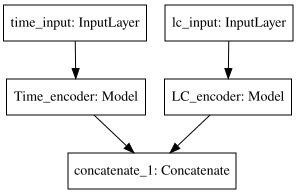

In [31]:
### just the concatenate part..
encoder_model.layers.pop()
encoder_model.outputs = [encoder_model.layers[-1].output]
encoder_model.layers[-1].outbound_nodes = []
encoder_model.summary()

SVG(model_to_dot(encoder_model).create(prog='dot', format='svg'))

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
time_input (InputLayer)         (None, 64482, 1)     0                                            
__________________________________________________________________________________________________
lc_input (InputLayer)           (None, 64482, 1)     0                                            
__________________________________________________________________________________________________
Time_encoder (Model)            (None, 2015, 128)    164056      time_input[0][0]                 
                                                                 time_input[0][0]                 
__________________________________________________________________________________________________
LC_encoder (Model)              (None, 2015, 128)    164056      lc_input[0][0]                   
__________

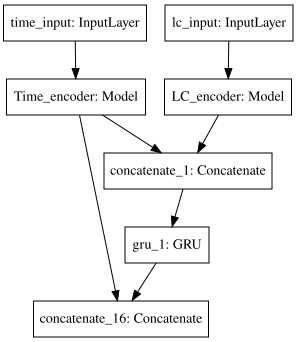

In [59]:
### add time
new_inp = encoder_model.inputs
out_l = encoder_model.outputs[0]
out_t = encoder_model.get_layer("Time_encoder")(new_inp[0])
encoder_model = Model(new_inp , keras.layers.Concatenate()([out_t, out_l]) )
encoder_model.summary()

SVG(model_to_dot(encoder_model).create(prog='dot', format='svg'))

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 64482, 1)          0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 64482, 8)          48        
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 64482, 8)          328       
_________________________________________________________________
average_pooling1d_1 (Average (None, 32241, 8)          0         
_________________________________________________________________
conv1d_3 (Conv1D)            (None, 32241, 16)         656       
_________________________________________________________________
conv1d_4 (Conv1D)            (None, 32241, 16)         1296      
_________________________________________________________________
average_pooling1d_2 (Average (None, 16120, 16)         0         
__________

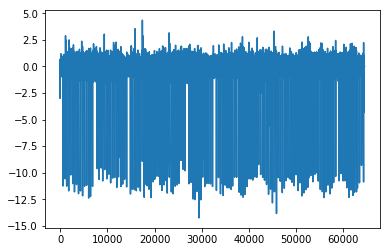

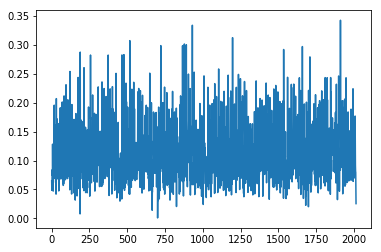

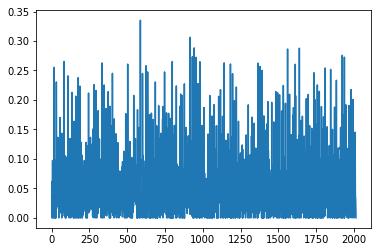

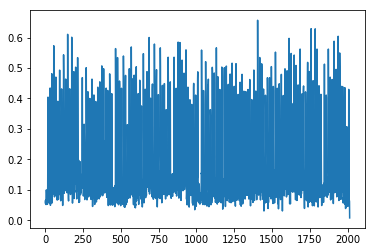

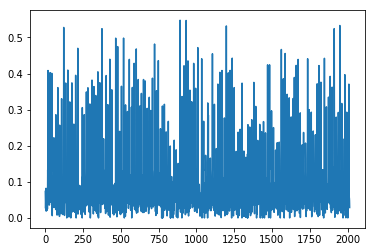

...

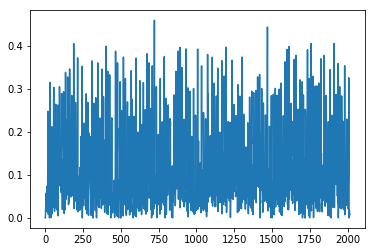

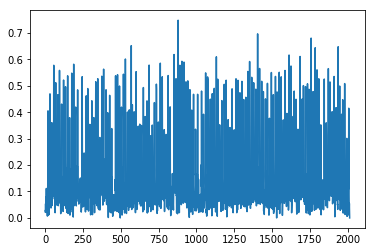

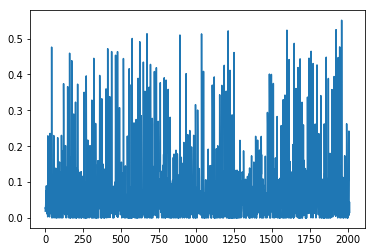

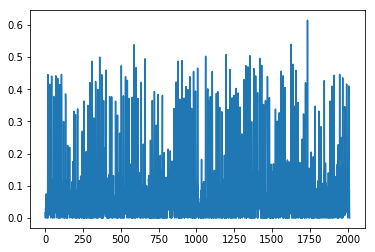

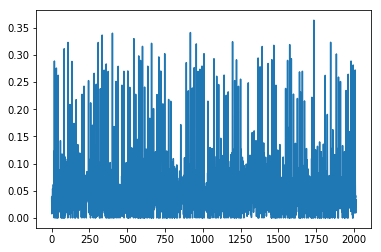

De 128 filtros, se utilizan 119 en promedio


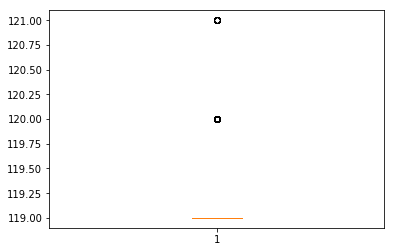

In [45]:
##light encoder?
lc_encoder = encoder_model.get_layer("LC_encoder")
lc_encoder.summary()

X_lc_encoder  = lc_encoder.predict(X_lc_scaled[:N], batch_size=512)

n_s = 0
plt.plot(X_lc_scaled[n_s])
plt.show()

for i in range(X_lc_encoder.shape[-1]):
    plt.plot(X_lc_encoder[n_s][:,i])
    plt.show()
    
usados = []
for n in range(N):
    aux = 0
    for i in range(X_lc_encoder.shape[-1]):
        if np.sum(X_lc_encoder[n][:,i]) > 0:
            aux +=1
    usados.append(aux)
print("De %d filtros, se utilizan %d en promedio"%(X_lc_encoder.shape[-1],np.mean(usados)))
plt.boxplot(usados)
plt.show()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 64482, 1)          0         
_________________________________________________________________
conv1d_11 (Conv1D)           (None, 64482, 8)          48        
_________________________________________________________________
conv1d_12 (Conv1D)           (None, 64482, 8)          328       
_________________________________________________________________
average_pooling1d_6 (Average (None, 32241, 8)          0         
_________________________________________________________________
conv1d_13 (Conv1D)           (None, 32241, 16)         656       
_________________________________________________________________
conv1d_14 (Conv1D)           (None, 32241, 16)         1296      
_________________________________________________________________
average_pooling1d_7 (Average (None, 16120, 16)         0         
__________

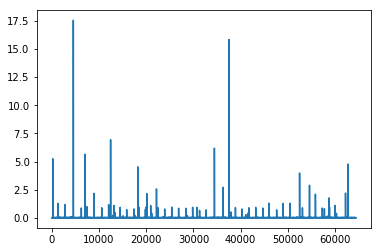

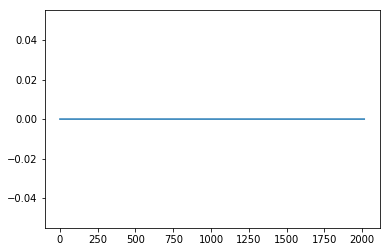

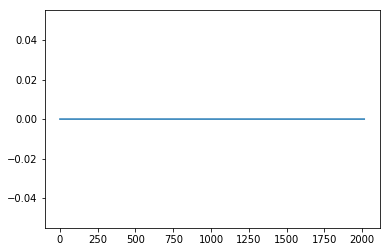

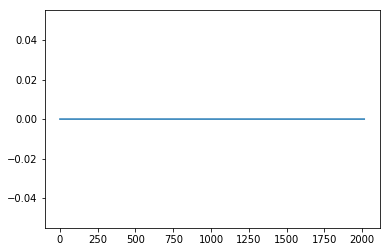

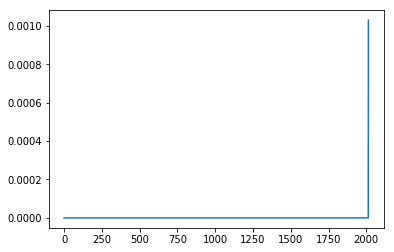

...

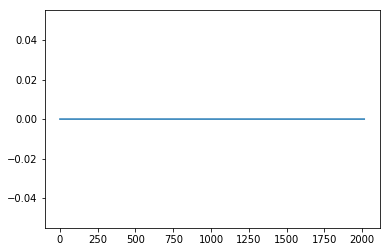

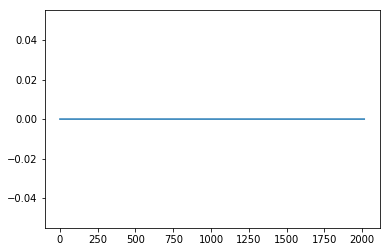

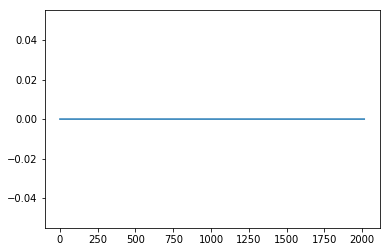

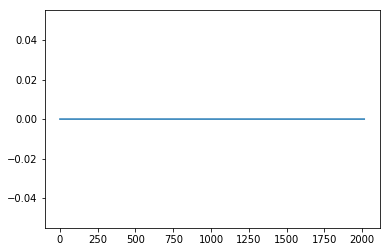

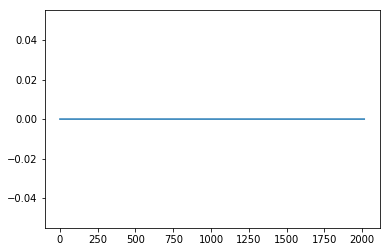

De 128 filtros, se utilizan 13 en promedio


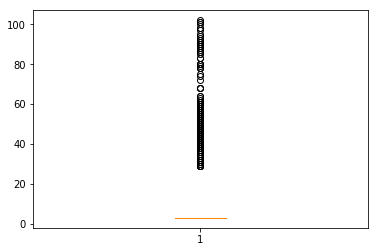

In [46]:
#time encoded..
time_encoder = encoder_model.get_layer("Time_encoder")
time_encoder.summary()

X_time_encoder  = time_encoder.predict(X_time[:N], batch_size=512)

n_s = 0
plt.plot(X_time[n_s])
plt.show()

for i in range(X_time_encoder.shape[-1]):
    plt.plot(X_time_encoder[n_s][:,i])
    plt.show()
    
usados = []
for n in range(N):
    aux = 0
    for i in range(X_time_encoder.shape[-1]):
        if np.sum(X_time_encoder[n][:,i]) > 0:
            aux +=1
    usados.append(aux)
print("De %d filtros, se utilizan %d en promedio"%(X_time_encoder.shape[-1],np.mean(usados)))
plt.boxplot(usados)
plt.show() ### reducir los filtros de tiempo..

In [60]:
#encode light curves...
X_lc_scaled_real = X_lc_scaled[:N] 
X_lc_scaled_aug  = X_lc_scaled[N:] 
X_time_real = X_time[:N] 
X_time_aug  = X_time[N:] 

#X_enc_lc_real  = encoder_model.predict(np.concatenate([X_lc_scaled_real,X_time_real],axis=2), batch_size=512)
#X_enc_lc_aug  = encoder_model.predict(np.concatenate([X_lc_scaled_aug,X_time_aug],axis=2), batch_size=512)

#X_enc_lc_real  = encoder_model.predict([X_lc_scaled_real, X_time_real], batch_size=512)
#X_enc_lc_aug  = encoder_model.predict([X_lc_scaled_aug, X_time_aug], batch_size=512)

#tiempo por delante
X_enc_lc_real  = encoder_model.predict([X_time_real, X_lc_scaled_real], batch_size=512)
X_enc_lc_aug  = encoder_model.predict([X_time_aug, X_lc_scaled_aug], batch_size=512)
X_enc_lc_real.shape

(2281, 2015, 256)

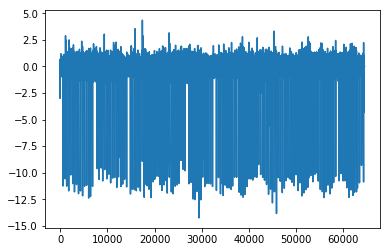

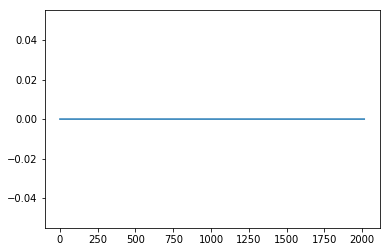

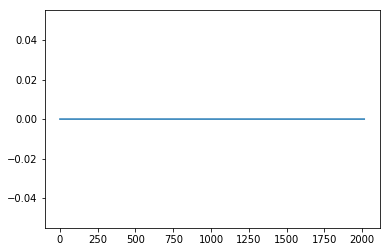

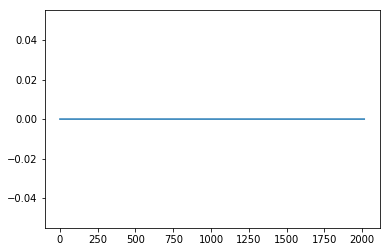

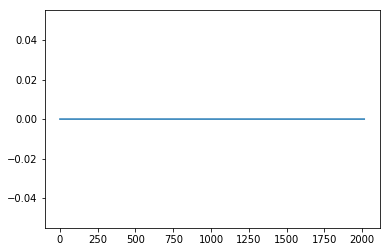

...

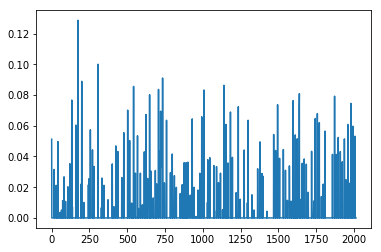

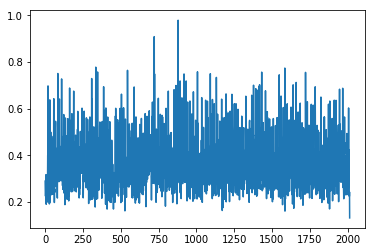

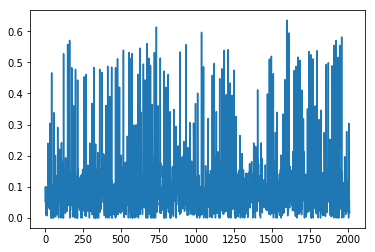

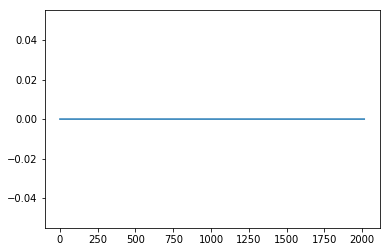

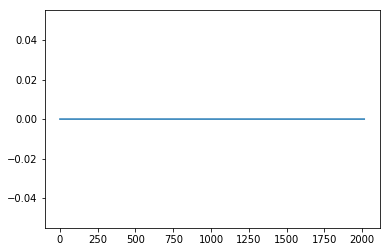

In [29]:
n_s = 0
plt.plot(X_lc_scaled_real[n_s])
plt.show()

for i in range(X_enc_lc_real.shape[-1]):
    plt.plot(X_enc_lc_real[n_s][:,i])
    plt.show()

In [61]:
X_train = np.concatenate([X_enc_lc_real[mask_train[mask_conf]], X_enc_lc_aug[mask_train[mask_conf]]], axis=0)
#X_train = np.concatenate([X_enc_lc_real[mask_train[:]], X_enc_lc_aug[mask_train[:]]], axis=0)

if Ystd_train.shape[0] != X_train.shape[0]:
    Ystd_train = np.tile(Ystd_train, (2,1))

X_test = X_enc_lc_real[mask_test[mask_conf]]
#X_test = X_enc_lc_real[mask_test_conf]

print("X train shape: ",X_train.shape)
print("X test shape: ",X_test.shape)
print("Y train shape: ",Ystd_train.shape)
print("Y test shape: ",Ystd_test.shape)

X train shape:  (3552, 2015, 256)
X test shape:  (505, 2015, 256)
Y train shape:  (3552, 14)
Y test shape:  (505, 14)


### Define Encoder-Metadata

In [54]:
import keras
from keras.models import Sequential
from keras.layers import *
import tensorflow as tf

def mse_masked(y_true, y_pred):
    """ Masked on 0 value.."""
    #mask = K.cast(K.not_equal(y_true, 0), K.floatx())
    e = (y_true - y_pred)*mask
    return K.mean(K.square(e), axis=-1)  #dividir por el error??

def train_model(model,X,y,epochs=1,batch_size=32, val_split=0.0, verb=1):
    return model.fit(X,y, epochs=epochs, batch_size=batch_size, validation_split=val_split, verbose=verb)

#autoencoder.compile(loss=[mse_masked],optimizer='adam')
#autoencoder.compile(loss=[titled_loss(0.1)],optimizer='adam') #0.05

In [55]:
class KMaxPooling(keras.engine.Layer):
    """
    K-max pooling layer that extracts the k-highest activations from a sequence (2nd dimension). TensorFlow backend.
    """
    def __init__(self, k=1, **kwargs):
        super().__init__(**kwargs)
        self.input_spec = keras.engine.InputSpec(ndim=3)
        self.k = k

    def compute_output_shape(self, input_shape):
        return (input_shape[0], self.k, input_shape[2])

    def call(self, inputs):
        # swap last two dimensions since top_k will be applied along the last dimension
        shifted_input = tf.transpose(inputs, [0, 2, 1]) 
        # extract top_k, returns two tensors [values, indices]
        top_k = tf.nn.top_k(shifted_input, k=self.k, sorted=True, name=None)[0] 
        return tf.transpose(top_k, [0, 2, 1])

import math
def K_l(L,seq_len,k_top,layer=1): #dinamyc k-max
    return max(k_top, math.ceil( seq_len*(L-layer)/L) )

def add_conv_bloq(model, filters, kernel_s, BN=False, drop=0,padding='same',dil_r=1):
    model.add(Conv1D(filters, kernel_s, strides=1, padding=padding, activation='relu',dilation_rate=dil_r))
    if BN:
        model.add(BatchNormalization())
    if dil_r == 1:
        model.add(Conv1D(filters, kernel_s, strides=1, padding=padding, activation='relu',dilation_rate=dil_r))
        if BN:
            model.add(BatchNormalization())
    if drop != 0:
        model.add(Dropout(drop))

#build model functions..
def build_simple_model(inp_shape,out_shape, units, L =1, drop=0):
    model = Sequential()
    model.add(GlobalAveragePooling1D(input_shape=inp_shape))
    for l in range(L):
        model.add(Dense(units, activation='relu'))
        units = int(units/2)
        if drop > 0.0:
            model.add(Dropout(drop))
    model.add(Dense(out_shape, activation='linear'))
    return model

def build_rnn_model(inp_shape, out_shape, units, layers=1, bid=False, gru=True, drop=0):
    #que achique las unidades?
    model = Sequential()
    model.add(InputLayer(input_shape=inp_shape))
    for i in range(layers):
        if gru:
            layer_rec = GRU(units, return_sequences=(i < layers - 1))
        else:
            layer_rec = LSTM(units, return_sequences=(i < layers - 1))            
        if bid:
            layer_rec = Bidirectional(layer_rec)
        
        model.add(layer_rec)
        if drop > 0.0:
            model.add(Dropout(drop))
    model.add(Dense(64,activation='relu'))
    if drop>0:
        model.add(Dropout(drop))
    model.add(Dense(out_shape, activation='linear'))
    return model

def build_cnn_model(inp_shape, out_shape, units, L=1, kernel_s =10,
                        pool=5,BN=False,conv_pool=False,drop=0,padding='same',dil_r=1 ): #parametros estructurales
    model = Sequential()
    model.add(InputLayer(input_shape=inp_shape))
    for _ in range(L):
        add_conv_bloq(model, units, kernel_s, BN=BN,drop=drop,padding=padding,dil_r=dil_r)
        if pool!= 0 and dil_r ==1:
            if conv_pool:
                model.add(Conv1D(filters, kernel_s, strides=pool, padding='valid'))
                if BN:
                    model.add(BatchNormalization())
            else:
                #model.add(MaxPool1D(pool_size=pool, strides=pool, padding='valid'))
                model.add(AveragePooling1D(pool_size=pool, strides=pool, padding='valid'))

        if dil_r != 1:
            dil_r = int(dil_r*2)
        else:
            units = int(units*2)
            
    if dil_r != 1:
        model.add(Lambda(lambda x: x[:, -1, :])) # o dejar el global
    else:
        model.add(GlobalAveragePooling1D())
    
    model.add(Dense(64,activation='relu'))
    if drop>0:
        model.add(Dropout(drop))
    model.add(Dense(out_shape, activation='linear'))
    return model

def build_kpool_model(inp_shape, out_shape, units, L=1,kernel_s =10, K_top=500,
                        BN = False, drop=0, padding='same'): #parametros estructurales
    model = Sequential()
    model.add(InputLayer(input_shape=inp_shape))
    for l in range(L):
        add_conv_bloq(model, units, kernel_s, BN=BN,drop=drop,padding=padding)

        model.add(KMaxPooling(k = K_l(L, inp_shape[0], K_top, layer=l+1)))
        units = int(units*2)
    
    model.add(GlobalAveragePooling1D())  #u otra cosa
    
    model.add(Dense(64,activation='relu'))
    if drop>0:
        model.add(Dropout(drop))
    model.add(Dense(out_shape, activation='linear'))
    return model

In [ ]:
#ver si sacar la capa densa entremedio...

### RNN model

In [27]:
model_gru = build_rnn_model(X_train.shape[1:], Y_train.shape[1], 128, layers=1, bid=False, gru=True, drop=0.2)
model_gru.compile(loss='mse', optimizer='adam')
model_gru.summary()
hist = train_model(model_gru, X_train, Ystd_train, epochs=50, batch_size=64, val_split=0.2)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 796, 64)           0         
_________________________________________________________________
gru_1 (GRU)                  (None, 128)               74112     
_________________________________________________________________
dropout_5 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_5 (Dense)              (None, 64)                8256      
_________________________________________________________________
dropout_6 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense_6 (Dense)              (None, 10)                650       
Total params: 83,018
Trainable params: 83,018
Non-trainable params: 0
_________________________________________________________________
Train 

KeyboardInterrupt: 

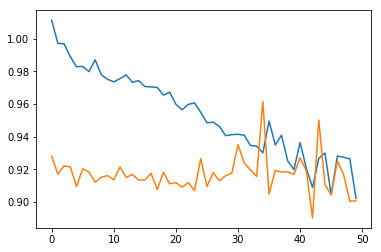

In [39]:
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

### Simple

In [36]:
model_simple = build_simple_model(X_train.shape[1:], Ystd_train.shape[1], 64)

#expand dim
model_simple.add(Lambda(lambda x: K.expand_dims(x, axis=-1)))
model_simple.compile(loss='mse', optimizer='adam', sample_weight_mode="temporal")
model_simple.summary()

s_weight = 1. / Ystd_train_err
#sample_weight[np.isnan(sample_weight)] = 0.0
model_simple.fit(X_train, np.expand_dims(Ystd_train,axis=-1), epochs=100, batch_size=64, validation_split=0.2,
                 sample_weight=s_weight)
model_simple.pop()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
global_average_pooling1d_4 ( (None, 128)               0         
_________________________________________________________________
dense_7 (Dense)              (None, 64)                8256      
_________________________________________________________________
dense_8 (Dense)              (None, 10)                650       
_________________________________________________________________
lambda_2 (Lambda)            (None, 10, 1)             0         
Total params: 8,906
Trainable params: 8,906
Non-trainable params: 0
_________________________________________________________________
Train on 2841 samples, validate on 711 samples
Epoch 1/100
2841/2841 [==============================] - 4s 1ms/step - loss: 0.7661 - val_loss: 0.7259
Epoch 2/100
2841/2841 [==============================] - 3s 1ms/step - loss: 0.7597 - val_loss: 0.7216
Epoch 3/100
2841/28

In [24]:
model_simple = build_simple_model(X_train.shape[1:], Ystd_train.shape[1], 64)
model_simple.compile(loss='mse', optimizer='adam')
model_simple.summary()
hist = train_model(model_simple, X_train, Ystd_train, epochs=50, batch_size=64, val_split=0.2)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
global_average_pooling1d_1 ( (None, 128)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 64)                8256      
_________________________________________________________________
dense_2 (Dense)              (None, 14)                910       
Total params: 9,166
Trainable params: 9,166
Non-trainable params: 0
_________________________________________________________________
Train on 7507 samples, validate on 1877 samples
Epoch 1/50
7507/7507 [==============================] - 21s 3ms/step - loss: 1.0108 - val_loss: 0.8367
Epoch 2/50
7507/7507 [==============================] - 23s 3ms/step - loss: 0.9857 - val_loss: 0.8231
Epoch 3/50
7507/7507 [==============================] - 21s 3ms/step - loss: 0.9784 - val_loss: 0.8188
Epoch 4/50
7507/7507 [=========================

KeyboardInterrupt: 

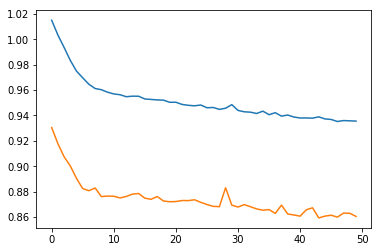

In [20]:
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

### CNN

In [25]:
model_cnn = build_cnn_model(X_train.shape[1:], Y_train.shape[1], 32, L=3, 
                        kernel_s =5, pool=3, BN=False, drop=0.25,padding='valid',dil_r=1 )
model_cnn.compile(loss='mse', optimizer='adam')
model_cnn.summary()

hist = train_model(model_cnn, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 796, 64)           0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 792, 32)           10272     
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 788, 32)           5152      
_________________________________________________________________
dropout_1 (Dropout)          (None, 788, 32)           0         
_________________________________________________________________
average_pooling1d_1 (Average (None, 262, 32)           0         
_________________________________________________________________
conv1d_3 (Conv1D)            (None, 258, 64)           10304     
_________________________________________________________________
conv1d_4 (Conv1D)            (None, 254, 64)           20544     
__________

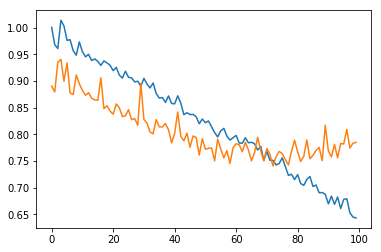

In [40]:
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

In [47]:
model_cnn2 = build_cnn_model(X_train.shape[1:], Y_train.shape[1], 32, L=3, 
                        kernel_s =5, pool=3, BN=True, drop=0.5,padding='valid',dil_r=1 )
model_cnn2.compile(loss='mse', optimizer='adam') 
model_cnn2.summary() #con BN

hist = train_model(model_cnn2, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_7 (InputLayer)         (None, 2015, 128)         0         
_________________________________________________________________
conv1d_25 (Conv1D)           (None, 2011, 32)          20512     
_________________________________________________________________
batch_normalization_1 (Batch (None, 2011, 32)          128       
_________________________________________________________________
conv1d_26 (Conv1D)           (None, 2007, 32)          5152      
_________________________________________________________________
batch_normalization_2 (Batch (None, 2007, 32)          128       
_________________________________________________________________
dropout_10 (Dropout)         (None, 2007, 32)          0         
_________________________________________________________________
average_pooling1d_10 (Averag (None, 669, 32)           0         
__________

Epoch 49/100
2841/2841 [==============================] - 25s 9ms/step - loss: 0.3634 - val_loss: 1.2197
Epoch 50/100
2841/2841 [==============================] - 25s 9ms/step - loss: 0.3544 - val_loss: 1.3718
Epoch 51/100
2841/2841 [==============================] - 25s 9ms/step - loss: 0.3500 - val_loss: 1.1483
Epoch 52/100
2841/2841 [==============================] - 25s 9ms/step - loss: 0.3508 - val_loss: 0.9122
Epoch 53/100
2841/2841 [==============================] - 25s 9ms/step - loss: 0.3393 - val_loss: 1.0767
Epoch 54/100
2841/2841 [==============================] - 26s 9ms/step - loss: 0.3273 - val_loss: 1.3411
Epoch 55/100
2841/2841 [==============================] - 28s 10ms/step - loss: 0.3245 - val_loss: 1.0751
Epoch 56/100
2841/2841 [==============================] - 26s 9ms/step - loss: 0.3220 - val_loss: 1.4072
Epoch 57/100
2841/2841 [==============================] - 28s 10ms/step - loss: 0.3281 - val_loss: 2.4290
Epoch 58/100
2841/2841 [=============================

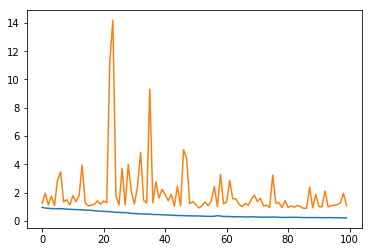

In [53]:
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

In [33]:
model_cnn3 = build_cnn_model(X_train.shape[1:], Y_train.shape[1], 32, L=3, 
                        kernel_s =8, pool=5, BN=False, drop=0.25,padding='valid',dil_r=1 )
model_cnn3.compile(loss='mse', optimizer='adam')
model_cnn3.summary() #pool y kernel size mas grandes..

hist = train_model(model_cnn3, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         (None, 2015, 128)         0         
_________________________________________________________________
conv1d_19 (Conv1D)           (None, 2008, 32)          32800     
_________________________________________________________________
conv1d_20 (Conv1D)           (None, 2001, 32)          8224      
_________________________________________________________________
dropout_10 (Dropout)         (None, 2001, 32)          0         
_________________________________________________________________
average_pooling1d_7 (Average (None, 400, 32)           0         
_________________________________________________________________
conv1d_21 (Conv1D)           (None, 393, 64)           16448     
_________________________________________________________________
conv1d_22 (Conv1D)           (None, 386, 64)           32832     
__________

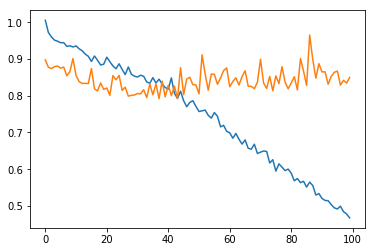

In [34]:
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

In [51]:
model_cnn4 = build_cnn_model(X_train.shape[1:], Y_train.shape[1], 32, L=4, 
                        kernel_s =5, pool=3, BN=False, drop=0.25,padding='valid',dil_r=1 )
model_cnn4.compile(loss='mse', optimizer='adam')
model_cnn4.summary()

hist = train_model(model_cnn4, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_9 (InputLayer)         (None, 2015, 128)         0         
_________________________________________________________________
conv1d_37 (Conv1D)           (None, 2011, 32)          20512     
_________________________________________________________________
conv1d_38 (Conv1D)           (None, 2007, 32)          5152      
_________________________________________________________________
dropout_16 (Dropout)         (None, 2007, 32)          0         
_________________________________________________________________
average_pooling1d_16 (Averag (None, 669, 32)           0         
_________________________________________________________________
conv1d_39 (Conv1D)           (None, 665, 64)           10304     
_________________________________________________________________
conv1d_40 (Conv1D)           (None, 661, 64)           20544     
__________

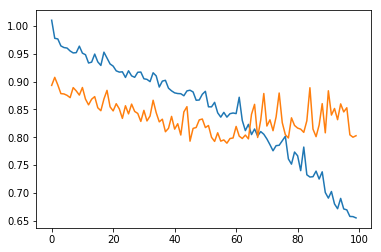

In [55]:
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

### CNN K-max pool

In [73]:
model_kpool = build_kpool_model(X_train.shape[1:], Y_train.shape[1], 32, L=3,
                        kernel_s =5, K_top=80, BN = False, drop=0.2, padding='valid') #menos k??
model_kpool.compile(loss='mse', optimizer='adam')
model_kpool.summary()

hist = train_model(model_kpool, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_23 (InputLayer)        (None, 2015, 128)         0         
_________________________________________________________________
conv1d_145 (Conv1D)          (None, 2011, 32)          20512     
_________________________________________________________________
conv1d_146 (Conv1D)          (None, 2007, 32)          5152      
_________________________________________________________________
dropout_56 (Dropout)         (None, 2007, 32)          0         
_________________________________________________________________
k_max_pooling_10 (KMaxPoolin (None, 1344, 32)          0         
_________________________________________________________________
conv1d_147 (Conv1D)          (None, 1340, 64)          10304     
_________________________________________________________________
conv1d_148 (Conv1D)          (None, 1336, 64)          20544     
__________

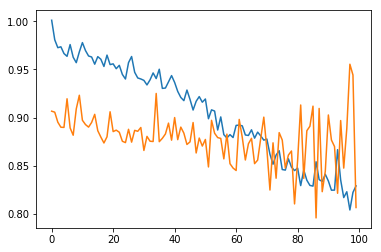

In [74]:
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

In [ ]:
## otro for para mantener filtros..

L, unit, K , kernel =  3 16 80 5


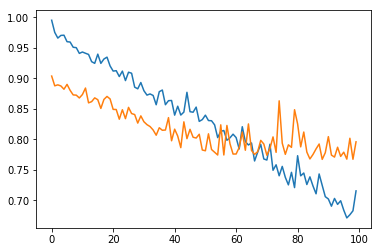

**********************Test**********************
              MAE        MApE           MSE       MeAE     RMSLE
Real    49.676253   91.040112  21837.834376  35.346452  0.622964
Scaled   0.582554  243.041572      0.927932   0.400813  0.349378
L, unit, K , kernel =  3 16 80 8


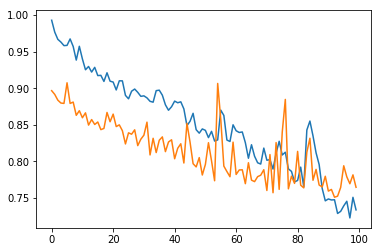

**********************Test**********************
              MAE        MApE           MSE       MeAE     RMSLE
Real    44.169911   88.221454  18325.767887  31.201482  0.571860
Scaled   0.566070  171.796773      0.826312   0.406112  0.343001
L, unit, K , kernel =  3 16 100 5


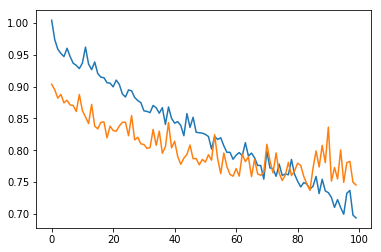

**********************Test**********************
              MAE        MApE           MSE       MeAE     RMSLE
Real    43.831980   87.476458  18771.007998  29.372993  0.592773
Scaled   0.556396  216.136005      0.840517   0.381824  0.336568
L, unit, K , kernel =  3 16 100 8


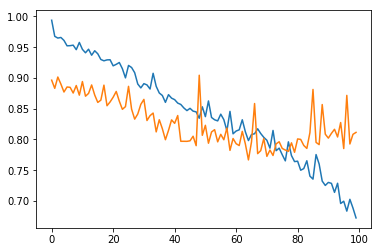

**********************Test**********************
              MAE        MApE           MSE       MeAE     RMSLE
Real    44.481941   88.660744  20038.544427  28.456581  0.601844
Scaled   0.582495  202.274192      0.908105   0.397871  0.347671
L, unit, K , kernel =  3 32 80 5


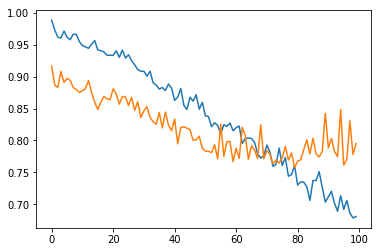

**********************Test**********************
              MAE        MApE           MSE       MeAE     RMSLE
Real    45.325139   85.329668  19905.238364  30.102620  0.578763
Scaled   0.572377  203.689801      0.971664   0.387783  0.339292
L, unit, K , kernel =  3 32 80 8


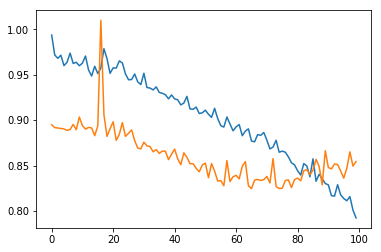

**********************Test**********************
              MAE        MApE           MSE       MeAE     RMSLE
Real    47.870833   92.606001  21626.038556  34.212521  0.675220
Scaled   0.620546  197.791819      0.927983   0.458325  0.356475
L, unit, K , kernel =  3 32 100 5


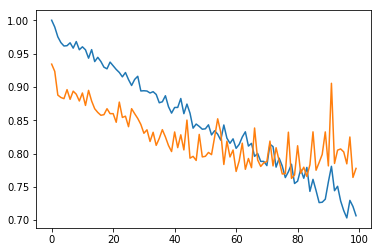

**********************Test**********************
              MAE        MApE           MSE       MeAE     RMSLE
Real    44.475438   86.121912  19331.486798  30.460981  0.589657
Scaled   0.567311  209.244522      0.890294   0.385064  0.346819
L, unit, K , kernel =  3 32 100 8


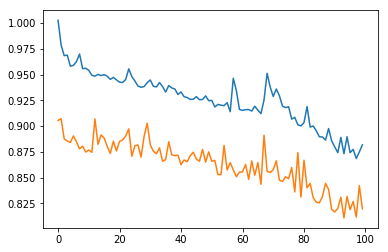

**********************Test**********************
              MAE        MApE           MSE       MeAE     RMSLE
Real    46.532018   95.579195  19845.607736  33.706635  0.604585
Scaled   0.599233  178.615093      0.900770   0.439383  0.350589


In [52]:
#for probando
capas = [3]
units = [16,32]
Ks = [80,100]
kernel_s = [5]

#for L in capas:
for unit in units:
    for K in Ks:
        #for kernel in kernel_s:
        print("L, unit, K , kernel = ",L, unit,K, kernel)
        model_kpool = build_kpool_model(X_train.shape[1:], Y_train.shape[1], unit, L=L,
                                kernel_s =kernel, K_top=K, BN = False, drop=0, padding='valid')
        model_kpool.compile(loss='mse', optimizer='adam')

        hist = train_model(model_kpool, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2,verb=0)
        plt.plot(hist.history["loss"])
        plt.plot(hist.history["val_loss"])
        plt.show()

        Y_test_hat = model_kpool.predict(X_test)
        print("**********************Test**********************")
        evaluate_metadata_raw(Y_test, scaler_meta.inverse_transform(Y_test_hat),
             metadata_used=metadata_used)

### CNN casual+dilation 
> WaveNet

In [71]:
model_cnn_caus = build_cnn_model(X_train.shape[1:], Y_train.shape[1], 64, L=6, 
                        kernel_s =5, BN=False, drop=0.2, padding='causal',dil_r=2 )
model_cnn_caus.compile(loss='mse', optimizer='adam')
model_cnn_caus.summary()

hist = train_model(model_cnn_caus, X_train, Ystd_train, epochs=50, batch_size=64, val_split=0.2)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_22 (InputLayer)        (None, 2015, 128)         0         
_________________________________________________________________
conv1d_139 (Conv1D)          (None, 2015, 64)          41024     
_________________________________________________________________
dropout_49 (Dropout)         (None, 2015, 64)          0         
_________________________________________________________________
conv1d_140 (Conv1D)          (None, 2015, 64)          20544     
_________________________________________________________________
dropout_50 (Dropout)         (None, 2015, 64)          0         
_________________________________________________________________
conv1d_141 (Conv1D)          (None, 2015, 64)          20544     
_________________________________________________________________
dropout_51 (Dropout)         (None, 2015, 64)          0         
__________

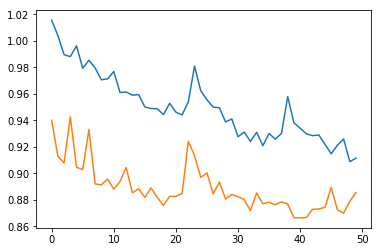

In [72]:
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

### train model (2da fase)

... opciones
#1 probar sin pre-process -- malo pero no tanto...
#2 probar con pre-process standar -- el mejor
#3 probar con pre-process robust --- bien

#4 probar añadiendo error -- mejora pero la nada misma...

#5 probar variar arquitecturas.. (kmaxpool anda bien, cnn tambien)

#6 probar añadir otras curvas (sin confirmados..)

#7 probar utilizar otro encoder.. --- pareciera mejorar en algunos casos (menos overfit) pero no genera una mejora considerable

NUEVO:  
#1- probar cambiar losses (absolute error/evita valores extremos??) -- MAE sirve si quiero minimzar AE enves de SE
#2- poner una red para valores extremos y otra para valores bajos..

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 2015, 128)         0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 2011, 32)          20512     
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 2007, 32)          5152      
_________________________________________________________________
k_max_pooling_1 (KMaxPooling (None, 1344, 32)          0         
_________________________________________________________________
conv1d_3 (Conv1D)            (None, 1340, 64)          10304     
_________________________________________________________________
conv1d_4 (Conv1D)            (None, 1336, 64)          20544     
_________________________________________________________________
k_max_pooling_2 (KMaxPooling (None, 672, 64)           0         
__________

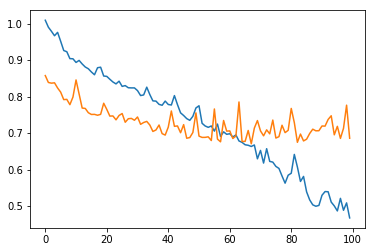

**********************Test**********************


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,Stellar Radius,Stellar Mass,Global
MAE,23.683463,0.071838,25.234446,2.261895,174.946822,279.043564,0.009112,20.274015,0.068207,0.044808,1.713239,420.817877,0.267708,0.136725,67.755266
MApE,301.711542,47.304332,14.493085,2.814818,321.517727,40.005464,38.257088,130.750124,15.443406,27.199456,497.325508,8.228543,28.257939,16.482966,106.413714
MSE,2095.995863,0.011631,2409.726549,30.067995,96885.971189,168099.854120,0.000682,1134.996846,0.007609,0.003800,9.451624,325453.451422,0.236467,0.033798,42579.986400
MeAE,10.481311,0.043320,15.808712,1.246104,85.284912,207.771179,0.005453,11.662600,0.055181,0.030500,1.113636,327.177246,0.173736,0.108935,47.211630
RMSLE,1.354902,0.085531,0.218803,0.180215,1.494577,0.454927,0.021483,0.944029,0.059406,0.050843,0.632652,0.116087,0.182368,0.097080,0.420922


{'MAE': [23.683462785601847,
  0.0718377525025083,
  25.234446153183786,
  2.2618954561441247,
  174.94682193783547,
  279.0435636916963,
  0.009112027060823275,
  20.2740146250268,
  0.06820674607824571,
  0.04480816107339197,
  1.7132389048052796,
  420.8178773785582,
  0.2677083563866001,
  0.1367252431633449,
  67.75526565850835],
 'MApE': [301.71154153086195,
  47.304331926649056,
  14.493084768262953,
  2.814818091105621,
  321.5177268434716,
  40.00546412933168,
  38.25708787203604,
  130.7501238466256,
  15.443406159196774,
  27.199456033986053,
  497.3255083046395,
  8.228542705148502,
  28.257939326967207,
  16.482966437099485,
  106.41371414109874],
 'MSE': [2095.995863080751,
  0.011631132117505025,
  2409.7265487774634,
  30.067995224017302,
  96885.97118921824,
  168099.85411960358,
  0.0006824256248353405,
  1134.9968464781382,
  0.007609173604386185,
  0.0038000307866310943,
  9.451623614175892,
  325453.4514220324,
  0.2364665013616314,
  0.03379790067011634,
  42579.9

In [21]:
## mas metadatos, duration/24 y Tsimple
model_kpool = build_kpool_model(X_train.shape[1:], Y_train.shape[1], 32, L=3,
                        kernel_s =5, K_top=80, BN = False, drop=0., padding='valid') #version 1
model_kpool.compile(loss='mse', optimizer='adam')
model_kpool.summary()

hist = train_model(model_kpool, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2)
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

Y_test_hat = model_kpool.predict(X_test)
print("**********************Test**********************")
evaluate_metadata_raw(Y_test, scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used) #t simple

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 2015, 128)         0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 2011, 32)          20512     
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 2007, 32)          5152      
_________________________________________________________________
k_max_pooling_1 (KMaxPooling (None, 1344, 32)          0         
_________________________________________________________________
conv1d_3 (Conv1D)            (None, 1340, 64)          10304     
_________________________________________________________________
conv1d_4 (Conv1D)            (None, 1336, 64)          20544     
_________________________________________________________________
k_max_pooling_2 (KMaxPooling (None, 672, 64)           0         
__________

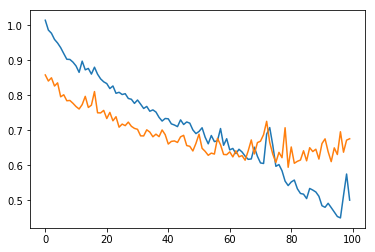

**********************Test**********************


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,Stellar Radius,Stellar Mass,Global
MAE,21.718515,0.067742,24.124114,2.277776,157.382067,270.981520,0.008631,18.217098,0.070881,0.045013,1.615120,418.674288,0.314893,0.144999,65.403047
MApE,208.000124,44.896564,13.645402,2.674973,268.211774,41.603291,33.826481,100.455613,15.650297,27.627711,361.149780,8.310368,31.960450,17.736978,83.982129
MSE,2043.551362,0.010314,1747.028925,10.554302,73484.695500,133310.909261,0.000402,1062.544744,0.008509,0.003880,14.204329,321039.653150,0.312881,0.040750,38050.965593
MeAE,8.617007,0.042385,15.645477,1.568191,94.885223,205.351746,0.005501,9.724831,0.055860,0.032042,0.900312,302.269531,0.211740,0.106499,45.672596
RMSLE,1.260462,0.080108,0.203374,0.038835,1.357480,0.443664,0.017788,0.885167,0.062954,0.051300,0.618288,0.112470,0.198098,0.102946,0.388067


{'MAE': [21.718514802572138,
  0.0677417942265992,
  24.124114019662944,
  2.2777761698807817,
  157.3820672213441,
  270.9815195820119,
  0.008631496340198682,
  18.217098105410304,
  0.07088122770384986,
  0.045013280217246245,
  1.6151200479184613,
  418.6742883663366,
  0.3148926133363554,
  0.1449988163825309,
  65.40304696738171],
 'MApE': [208.0001239779476,
  44.89656367281736,
  13.645402153980315,
  2.6749732033822267,
  268.2117741055854,
  41.603291425220256,
  33.82648137415394,
  100.45561347670753,
  15.650296976971816,
  27.627710942326004,
  361.1497804305495,
  8.310367859297676,
  31.960449586565108,
  17.736977948404448,
  83.98212908099353],
 'MSE': [2043.55136202779,
  0.010313507098451354,
  1747.0289253735195,
  10.554302019533004,
  73484.69549994104,
  133310.90926101597,
  0.0004020112723057985,
  1062.5447444871,
  0.008508751269397524,
  0.0038797839017664718,
  14.204328516536654,
  321039.6531500448,
  0.31288148142015126,
  0.04074988306841178,
  38050.9

In [20]:
## mas metadatos , duration/24 y Tsimple
model_kpool = build_kpool_model(X_train.shape[1:], Y_train.shape[1], 32, L=3,
                        kernel_s =5, K_top=80, BN = False, drop=0., padding='valid') #version 1
model_kpool.compile(loss='mse', optimizer='adam')
model_kpool.summary()

hist = train_model(model_kpool, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2)
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

Y_test_hat = model_kpool.predict(X_test)
print("**********************Test**********************")
evaluate_metadata_raw(Y_test, scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used) #t normal

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 2015, 128)         0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 2011, 32)          20512     
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 2007, 32)          5152      
_________________________________________________________________
k_max_pooling_1 (KMaxPooling (None, 1344, 32)          0         
_________________________________________________________________
conv1d_3 (Conv1D)            (None, 1340, 64)          10304     
_________________________________________________________________
conv1d_4 (Conv1D)            (None, 1336, 64)          20544     
_________________________________________________________________
k_max_pooling_2 (KMaxPooling (None, 672, 64)           0         
__________

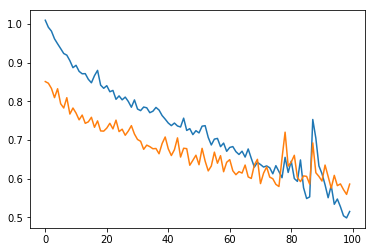

**********************Test**********************


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,Stellar Radius,Stellar Mass,Global
MAE,26.331991,0.069798,25.723768,1.980895,155.912474,255.469220,0.008877,21.963953,0.070497,0.046941,1.855624,420.469749,0.258897,0.137472,65.021440
MApE,405.444415,52.186263,15.071521,2.380442,268.127984,35.683155,39.668030,146.990550,16.263897,27.730529,552.562915,8.217276,25.621556,16.407302,115.168274
MSE,2184.606322,0.010087,1764.417283,10.604080,84304.158454,125129.182761,0.000465,1152.801816,0.008187,0.004236,16.371419,332331.889969,0.188012,0.035113,39063.877015
MeAE,15.306032,0.047035,18.247307,1.270894,80.077629,187.573975,0.005635,13.978280,0.056350,0.032416,1.068814,312.798340,0.163484,0.106040,45.052302
RMSLE,1.372860,0.079814,0.207627,0.040094,1.418843,0.537056,0.019097,0.941091,0.061733,0.053452,0.668444,0.127055,0.171668,0.097036,0.413991


{'MAE': [26.331990897715293,
  0.06979786985634104,
  25.723767864855354,
  1.9808951990108679,
  155.9124736445965,
  255.46922037861134,
  0.008877205443297431,
  21.9639532828246,
  0.07049720912310156,
  0.04694092278763799,
  1.8556240950021765,
  420.4697492844988,
  0.2588970468266175,
  0.1374721993531331,
  65.02143979289322],
 'MApE': [405.4444145850952,
  52.1862632810214,
  15.071521181068404,
  2.3804423034818987,
  268.1279838305526,
  35.68315499006025,
  39.668030149507956,
  146.9905502031242,
  16.263897428289038,
  27.730528907118973,
  552.5629145381307,
  8.217276241891899,
  25.62155565311971,
  16.407301554736158,
  115.168273917657],
 'MSE': [2184.6063220254973,
  0.010087121447403109,
  1764.4172832183208,
  10.60408027519478,
  84304.15845433247,
  125129.18276112979,
  0.00046479434888591385,
  1152.8018164067028,
  0.00818722349562059,
  0.0042355329904047905,
  16.371418614216473,
  332331.88996860426,
  0.1880120614979127,
  0.035113201491501926,
  39063.8

In [22]:
## mas metadatos , duration/24 y Tsimple
model_kpool = build_kpool_model(X_train.shape[1:], Y_train.shape[1], 32, L=3,
                        kernel_s =5, K_top=80, BN = False, drop=0., padding='valid') #version 1
model_kpool.compile(loss='mse', optimizer='adam')
model_kpool.summary()

hist = train_model(model_kpool, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2)
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

Y_test_hat = model_kpool.predict(X_test)
print("**********************Test**********************")
evaluate_metadata_raw(Y_test, scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used) #t normal-- decoder sin time

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 2015, 128)         0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 2011, 32)          20512     
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 2007, 32)          5152      
_________________________________________________________________
k_max_pooling_1 (KMaxPooling (None, 1344, 32)          0         
_________________________________________________________________
conv1d_3 (Conv1D)            (None, 1340, 64)          10304     
_________________________________________________________________
conv1d_4 (Conv1D)            (None, 1336, 64)          20544     
_________________________________________________________________
k_max_pooling_2 (KMaxPooling (None, 672, 64)           0         
__________

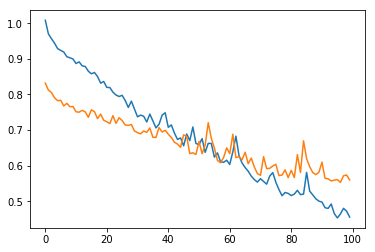

**********************Test**********************


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,Stellar Radius,Stellar Mass,Global
MAE,31.938693,0.083788,27.224767,4.330889,210.209632,305.813968,0.067028,23.107058,0.073049,0.045383,2.229919,449.155396,0.536673,0.142533,75.354198
MApE,525.622535,64.136760,15.954302,4.963392,474.268225,48.659419,320.946521,147.897800,16.028854,28.259105,611.701307,8.884440,57.069331,17.224500,167.258321
MSE,3000.283030,0.013477,2116.090809,37.263231,107195.617904,165658.740684,0.012485,1410.669987,0.008898,0.003838,17.995950,359741.985827,0.679381,0.035772,45655.671519
MeAE,18.107050,0.061909,17.050658,3.084349,124.617058,236.432526,0.041331,13.906344,0.054858,0.032064,1.382693,348.819336,0.378655,0.110975,54.577129
RMSLE,1.480980,0.092648,0.224499,0.074449,1.528718,0.480334,0.084434,1.118745,0.064100,0.051236,0.787754,0.117650,0.316547,0.098815,0.465779


{'MAE': [31.938693132222003,
  0.08378797145380124,
  27.224766867723154,
  4.330889419404586,
  210.20963183511603,
  305.81396846960087,
  0.06702772267830757,
  23.107057827637927,
  0.07304854373412557,
  0.04538311643718493,
  2.2299188396618153,
  449.1553957495359,
  0.536672738206003,
  0.14253302577934643,
  75.35419823279936],
 'MApE': [525.6225346507107,
  64.13676008395774,
  15.954302334201046,
  4.963392039386084,
  474.26822455883826,
  48.659418680792754,
  320.9465211450162,
  147.89780030675686,
  16.02885420394414,
  28.259104721840135,
  611.7013066806087,
  8.884440021416449,
  57.069331437060356,
  17.22450023355692,
  167.2583207927205],
 'MSE': [3000.283029517555,
  0.013476878832420757,
  2116.0908086998907,
  37.26323119397943,
  107195.6179038849,
  165658.74068364175,
  0.012485448357649273,
  1410.6699873755683,
  0.008897514523896628,
  0.0038377909933311693,
  17.995950468964864,
  359741.9858269098,
  0.6793808773683219,
  0.03577241745565558,
  45655.67

In [25]:
## mas metadatos , duration/24 -- agregados falsos positivos
model_kpool = build_kpool_model(X_train.shape[1:], Y_train.shape[1], 32, L=3,
                        kernel_s =5, K_top=80, BN = False, drop=0., padding='valid') #version 1
model_kpool.compile(loss='mse', optimizer='adam')
model_kpool.summary()

hist = train_model(model_kpool, X_train, Ystd_train, epochs=100, batch_size=256, val_split=0.2)
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

Y_test_hat = model_kpool.predict(X_test)
print("**********************Test**********************")
evaluate_metadata_raw(Y_test, scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used) #t normal

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         (None, 2015, 128)         0         
_________________________________________________________________
conv1d_13 (Conv1D)           (None, 2011, 32)          20512     
_________________________________________________________________
conv1d_14 (Conv1D)           (None, 2007, 32)          5152      
_________________________________________________________________
k_max_pooling_7 (KMaxPooling (None, 1344, 32)          0         
_________________________________________________________________
conv1d_15 (Conv1D)           (None, 1340, 64)          10304     
_________________________________________________________________
conv1d_16 (Conv1D)           (None, 1336, 64)          20544     
_________________________________________________________________
k_max_pooling_8 (KMaxPooling (None, 672, 64)           0         
__________

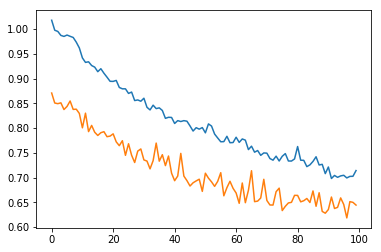

**********************Test**********************


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,Stellar Radius,Stellar Mass,Global
MAE,22.305120,0.066900,22.120783,2.064156,147.254297,240.906706,0.008768,18.614354,0.070161,0.045693,1.738414,424.532673,0.290746,0.144828,62.868828
MApE,318.096199,49.857523,12.179802,2.482768,284.578414,37.071083,33.849137,113.561866,15.831443,27.770834,427.928290,8.335880,31.689772,18.152176,98.670371
MSE,1757.743539,0.009648,1644.523992,11.734814,73443.802367,105279.812797,0.000510,925.329877,0.008512,0.004028,14.355390,333131.401142,0.165487,0.036825,36872.066352
MeAE,14.589649,0.042993,14.022120,1.480391,81.785248,186.646851,0.004958,12.843567,0.055474,0.031768,1.024490,306.818359,0.225128,0.111579,44.263041
RMSLE,1.218208,0.077954,0.191309,0.042889,1.271691,0.412913,0.019890,0.841712,0.062823,0.052322,0.635683,0.114533,0.176852,0.101544,0.372880


{'MAE': [22.3051204204583,
  0.06689976349802693,
  22.12078289126702,
  2.0641559647663983,
  147.25429667482283,
  240.9067058903156,
  0.008768203782260712,
  18.61435363248032,
  0.0701612556471683,
  0.04569331390857696,
  1.7384140195177706,
  424.53267326732674,
  0.29074610957816094,
  0.14482754362266842,
  62.868828496499425],
 'MApE': [318.09619948386427,
  49.85752261905802,
  12.179802390039416,
  2.482767517872252,
  284.57841381697585,
  37.07108254776067,
  33.84913739380206,
  113.56186581683325,
  15.831443357088823,
  27.770834188921857,
  427.92828995714433,
  8.335880383275347,
  31.689771863075862,
  18.152175694750632,
  98.67037050217591],
 'MSE': [1757.7435390568228,
  0.009647719724346795,
  1644.5239915645732,
  11.734814136966952,
  73443.80236654794,
  105279.81279657422,
  0.0005098120700035155,
  925.3298774185862,
  0.00851216892617571,
  0.004027948168888841,
  14.355389977963625,
  333131.4011419148,
  0.16548650937119733,
  0.03682482347030303,
  3687

In [37]:
## mas metadatos , duration/24
model_kpool = build_kpool_model(X_train.shape[1:], Y_train.shape[1], 32, L=3,
                        kernel_s =5, K_top=80, BN = False, drop=0., padding='valid') #version 1
model_kpool.compile(loss='mse', optimizer='adam')
model_kpool.summary()

hist = train_model(model_kpool, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2)
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

Y_test_hat = model_kpool.predict(X_test)
print("**********************Test**********************")
evaluate_metadata_raw(Y_test, scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used) #op 4 Encoder

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         (None, 2015, 256)         0         
_________________________________________________________________
conv1d_19 (Conv1D)           (None, 2011, 32)          40992     
_________________________________________________________________
conv1d_20 (Conv1D)           (None, 2007, 32)          5152      
_________________________________________________________________
k_max_pooling_10 (KMaxPoolin (None, 1344, 32)          0         
_________________________________________________________________
conv1d_21 (Conv1D)           (None, 1340, 64)          10304     
_________________________________________________________________
conv1d_22 (Conv1D)           (None, 1336, 64)          20544     
_________________________________________________________________
k_max_pooling_11 (KMaxPoolin (None, 672, 64)           0         
__________

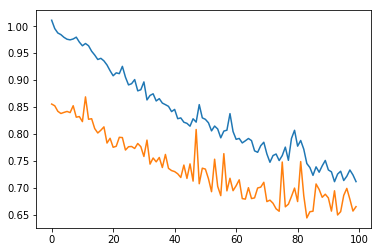

**********************Test**********************


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,Stellar Radius,Stellar Mass,Global
MAE,20.769502,0.064493,22.226485,2.315282,186.902905,270.842122,0.009275,17.724995,0.069039,0.045582,1.789984,408.245612,0.258637,0.134820,66.528481
MApE,220.936101,41.174140,12.222689,2.756138,422.968053,43.911840,34.048100,87.370598,15.741629,27.335862,378.197750,8.018084,27.548066,16.754979,95.641716
MSE,1942.941491,0.010728,1726.993037,12.634826,87291.967700,130497.316191,0.000577,1040.103570,0.007689,0.003710,14.958647,303362.899492,0.151506,0.033718,37563.573063
MeAE,9.879857,0.037741,14.946083,1.868648,121.275131,201.807983,0.005195,9.413177,0.055302,0.034719,1.039965,317.008789,0.197197,0.099508,48.404950
RMSLE,1.282861,0.081738,0.198883,0.044388,1.369023,0.452335,0.021135,0.914103,0.059639,0.050291,0.658150,0.109770,0.162225,0.096449,0.392928


{'MAE': [20.769501581910617,
  0.0644927141399116,
  22.226485075081218,
  2.315281784208694,
  186.90290485042158,
  270.8421224764078,
  0.009274724462274278,
  17.724994914765876,
  0.06903881838817409,
  0.04558172878959391,
  1.789984320655887,
  408.24561223700493,
  0.25863727606405124,
  0.13481999111647655,
  66.52848089238694],
 'MApE': [220.93610098716005,
  41.174139801675885,
  12.222689159510447,
  2.7561375374734727,
  422.96805280730626,
  43.91183997712794,
  34.048100075310245,
  87.37059833955068,
  15.741629334883983,
  27.335861942016,
  378.19774987780346,
  8.018083863384282,
  27.54806563890333,
  16.75497860302597,
  95.64171628179517],
 'MSE': [1942.9414909883287,
  0.010728095948085681,
  1726.9930371809282,
  12.634825692330589,
  87291.96769955961,
  130497.3161911925,
  0.0005768943552730555,
  1040.1035700513944,
  0.007689010373984306,
  0.0037097846803269504,
  14.958647465826463,
  303362.89949166233,
  0.15150607665094182,
  0.03371825328462528,
  375

In [42]:
## mas metadatos , duration/24
model_kpool = build_kpool_model(X_train.shape[1:], Y_train.shape[1], 32, L=3,
                        kernel_s =5, K_top=80, BN = False, drop=0., padding='valid') #version 1
model_kpool.compile(loss='mse', optimizer='adam')
model_kpool.summary()

hist = train_model(model_kpool, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2)
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

Y_test_hat = model_kpool.predict(X_test)
print("**********************Test**********************")
evaluate_metadata_raw(Y_test, scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used) #op 4 Simple

In [ ]:
## mas metadatos , duration/24
model_kpool = build_kpool_model(X_train.shape[1:], Y_train.shape[1], 32, L=3,
                        kernel_s =5, K_top=80, BN = False, drop=0., padding='valid') #version 1
model_kpool.compile(loss='mse', optimizer='adam')
model_kpool.summary()

hist = train_model(model_kpool, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2)
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

Y_test_hat = model_kpool.predict(X_test)
print("**********************Test**********************")
evaluate_metadata_raw(Y_test, scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used) #op 4 Simple+ Tsimple

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         (None, 2015, 128)         0         
_________________________________________________________________
conv1d_13 (Conv1D)           (None, 2011, 32)          20512     
_________________________________________________________________
conv1d_14 (Conv1D)           (None, 2007, 32)          5152      
_________________________________________________________________
dropout_9 (Dropout)          (None, 2007, 32)          0         
_________________________________________________________________
average_pooling1d_7 (Average (None, 669, 32)           0         
_________________________________________________________________
conv1d_15 (Conv1D)           (None, 665, 64)           10304     
_________________________________________________________________
conv1d_16 (Conv1D)           (None, 661, 64)           20544     
__________

2841/2841 [==============================] - 15s 5ms/step - loss: 0.8062 - val_loss: 0.7635
Epoch 55/100
2841/2841 [==============================] - 15s 5ms/step - loss: 0.7875 - val_loss: 0.7729
Epoch 56/100
2841/2841 [==============================] - 15s 5ms/step - loss: 0.7825 - val_loss: 0.7936
Epoch 57/100
2841/2841 [==============================] - 15s 5ms/step - loss: 0.7646 - val_loss: 0.7886
Epoch 58/100
2841/2841 [==============================] - 15s 5ms/step - loss: 0.7642 - val_loss: 0.7690
Epoch 59/100
2841/2841 [==============================] - 15s 5ms/step - loss: 0.7534 - val_loss: 0.8140
Epoch 60/100
2841/2841 [==============================] - 15s 5ms/step - loss: 0.7716 - val_loss: 0.7707
Epoch 61/100
2841/2841 [==============================] - 16s 5ms/step - loss: 0.7542 - val_loss: 0.8078
Epoch 62/100
2841/2841 [==============================] - 15s 5ms/step - loss: 0.7575 - val_loss: 0.7925
Epoch 63/100
2841/2841 [==============================] - 15s 5ms/st

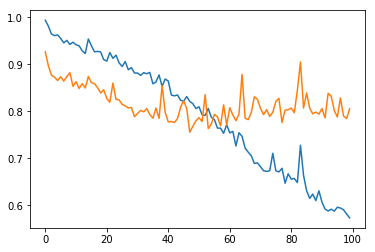

**********************Test**********************


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2,Global
MAE,21.070577,1.638998,23.311137,2.055609,0.077559,0.009228,256.838161,168.165564,0.075672,0.049400,47.329190
MApE,243.055520,40.901853,13.067943,2.476073,83.779080,42.512291,38.794038,344.960207,18.191565,27.649706,85.538828
MSE,2003.114992,6.898591,1737.039381,11.527436,0.018906,0.000482,119403.028709,79740.023604,0.008355,0.003828,20290.166428
MeAE,7.516153,0.914965,15.011577,1.382113,0.039827,0.006425,191.434509,100.158020,0.069524,0.043318,31.657643
RMSLE,1.164805,0.416212,0.199658,0.042466,0.106503,0.019411,0.427697,1.294304,0.062725,0.050809,0.378459


{'MAE': [21.070577308504337,
  1.638997517443213,
  23.311136658821933,
  2.055608823870668,
  0.07755918537713219,
  0.009227709283657593,
  256.83816075088953,
  168.16556362869716,
  0.07567230697150278,
  0.04939987708129505,
  47.329190376694044],
 'MApE': [243.05552040752065,
  40.901853184259735,
  13.067942547652686,
  2.4760730261506994,
  83.77908048123689,
  42.51229132118427,
  38.794037772412274,
  344.9602071722344,
  18.191564874256063,
  27.649706083077184,
  85.53882768699847],
 'MSE': [2003.1149918695908,
  6.8985913880264,
  1737.0393805426763,
  11.527436437569392,
  0.018906337583509823,
  0.00048166721535145414,
  119403.02870902183,
  79740.02360429226,
  0.00835486854236408,
  0.0038282873480070386,
  20290.166428471268],
 'MeAE': [7.516152948339844,
  0.9149646949768067,
  15.01157687011721,
  1.3821127319335886,
  0.03982695966958999,
  0.006425477445125578,
  191.43450927734375,
  100.15802001953125,
  0.06952363228797914,
  0.043318410873413093,
  31.6576431

In [26]:
model_cnn = build_cnn_model(X_train.shape[1:], Y_train.shape[1], 32, L=3, 
                        kernel_s =5, pool=3, BN=False, drop=0.2,padding='valid',dil_r=1 )
model_cnn.compile(loss='mse', optimizer='adam')
model_cnn.summary()

hist = train_model(model_cnn, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2)
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

Y_test_hat = model_cnn.predict(X_test)
##evaluate with mse between metadata (and the values before)..
print("**********************Test**********************")
evaluate_metadata_raw(Y_test, scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         (None, 2015, 128)         0         
_________________________________________________________________
conv1d_19 (Conv1D)           (None, 2011, 32)          20512     
_________________________________________________________________
conv1d_20 (Conv1D)           (None, 2007, 32)          5152      
_________________________________________________________________
k_max_pooling_1 (KMaxPooling (None, 1344, 32)          0         
_________________________________________________________________
conv1d_21 (Conv1D)           (None, 1340, 64)          10304     
_________________________________________________________________
conv1d_22 (Conv1D)           (None, 1336, 64)          20544     
_________________________________________________________________
k_max_pooling_2 (KMaxPooling (None, 672, 64)           0         
__________

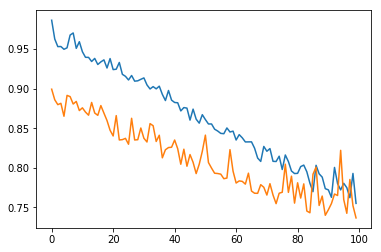

**********************Test**********************


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2,Global
MAE,19.980560,1.552461,23.789185,2.010539,0.075116,0.009759,249.548491,156.180607,0.074394,0.047913,45.326902
MApE,249.772180,41.297813,13.339335,2.422597,87.654631,44.216235,36.868365,309.791877,17.370466,28.204190,83.093769
MSE,1748.464852,5.987551,1778.492836,11.953485,0.016924,0.000588,120047.993356,77446.621974,0.008546,0.003851,20103.954396
MeAE,10.054932,0.918946,16.631180,1.446089,0.042732,0.006460,191.934082,88.823853,0.064416,0.038514,30.996120
RMSLE,1.122965,0.401895,0.198067,0.043608,0.099657,0.021181,0.415911,1.257112,0.063158,0.051173,0.367473


{'MAE': [19.980560123530065,
  1.5524612536862628,
  23.789184819798113,
  2.010538650663772,
  0.07511591042930278,
  0.009758506138047369,
  249.5484906187152,
  156.18060746502758,
  0.07439432253554316,
  0.04791281163149542,
  45.326902448215534],
 'MApE': [249.77218033051156,
  41.29781278561232,
  13.339334681947266,
  2.4225972780943015,
  87.65463054216086,
  44.21623531811225,
  36.86836502595062,
  309.79187668960446,
  17.370466015313706,
  28.204190039818677,
  83.0937688707126],
 'MSE': [1748.464851735621,
  5.987550896352244,
  1778.4928357105389,
  11.953485295397904,
  0.016924280645377248,
  0.0005882228872286184,
  120047.99335603317,
  77446.6219735464,
  0.008545688347867163,
  0.0038507776627324797,
  20103.954396218705],
 'MeAE': [10.054931698022461,
  0.9189458007812501,
  16.63118013183592,
  1.4460888671874983,
  0.04273154914379121,
  0.006459864690899847,
  191.93408203125,
  88.8238525390625,
  0.06441573333740236,
  0.03851419234275816,
  30.99612024076544

In [29]:
#version 1
model_kpool = build_kpool_model(X_train.shape[1:], Y_train.shape[1], 32, L=3,
                        kernel_s =5, K_top=80, BN = False, drop=0., padding='valid') #menos k??
model_kpool.compile(loss='mse', optimizer='adam')
model_kpool.summary()

hist = train_model(model_kpool, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2)
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

Y_test_hat = model_kpool.predict(X_test)
print("**********************Test**********************")
evaluate_metadata_raw(Y_test, scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         (None, 2015, 128)         0         
_________________________________________________________________
conv1d_25 (Conv1D)           (None, 2011, 16)          10256     
_________________________________________________________________
conv1d_26 (Conv1D)           (None, 2007, 16)          1296      
_________________________________________________________________
k_max_pooling_4 (KMaxPooling (None, 1344, 16)          0         
_________________________________________________________________
conv1d_27 (Conv1D)           (None, 1340, 32)          2592      
_________________________________________________________________
conv1d_28 (Conv1D)           (None, 1336, 32)          5152      
_________________________________________________________________
k_max_pooling_5 (KMaxPooling (None, 672, 32)           0         
__________

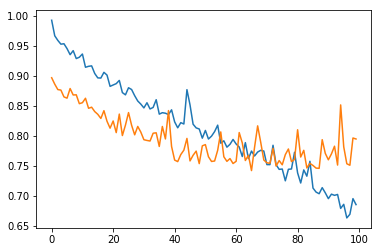

**********************Test**********************


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2,Global
MAE,26.656466,1.730587,25.164723,2.085489,0.090368,0.009608,258.165298,168.141293,0.073573,0.047623,48.216503
MApE,359.209091,47.693456,14.507317,2.514649,109.640070,43.670154,38.339515,342.403424,17.059601,28.336380,100.337366
MSE,2421.734738,7.255215,1826.075727,11.918164,0.022503,0.000480,123675.342751,90768.075350,0.008436,0.003883,21871.043725
MeAE,12.555651,0.969312,16.479471,1.409066,0.046686,0.006387,202.738098,86.963417,0.062567,0.036616,32.126727
RMSLE,1.313562,0.424900,0.209361,0.043071,0.115992,0.019430,0.445732,1.526287,0.062686,0.051420,0.421244


{'MAE': [26.65646613301059,
  1.7305869370508478,
  25.16472344051671,
  2.0854888021639075,
  0.09036848741840608,
  0.00960754139190263,
  258.1652976460976,
  168.14129264378312,
  0.073572562769616,
  0.047622589586040764,
  48.21650267837887],
 'MApE': [359.2090907225054,
  47.69345567022337,
  14.507317225732319,
  2.514648566307226,
  109.64007000648586,
  43.67015362394192,
  38.33951530889823,
  342.4034243636621,
  17.059600862619007,
  28.336379657869955,
  100.33736560082454],
 'MSE': [2421.734738364122,
  7.255215358148769,
  1826.075727348385,
  11.918163729026563,
  0.02250270549327637,
  0.00048006932802825155,
  123675.34275123903,
  90768.07535017513,
  0.008435986111195415,
  0.003883350782969836,
  21871.043724832558],
 'MeAE': [12.55565075328125,
  0.9693124160766606,
  16.47947077636718,
  1.4090655517578057,
  0.04668580579757692,
  0.006387171894311906,
  202.73809814453125,
  86.96341705322266,
  0.0625670990943909,
  0.03661644411087034,
  32.1267271216134],
 

In [32]:
#version 2
model_kpool = build_kpool_model(X_train.shape[1:], Y_train.shape[1], 16, L=3,
                        kernel_s =5, K_top=100, BN = False, drop=0., padding='valid') #menos k??
model_kpool.compile(loss='mse', optimizer='adam')
model_kpool.summary()

hist = train_model(model_kpool, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2)
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

Y_test_hat = model_kpool.predict(X_test)
print("**********************Test**********************")
evaluate_metadata_raw(Y_test, scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used)

### Which encoder??

* Op4

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 2015, 128)         0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 2011, 32)          20512     
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 2007, 32)          5152      
_________________________________________________________________
dropout_1 (Dropout)          (None, 2007, 32)          0         
_________________________________________________________________
average_pooling1d_1 (Average (None, 669, 32)           0         
_________________________________________________________________
conv1d_3 (Conv1D)            (None, 665, 64)           10304     
_________________________________________________________________
conv1d_4 (Conv1D)            (None, 661, 64)           20544     
__________

2841/2841 [==============================] - 15s 5ms/step - loss: 0.9259 - val_loss: 0.7883
Epoch 55/100
2841/2841 [==============================] - 15s 5ms/step - loss: 0.9246 - val_loss: 0.8090
Epoch 56/100
2841/2841 [==============================] - 15s 5ms/step - loss: 0.9295 - val_loss: 0.7947
Epoch 57/100
2841/2841 [==============================] - 15s 5ms/step - loss: 0.9309 - val_loss: 0.7841
Epoch 58/100
2841/2841 [==============================] - 15s 5ms/step - loss: 0.9312 - val_loss: 0.7951
Epoch 59/100
2841/2841 [==============================] - 15s 5ms/step - loss: 0.9268 - val_loss: 0.8031
Epoch 60/100
2841/2841 [==============================] - 15s 5ms/step - loss: 0.9209 - val_loss: 0.7841
Epoch 61/100
2841/2841 [==============================] - 15s 5ms/step - loss: 0.9169 - val_loss: 0.7994
Epoch 62/100
2841/2841 [==============================] - 15s 5ms/step - loss: 0.9273 - val_loss: 0.7818
Epoch 63/100
2841/2841 [==============================] - 16s 5ms/st

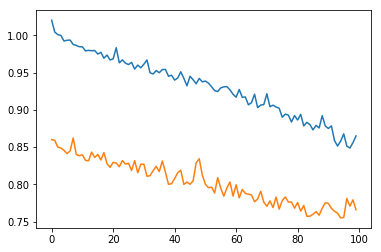

**********************Test**********************


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,Stellar Radius,Stellar Mass,Global
MAE,25.416761,0.077357,24.781153,1.984574,152.482963,246.011030,0.010186,21.611916,0.077278,0.049601,1.987179,466.798366,0.269175,0.145505,67.264503
MApE,369.301899,56.772999,2238.526948,2.394291,302.295818,36.774582,44.899855,140.625349,17.732935,29.825964,603.250569,9.175081,27.540691,17.672132,278.342079
MSE,1861.210821,0.011396,1668.488669,10.949808,75386.562673,109786.016828,0.000507,1054.780654,0.009406,0.004197,15.570175,380982.792368,0.166313,0.037693,40769.042965
MeAE,18.667671,0.060723,18.592879,1.561719,97.139732,193.907715,0.007128,16.249956,0.063338,0.038089,1.476838,368.230957,0.186160,0.107121,51.163573
RMSLE,1.287422,0.084931,1.567265,0.041484,1.278807,0.415689,0.019911,0.911424,0.066173,0.053434,0.715971,0.121929,0.167086,0.101486,0.488072


{'MAE': [25.41676122377851,
  0.07735711267976161,
  24.781152980823713,
  1.9845737292601326,
  152.48296348269622,
  246.01103001962795,
  0.010185926575457105,
  21.611916112307274,
  0.07727825494473524,
  0.0496006535386095,
  1.9871787903625564,
  466.79836594987626,
  0.269175263139517,
  0.14550531468627478,
  67.26450320102123],
 'MApE': [369.3018989877997,
  56.77299930724639,
  2238.526948136018,
  2.3942907063534644,
  302.29581839374544,
  36.774581971178954,
  44.899854923982616,
  140.625348651846,
  17.732934592802728,
  29.82596403138386,
  603.2505687914496,
  9.175081026484927,
  27.540690801433932,
  17.67213150860903,
  278.34207941645246],
 'MSE': [1861.2108212843375,
  0.011396236897052424,
  1668.4886691509516,
  10.949808340238231,
  75386.56267268864,
  109786.01682799161,
  0.000506857611591578,
  1054.7806542755372,
  0.009406472672392035,
  0.004196559082677413,
  15.570174732432188,
  380982.79236789554,
  0.16631262068570216,
  0.03769294601157759,
  4076

In [30]:
model_cnn = build_cnn_model(X_train.shape[1:], Y_train.shape[1], 32, L=3, 
                        kernel_s =5, pool=3, BN=False, drop=0.2,padding='valid',dil_r=1 )
model_cnn.compile(loss='mse', optimizer='adam')
model_cnn.summary()

hist = train_model(model_cnn, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2)
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

Y_test_hat = model_cnn.predict(X_test)
##evaluate with mse between metadata (and the values before)..
print("**********************Test**********************")
evaluate_metadata_raw(Y_test, scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 2015, 128)         0         
_________________________________________________________________
conv1d_7 (Conv1D)            (None, 2011, 32)          20512     
_________________________________________________________________
conv1d_8 (Conv1D)            (None, 2007, 32)          5152      
_________________________________________________________________
k_max_pooling_1 (KMaxPooling (None, 1344, 32)          0         
_________________________________________________________________
conv1d_9 (Conv1D)            (None, 1340, 64)          10304     
_________________________________________________________________
conv1d_10 (Conv1D)           (None, 1336, 64)          20544     
_________________________________________________________________
k_max_pooling_2 (KMaxPooling (None, 672, 64)           0         
__________

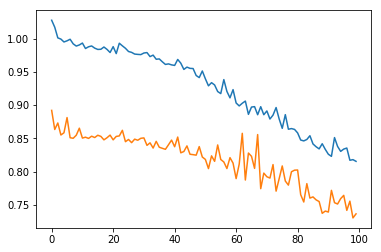

**********************Test**********************


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,Stellar Radius,Stellar Mass,Global
MAE,25.732321,0.073148,24.944662,2.222618,165.269065,257.526116,0.010882,20.807599,0.072449,0.046766,1.719509,429.278715,0.241770,0.132981,66.291329
MApE,377.536981,52.969558,1934.605042,2.666077,318.648326,39.260332,40.618712,137.208148,16.479316,28.302892,490.006732,8.494427,24.797856,16.117100,249.122250
MSE,1922.450005,0.010788,1730.856385,17.626684,81472.867448,121284.665403,0.001092,1008.635921,0.008639,0.003905,12.405757,339860.094775,0.138676,0.031248,39093.556909
MeAE,19.237719,0.051603,19.015918,1.674057,124.525253,197.551941,0.006046,15.893772,0.059594,0.035397,1.160699,324.047363,0.169070,0.102946,50.252241
RMSLE,1.311194,0.082453,1.552480,0.056585,1.327361,0.427641,0.027274,0.915723,0.063256,0.051597,0.634225,0.115392,0.151853,0.092997,0.486431


{'MAE': [25.73232054493929,
  0.07314789242409166,
  24.944661673476496,
  2.2226183477722765,
  165.2690647010756,
  257.52611585560413,
  0.010882351529981831,
  20.807599341708833,
  0.07244888767535143,
  0.04676554379557619,
  1.7195093361404516,
  429.27871480507423,
  0.24177004790400516,
  0.13298126130104065,
  66.29132861360152],
 'MApE': [377.53698059386124,
  52.969558158574415,
  1934.6050420668537,
  2.6660766446474073,
  318.64832591540664,
  39.260331922657535,
  40.618712175217134,
  137.20814817728157,
  16.479316216468327,
  28.302892301568544,
  490.00673231064036,
  8.494427162797798,
  24.797856472642287,
  16.11709964364703,
  249.12224998301886],
 'MSE': [1922.4500054081252,
  0.010788488215763411,
  1730.8563847683606,
  17.626683653504763,
  81472.86744791768,
  121284.66540309682,
  0.0010917440471223175,
  1008.6359212359907,
  0.00863877413567647,
  0.003905108170787236,
  12.405756814258337,
  339860.0947745484,
  0.1386764653947126,
  0.03124772899072794,

In [31]:
#version 1
model_kpool = build_kpool_model(X_train.shape[1:], Y_train.shape[1], 32, L=3,
                        kernel_s =5, K_top=80, BN = False, drop=0., padding='valid') #menos k??
model_kpool.compile(loss='mse', optimizer='adam')
model_kpool.summary()

hist = train_model(model_kpool, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2)
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

Y_test_hat = model_kpool.predict(X_test)
print("**********************Test**********************")
evaluate_metadata_raw(Y_test, scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used)

* op4_D

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         (None, 2015, 256)         0         
_________________________________________________________________
conv1d_19 (Conv1D)           (None, 2011, 32)          40992     
_________________________________________________________________
conv1d_20 (Conv1D)           (None, 2007, 32)          5152      
_________________________________________________________________
dropout_9 (Dropout)          (None, 2007, 32)          0         
_________________________________________________________________
average_pooling1d_7 (Average (None, 669, 32)           0         
_________________________________________________________________
conv1d_21 (Conv1D)           (None, 665, 64)           10304     
_________________________________________________________________
conv1d_22 (Conv1D)           (None, 661, 64)           20544     
__________

2841/2841 [==============================] - 25s 9ms/step - loss: 0.9346 - val_loss: 0.8012
Epoch 55/100
2841/2841 [==============================] - 24s 9ms/step - loss: 0.9354 - val_loss: 0.7954
Epoch 56/100
2841/2841 [==============================] - 25s 9ms/step - loss: 0.9386 - val_loss: 0.7976
Epoch 57/100
2841/2841 [==============================] - 24s 8ms/step - loss: 0.9399 - val_loss: 0.7982
Epoch 58/100
2841/2841 [==============================] - 23s 8ms/step - loss: 0.9287 - val_loss: 0.7901
Epoch 59/100
2841/2841 [==============================] - 24s 8ms/step - loss: 0.9306 - val_loss: 0.7859
Epoch 60/100
2841/2841 [==============================] - 23s 8ms/step - loss: 0.9265 - val_loss: 0.7902
Epoch 61/100
2841/2841 [==============================] - 23s 8ms/step - loss: 0.9340 - val_loss: 0.7922
Epoch 62/100
2841/2841 [==============================] - 24s 8ms/step - loss: 0.9260 - val_loss: 0.7867
Epoch 63/100
2841/2841 [==============================] - 23s 8ms/st

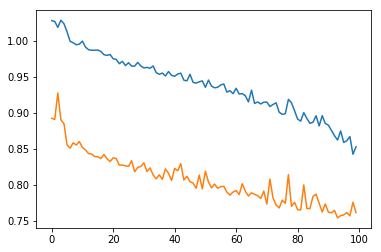

**********************Test**********************


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,Stellar Radius,Stellar Mass,Global
MAE,22.857290,0.076697,24.191051,2.045909,165.471167,259.436654,0.009714,18.798930,0.074906,0.047959,1.791750,449.655223,0.283766,0.144358,67.491812
MApE,270.289884,53.912053,1731.596657,2.459965,330.721932,41.400660,40.601460,106.354416,16.775795,29.613328,515.916625,8.929726,30.358005,17.827573,228.339863
MSE,1908.303838,0.011520,1754.981928,11.073405,79518.709469,114012.919946,0.000467,1000.381077,0.009286,0.004188,14.857197,359656.250741,0.167893,0.036573,39848.407681
MeAE,12.199187,0.055481,17.738040,1.581754,112.669029,205.107819,0.006522,11.503450,0.059881,0.035124,1.164168,354.258301,0.230248,0.114314,51.194523
RMSLE,1.176972,0.085195,1.498927,0.041710,1.377718,0.437557,0.019171,0.824731,0.065604,0.053439,0.660449,0.118896,0.172590,0.100055,0.473787


{'MAE': [22.857290236938294,
  0.07669705146263064,
  24.191050743985112,
  2.0459089017056002,
  165.4711672600248,
  259.43665372640777,
  0.009714409672948393,
  18.798929877144275,
  0.074906417607789,
  0.04795930842243799,
  1.791749535890817,
  449.6552231590347,
  0.28376600548111564,
  0.14435808322547686,
  67.49181247978598],
 'MApE': [270.28988446536005,
  53.91205338495767,
  1731.5966570823812,
  2.459965099678742,
  330.7219316673544,
  41.400660172411854,
  40.6014600222455,
  106.35441630450266,
  16.7757953912906,
  29.613327696685953,
  515.9166247045711,
  8.929726269748942,
  30.358004625256925,
  17.827572748910036,
  228.33986283109684],
 'MSE': [1908.303838496409,
  0.011520256717583124,
  1754.981927629652,
  11.073404632575146,
  79518.7094687106,
  114012.91994551083,
  0.0004667885043488446,
  1000.3810774305633,
  0.009286079667913633,
  0.004188235835936735,
  14.857197438902414,
  359656.2507406471,
  0.16789311352325223,
  0.03657313455833069,
  39848.40

In [43]:
model_cnn = build_cnn_model(X_train.shape[1:], Y_train.shape[1], 32, L=3, 
                        kernel_s =5, pool=3, BN=False, drop=0.2,padding='valid',dil_r=1 )
model_cnn.compile(loss='mse', optimizer='adam')
model_cnn.summary()

hist = train_model(model_cnn, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2)
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

Y_test_hat = model_cnn.predict(X_test)
##evaluate with mse between metadata (and the values before)..
print("**********************Test**********************")
evaluate_metadata_raw(Y_test, scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         (None, 2015, 256)         0         
_________________________________________________________________
conv1d_25 (Conv1D)           (None, 2011, 32)          40992     
_________________________________________________________________
conv1d_26 (Conv1D)           (None, 2007, 32)          5152      
_________________________________________________________________
k_max_pooling_4 (KMaxPooling (None, 1344, 32)          0         
_________________________________________________________________
conv1d_27 (Conv1D)           (None, 1340, 64)          10304     
_________________________________________________________________
conv1d_28 (Conv1D)           (None, 1336, 64)          20544     
_________________________________________________________________
k_max_pooling_5 (KMaxPooling (None, 672, 64)           0         
__________

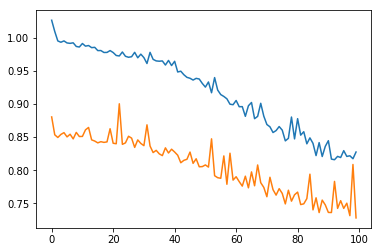

**********************Test**********************


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,Stellar Radius,Stellar Mass,Global
MAE,22.621388,0.068362,25.086480,2.200958,161.854433,252.739052,0.010956,19.581502,0.070861,0.046071,1.756162,418.165262,0.252180,0.134357,64.613430
MApE,288.784437,45.532936,2012.621505,2.642551,334.816120,39.505685,40.713261,118.394756,16.431780,27.392592,466.085637,8.156260,25.329230,16.327526,245.909591
MSE,1891.819795,0.010590,1734.157045,17.463685,77606.592484,111567.822657,0.001289,999.470371,0.007924,0.003678,13.734864,306382.152185,0.161955,0.033539,35729.530862
MeAE,13.887864,0.048132,18.472136,1.584867,115.990601,195.631714,0.005554,13.379782,0.061998,0.037281,1.133539,327.023438,0.180396,0.102340,49.109974
RMSLE,1.234700,0.081068,1.576513,0.055427,1.328801,0.424048,0.029190,0.907957,0.060746,0.050028,0.631935,0.109987,0.160413,0.095752,0.481897


{'MAE': [22.62138795888928,
  0.06836187865143248,
  25.08648034977326,
  2.200957612594755,
  161.85443292749991,
  252.7390522267559,
  0.010956254764137292,
  19.581501816157065,
  0.07086125376295335,
  0.046071035098085314,
  1.756161704877104,
  418.16526241491334,
  0.2521802203617474,
  0.13435710551243016,
  64.61343033997224],
 'MApE': [288.784437197831,
  45.532935540292804,
  2012.621504514749,
  2.642551227060681,
  334.8161204699197,
  39.505684692136036,
  40.71326116723847,
  118.39475608496505,
  16.431780047871598,
  27.39259217630126,
  466.0856372404968,
  8.156260348079671,
  25.329230441055955,
  16.32752611012932,
  245.90959123272341],
 'MSE': [1891.8197950158685,
  0.010590434840873257,
  1734.1570449048538,
  17.463684930800927,
  77606.59248350283,
  111567.82265653342,
  0.0012889095193570103,
  999.4703706757922,
  0.00792438136881754,
  0.0036782222308573563,
  13.734864172416884,
  306382.15218543867,
  0.16195486352755656,
  0.033539109773814794,
  35729

In [44]:
#version 1
model_kpool = build_kpool_model(X_train.shape[1:], Y_train.shape[1], 32, L=3,
                        kernel_s =5, K_top=80, BN = False, drop=0., padding='valid') #menos k??
model_kpool.compile(loss='mse', optimizer='adam')
model_kpool.summary()

hist = train_model(model_kpool, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2)
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

Y_test_hat = model_kpool.predict(X_test)
print("**********************Test**********************")
evaluate_metadata_raw(Y_test, scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used)

* op4_D (T simple)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         (None, 2015, 160)         0         
_________________________________________________________________
conv1d_25 (Conv1D)           (None, 2011, 32)          25632     
_________________________________________________________________
conv1d_26 (Conv1D)           (None, 2007, 32)          5152      
_________________________________________________________________
dropout_9 (Dropout)          (None, 2007, 32)          0         
_________________________________________________________________
average_pooling1d_7 (Average (None, 669, 32)           0         
_________________________________________________________________
conv1d_27 (Conv1D)           (None, 665, 64)           10304     
_________________________________________________________________
conv1d_28 (Conv1D)           (None, 661, 64)           20544     
__________

2841/2841 [==============================] - 19s 7ms/step - loss: 0.9471 - val_loss: 0.8034
Epoch 55/100
2841/2841 [==============================] - 18s 6ms/step - loss: 0.9366 - val_loss: 0.7961
Epoch 56/100
2841/2841 [==============================] - 18s 6ms/step - loss: 0.9304 - val_loss: 0.8005
Epoch 57/100
2841/2841 [==============================] - 18s 6ms/step - loss: 0.9365 - val_loss: 0.7998
Epoch 58/100
2841/2841 [==============================] - 17s 6ms/step - loss: 0.9401 - val_loss: 0.7981
Epoch 59/100
2841/2841 [==============================] - 18s 6ms/step - loss: 0.9366 - val_loss: 0.8097
Epoch 60/100
2841/2841 [==============================] - 19s 7ms/step - loss: 0.9372 - val_loss: 0.7982
Epoch 61/100
2841/2841 [==============================] - 18s 6ms/step - loss: 0.9352 - val_loss: 0.7862
Epoch 62/100
2841/2841 [==============================] - 17s 6ms/step - loss: 0.9320 - val_loss: 0.7940
Epoch 63/100
2841/2841 [==============================] - 18s 6ms/st

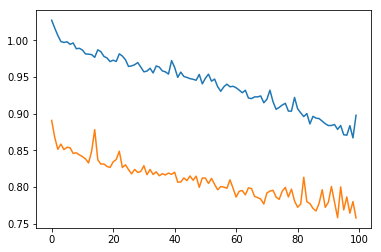

**********************Test**********************


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,Stellar Radius,Stellar Mass,Global
MAE,21.817260,0.072867,24.519632,2.092129,177.837904,261.870580,0.009572,18.506011,0.074788,0.048144,1.988261,465.280415,0.287864,0.149222,69.611046
MApE,264.093528,46.940736,1997.369619,2.507620,404.379934,42.506278,42.460355,109.210745,17.362259,28.727941,699.979377,8.967950,29.651305,17.793106,265.139339
MSE,1854.994134,0.012015,1691.254837,10.889071,79717.993314,116176.244653,0.000495,971.215406,0.008650,0.003947,14.779209,363204.457444,0.205078,0.040061,40260.149880
MeAE,13.297228,0.048272,18.033420,1.641957,140.804520,212.785156,0.006357,12.090965,0.063172,0.037862,1.542077,362.162598,0.220915,0.110124,54.488902
RMSLE,1.163024,0.086479,1.532668,0.041335,1.420049,0.451689,0.019749,0.837376,0.063475,0.051817,0.720677,0.118616,0.182397,0.104171,0.485251


{'MAE': [21.817259742734873,
  0.07286654519076237,
  24.519632168504373,
  2.0921293437693373,
  177.83790408219443,
  261.8705800122554,
  0.009571760685476336,
  18.50601129160541,
  0.07478824833596107,
  0.048144404590719996,
  1.9882610590056615,
  465.2804146039604,
  0.2878643945023565,
  0.14922198945508144,
  69.61104640334216],
 'MApE': [264.0935281840255,
  46.9407361530258,
  1997.369619201372,
  2.5076198153785834,
  404.37993391788825,
  42.50627770742722,
  42.46035507200273,
  109.21074487532849,
  17.36225865831922,
  28.72794062692512,
  699.9793770787402,
  8.967950354295345,
  29.65130502249098,
  17.79310622102446,
  265.13933949201737],
 'MSE': [1854.9941339757183,
  0.012014693489279226,
  1691.2548369326248,
  10.889071391932498,
  79717.99331352398,
  116176.24465275336,
  0.0004953322626819485,
  971.2154063542977,
  0.0086499332412426,
  0.003947353846300847,
  14.779209163836597,
  363204.4574440767,
  0.2050775796264764,
  0.040061363567786945,
  40260.149

In [32]:
model_cnn = build_cnn_model(X_train.shape[1:], Y_train.shape[1], 32, L=3, 
                        kernel_s =5, pool=3, BN=False, drop=0.2,padding='valid',dil_r=1 )
model_cnn.compile(loss='mse', optimizer='adam')
model_cnn.summary()

hist = train_model(model_cnn, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2)
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

Y_test_hat = model_cnn.predict(X_test)
##evaluate with mse between metadata (and the values before)..
print("**********************Test**********************")
evaluate_metadata_raw(Y_test, scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         (None, 2015, 160)         0         
_________________________________________________________________
conv1d_31 (Conv1D)           (None, 2011, 32)          25632     
_________________________________________________________________
conv1d_32 (Conv1D)           (None, 2007, 32)          5152      
_________________________________________________________________
k_max_pooling_7 (KMaxPooling (None, 1344, 32)          0         
_________________________________________________________________
conv1d_33 (Conv1D)           (None, 1340, 64)          10304     
_________________________________________________________________
conv1d_34 (Conv1D)           (None, 1336, 64)          20544     
_________________________________________________________________
k_max_pooling_8 (KMaxPooling (None, 672, 64)           0         
__________

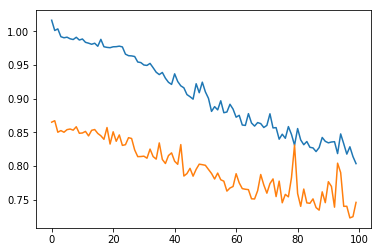

**********************Test**********************


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,Stellar Radius,Stellar Mass,Global
MAE,27.206828,0.079687,25.845795,2.111740,158.226109,253.878239,0.011534,22.324664,0.071927,0.046058,1.838367,433.093692,0.267017,0.141564,66.081659
MApE,415.674458,60.676672,2502.805858,2.552267,279.377460,37.154216,49.086560,152.722944,16.248018,28.006184,491.223754,8.585403,27.096787,16.885660,292.006874
MSE,1953.465719,0.011663,1731.977096,17.576069,86090.009157,116431.032283,0.001034,1064.321088,0.008374,0.003802,14.787738,332232.415711,0.159320,0.035283,38538.271738
MeAE,22.203062,0.062975,19.738068,1.393812,96.685410,197.366272,0.007030,17.768483,0.058623,0.034588,1.168638,363.421387,0.204264,0.114572,51.444799
RMSLE,1.356840,0.086474,1.635460,0.055972,1.354218,0.424720,0.026792,0.939091,0.062319,0.050919,0.671379,0.114538,0.165823,0.097440,0.502999


{'MAE': [27.206828322002146,
  0.07968682176478704,
  25.845794571644586,
  2.1117400902474275,
  158.2261094688189,
  253.87823867042465,
  0.011533668018243102,
  22.32466382169818,
  0.07192702341268559,
  0.04605752435922623,
  1.8383666956510991,
  433.09369198638615,
  0.2670168198717703,
  0.14156430007443568,
  66.08165855602674],
 'MApE': [415.6744575282544,
  60.67667184896018,
  2502.8058582353874,
  2.552267062642713,
  279.3774599612636,
  37.15421572099657,
  49.08655960777928,
  152.72294407279773,
  16.2480178614733,
  28.0061841318642,
  491.2237541749139,
  8.585403311489955,
  27.096786596856333,
  16.885659899761635,
  292.0068742867458],
 'MSE': [1953.465719385139,
  0.011662788618168607,
  1731.9770960692417,
  17.57606862406991,
  86090.0091566694,
  116431.03228270965,
  0.001034300874654078,
  1064.321087666326,
  0.008374046309400068,
  0.0038024260497798654,
  14.787738252960965,
  332232.41571113473,
  0.15931981806914824,
  0.03528257889168801,
  38538.2717

In [33]:
#version 1
model_kpool = build_kpool_model(X_train.shape[1:], Y_train.shape[1], 32, L=3,
                        kernel_s =5, K_top=80, BN = False, drop=0., padding='valid') #menos k??
model_kpool.compile(loss='mse', optimizer='adam')
model_kpool.summary()

hist = train_model(model_kpool, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2)
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

Y_test_hat = model_kpool.predict(X_test)
print("**********************Test**********************")
evaluate_metadata_raw(Y_test, scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used)

* op4_GRU (op4_D con gru en el decoder)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 2015, 256)         0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 2011, 32)          40992     
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 2007, 32)          5152      
_________________________________________________________________
dropout_1 (Dropout)          (None, 2007, 32)          0         
_________________________________________________________________
average_pooling1d_1 (Average (None, 669, 32)           0         
_________________________________________________________________
conv1d_3 (Conv1D)            (None, 665, 64)           10304     
_________________________________________________________________
conv1d_4 (Conv1D)            (None, 661, 64)           20544     
__________

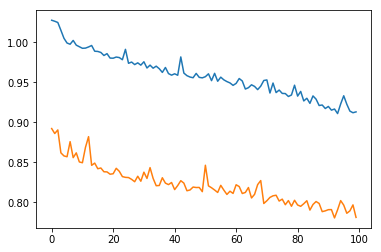

**********************Test**********************


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,Stellar Radius,Stellar Mass,Global
MAE,23.898179,0.076626,25.596886,1.977722,166.029387,252.040533,0.009425,20.048833,0.077358,0.049722,1.901408,477.182725,0.276836,0.147794,69.236674
MApE,335.353557,54.103896,2450.601625,2.387460,344.568779,38.836548,42.581231,130.666978,17.951925,29.657988,543.189371,9.309622,28.484782,17.903718,288.971248
MSE,1810.143679,0.011710,1691.254623,10.844783,80107.401355,109946.638786,0.000489,958.775623,0.009280,0.004141,15.103325,384677.943451,0.184001,0.039797,41372.739646
MeAE,17.834657,0.057903,19.635799,1.598514,125.029694,208.870361,0.006362,14.931293,0.067014,0.039661,1.403625,385.909668,0.189906,0.104634,55.405649
RMSLE,1.247423,0.085750,1.582557,0.041347,1.343752,0.421378,0.019595,0.867496,0.065790,0.053065,0.698687,0.122138,0.173403,0.103622,0.487572


{'MAE': [23.898178645516563,
  0.07662603404907346,
  25.596885562805618,
  1.9777215950843126,
  166.02938721156357,
  252.0405331451114,
  0.00942541949334416,
  20.048832517627677,
  0.07735781672685453,
  0.0497222295763469,
  1.9014080997019853,
  477.18272547957923,
  0.276836136259891,
  0.14779367358896991,
  69.23667382619178],
 'MApE': [335.35355730718516,
  54.10389557793411,
  2450.601624677547,
  2.387459989190531,
  344.5687788240843,
  38.8365475515141,
  42.58123140101343,
  130.66697836784735,
  17.951925395451358,
  29.65798818578058,
  543.1893705754486,
  9.309621637448759,
  28.484781649223528,
  17.903717797774515,
  288.97124849553165],
 'MSE': [1810.1436790111363,
  0.011710081650992502,
  1691.2546228715244,
  10.844783151406592,
  80107.40135455037,
  109946.63878571986,
  0.0004885987824541692,
  958.7756233488175,
  0.009279548449210176,
  0.004140661772238256,
  15.10332508547102,
  384677.94345051603,
  0.18400127753801626,
  0.039796570779486756,
  41372.

In [33]:
model_cnn = build_cnn_model(X_train.shape[1:], Y_train.shape[1], 32, L=3, 
                        kernel_s =5, pool=3, BN=False, drop=0.2,padding='valid',dil_r=1 )
model_cnn.compile(loss='mse', optimizer='adam')
model_cnn.summary()

hist = train_model(model_cnn, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2)
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

Y_test_hat = model_cnn.predict(X_test)
##evaluate with mse between metadata (and the values before)..
print("**********************Test**********************")
evaluate_metadata_raw(Y_test, scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 2015, 256)         0         
_________________________________________________________________
conv1d_7 (Conv1D)            (None, 2011, 32)          40992     
_________________________________________________________________
conv1d_8 (Conv1D)            (None, 2007, 32)          5152      
_________________________________________________________________
k_max_pooling_1 (KMaxPooling (None, 1344, 32)          0         
_________________________________________________________________
conv1d_9 (Conv1D)            (None, 1340, 64)          10304     
_________________________________________________________________
conv1d_10 (Conv1D)           (None, 1336, 64)          20544     
_________________________________________________________________
k_max_pooling_2 (KMaxPooling (None, 672, 64)           0         
__________

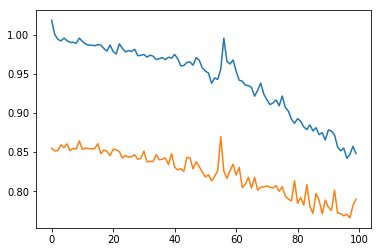

**********************Test**********************


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,Stellar Radius,Stellar Mass,Global
MAE,24.385355,0.079695,23.049142,2.152079,171.262451,269.131330,0.009517,19.681222,0.078549,0.049280,1.879736,477.477843,0.290299,0.151514,70.691287
MApE,330.717373,59.724374,1791.965592,2.580356,373.457580,42.947649,37.572015,116.789789,17.628843,30.352780,469.743601,9.470474,29.958816,18.460874,237.955008
MSE,1904.705530,0.011840,1724.345832,11.948621,83047.950278,121737.891223,0.000590,1033.296874,0.009865,0.004307,16.661923,403261.721406,0.188796,0.040144,43767.055516
MeAE,16.881829,0.060991,15.006591,1.770529,125.443779,203.994019,0.006003,13.286059,0.063773,0.036369,1.145514,368.220215,0.214030,0.121515,53.303658
RMSLE,1.251363,0.086842,1.479019,0.043369,1.391931,0.453058,0.021278,0.853688,0.067695,0.054199,0.674647,0.124714,0.177361,0.104505,0.484548


{'MAE': [24.385354883428302,
  0.07969462621429808,
  23.04914234063496,
  2.152079162597656,
  171.26245139849067,
  269.1313304938892,
  0.009516682827044832,
  19.68122175648,
  0.07854850501305988,
  0.049280035174719176,
  1.8797358575492706,
  477.4778426670792,
  0.29029899552741856,
  0.15151390111233928,
  70.69128652185844],
 'MApE': [330.7173725546998,
  59.72437374033578,
  1791.9655919909574,
  2.580356177700098,
  373.45758022383916,
  42.94764908677312,
  37.57201477841677,
  116.78978862202693,
  17.628843373365417,
  30.35277968962146,
  469.74360064862583,
  9.470474465257757,
  29.95881632593656,
  18.46087440310584,
  237.95500829147582],
 'MSE': [1904.7055301881987,
  0.011840243055821134,
  1724.3458322031017,
  11.948621421916018,
  83047.9502778834,
  121737.89122273456,
  0.000590170474009724,
  1033.296873509505,
  0.00986451328514589,
  0.0043074599745776074,
  16.6619232176467,
  403261.72140564775,
  0.1887963661961855,
  0.040143984339774376,
  43767.05551

In [34]:
#version 1
model_kpool = build_kpool_model(X_train.shape[1:], Y_train.shape[1], 32, L=3,
                        kernel_s =5, K_top=80, BN = False, drop=0., padding='valid') #menos k??
model_kpool.compile(loss='mse', optimizer='adam')
model_kpool.summary()

hist = train_model(model_kpool, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2)
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

Y_test_hat = model_kpool.predict(X_test)
print("**********************Test**********************")
evaluate_metadata_raw(Y_test, scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used)

* op4_GRU (op4_D fusionado por GRU)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         (None, 2015, 128)         0         
_________________________________________________________________
conv1d_13 (Conv1D)           (None, 2011, 32)          20512     
_________________________________________________________________
conv1d_14 (Conv1D)           (None, 2007, 32)          5152      
_________________________________________________________________
dropout_5 (Dropout)          (None, 2007, 32)          0         
_________________________________________________________________
average_pooling1d_4 (Average (None, 669, 32)           0         
_________________________________________________________________
conv1d_15 (Conv1D)           (None, 665, 64)           10304     
_________________________________________________________________
conv1d_16 (Conv1D)           (None, 661, 64)           20544     
__________

2841/2841 [==============================] - 19s 7ms/step - loss: 0.7132 - val_loss: 0.7639
Epoch 55/100
2841/2841 [==============================] - 19s 7ms/step - loss: 0.7162 - val_loss: 0.7777
Epoch 56/100
2841/2841 [==============================] - 20s 7ms/step - loss: 0.7005 - val_loss: 0.7869
Epoch 57/100
2841/2841 [==============================] - 19s 7ms/step - loss: 0.6965 - val_loss: 0.7651
Epoch 58/100
2841/2841 [==============================] - 18s 6ms/step - loss: 0.6830 - val_loss: 0.7773
Epoch 59/100
2841/2841 [==============================] - 19s 7ms/step - loss: 0.6798 - val_loss: 0.7854
Epoch 60/100
2841/2841 [==============================] - 19s 7ms/step - loss: 0.6818 - val_loss: 0.7467
Epoch 61/100
2841/2841 [==============================] - 20s 7ms/step - loss: 0.6751 - val_loss: 0.7692
Epoch 62/100
2841/2841 [==============================] - 21s 7ms/step - loss: 0.6746 - val_loss: 0.7624
Epoch 63/100
2841/2841 [==============================] - 20s 7ms/st

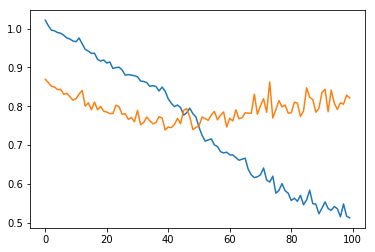

**********************Test**********************


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,Stellar Radius,Stellar Mass,Global
MAE,25.143329,0.079484,25.785320,2.062602,186.272188,276.798307,0.009302,20.731163,0.074366,0.047773,1.720592,452.071756,0.295702,0.146746,70.802759
MApE,283.110647,55.523767,1755.589519,2.487174,311.477455,41.672886,41.665607,114.792012,16.930525,28.429005,379.450529,8.941320,29.062824,17.643323,220.484042
MSE,2363.866033,0.012729,1917.894436,12.816026,99192.156514,135156.039781,0.000460,1210.570782,0.008973,0.004083,11.108312,378382.412617,0.206213,0.037609,44160.509612
MeAE,9.855194,0.057683,17.088373,1.263666,107.789917,217.568726,0.006358,11.133201,0.060962,0.036367,0.913705,330.894043,0.217727,0.114658,49.785756
RMSLE,1.213368,0.089642,1.535857,0.044541,1.419777,0.456426,0.018976,0.872163,0.064779,0.052434,0.643684,0.135954,0.181133,0.100371,0.487793


{'MAE': [25.143329374889092,
  0.07948364489160198,
  25.785319808984454,
  2.0626024490205364,
  186.27218841326118,
  276.79830701469194,
  0.009302441871203115,
  20.731162845422727,
  0.07436572671621153,
  0.04777291549031097,
  1.720591593376273,
  452.0717561929533,
  0.29570195731125254,
  0.14674615760699355,
  70.8027593240348],
 'MApE': [283.11064693980245,
  55.52376682479753,
  1755.5895191875354,
  2.487174326059629,
  311.47745488578994,
  41.67288602157353,
  41.66560672938862,
  114.79201152814889,
  16.93052482092404,
  28.429005265587865,
  379.4505290784125,
  8.941319638753013,
  29.062823792754262,
  17.643322666330032,
  220.48404226470413],
 'MSE': [2363.866033295778,
  0.012728731378882727,
  1917.8944355105593,
  12.816026325062742,
  99192.15651398618,
  135156.03978051594,
  0.0004598443850453022,
  1210.5707821290741,
  0.008973454965631011,
  0.004083238417844092,
  11.108311828285697,
  378382.41261660034,
  0.2062131484921744,
  0.03760912835615113,
  44

In [38]:
model_cnn = build_cnn_model(X_train.shape[1:], Y_train.shape[1], 32, L=3, 
                        kernel_s =5, pool=3, BN=False, drop=0.2,padding='valid',dil_r=1 )
model_cnn.compile(loss='mse', optimizer='adam')
model_cnn.summary()

hist = train_model(model_cnn, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2)
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

Y_test_hat = model_cnn.predict(X_test)
##evaluate with mse between metadata (and the values before)..
print("**********************Test**********************")
evaluate_metadata_raw(Y_test, scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         (None, 2015, 128)         0         
_________________________________________________________________
conv1d_19 (Conv1D)           (None, 2011, 32)          20512     
_________________________________________________________________
conv1d_20 (Conv1D)           (None, 2007, 32)          5152      
_________________________________________________________________
k_max_pooling_4 (KMaxPooling (None, 1344, 32)          0         
_________________________________________________________________
conv1d_21 (Conv1D)           (None, 1340, 64)          10304     
_________________________________________________________________
conv1d_22 (Conv1D)           (None, 1336, 64)          20544     
_________________________________________________________________
k_max_pooling_5 (KMaxPooling (None, 672, 64)           0         
__________

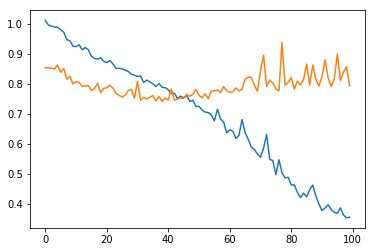

**********************Test**********************


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,Stellar Radius,Stellar Mass,Global
MAE,27.404715,0.078938,25.312270,2.230574,188.893480,310.241739,0.011544,23.112067,0.079749,0.053332,3.115040,5.083645e+02,0.277080,0.150716,77.808982
MApE,984.703593,57.599603,1912.157341,2.678778,278.593815,43.260180,46.175040,282.394087,17.514421,35.324129,886.165208,1.011598e+01,26.924935,18.063998,328.690793
MSE,13075.952462,0.022245,1939.959103,17.294988,180250.722775,442095.693296,0.001424,6536.590073,0.016772,0.016057,980.644420,1.332288e+06,0.208051,0.042217,141227.481867
MeAE,10.189214,0.053283,16.382935,1.181915,89.037834,217.093933,0.006517,12.258229,0.059159,0.032427,1.066745,3.504648e+02,0.182971,0.114217,49.866016
RMSLE,1.326008,0.085774,1.580313,0.067864,1.451846,0.466039,0.028802,0.972737,0.071495,0.075665,0.694716,3.945768e-01,0.178130,0.104374,0.535596


{'MAE': [27.40471455317207,
  0.07893757266398782,
  25.31227029617224,
  2.2305739688684443,
  188.89347966626138,
  310.24173898224785,
  0.0115440632676134,
  23.112067441503125,
  0.07974947427829893,
  0.05333164695229861,
  3.115040174402834,
  508.36450920482673,
  0.2770796356064258,
  0.15071632743967642,
  77.8089823576902],
 'MApE': [984.7035926174461,
  57.59960291231223,
  1912.157340830629,
  2.678777562942966,
  278.5938147624946,
  43.26018047407258,
  46.175040108209885,
  282.3940874624671,
  17.51442121872995,
  35.32412894170875,
  886.1652083575734,
  10.115978911540486,
  26.92493531218949,
  18.06399760329015,
  328.6907933625434],
 'MSE': [13075.952462485244,
  0.022245234831761072,
  1939.959102738083,
  17.294987912116632,
  180250.7227747344,
  442095.69329647796,
  0.001424083794208036,
  6536.590072879627,
  0.0167724118040801,
  0.016056827618412706,
  980.6444197894386,
  1332287.5822609137,
  0.2080506917822597,
  0.042217448875539514,
  141227.481867473

In [39]:
#version 1
model_kpool = build_kpool_model(X_train.shape[1:], Y_train.shape[1], 32, L=3,
                        kernel_s =5, K_top=80, BN = False, drop=0., padding='valid') #menos k??
model_kpool.compile(loss='mse', optimizer='adam')
model_kpool.summary()

hist = train_model(model_kpool, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2)
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

Y_test_hat = model_kpool.predict(X_test)
print("**********************Test**********************")
evaluate_metadata_raw(Y_test, scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used)

* op4_GRU-T (op4_D con GRU en el encoder)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         (None, 2015, 256)         0         
_________________________________________________________________
conv1d_13 (Conv1D)           (None, 2011, 32)          40992     
_________________________________________________________________
conv1d_14 (Conv1D)           (None, 2007, 32)          5152      
_________________________________________________________________
dropout_5 (Dropout)          (None, 2007, 32)          0         
_________________________________________________________________
average_pooling1d_4 (Average (None, 669, 32)           0         
_________________________________________________________________
conv1d_15 (Conv1D)           (None, 665, 64)           10304     
_________________________________________________________________
conv1d_16 (Conv1D)           (None, 661, 64)           20544     
__________

2841/2841 [==============================] - 25s 9ms/step - loss: 0.9889 - val_loss: 0.8504
Epoch 55/100
2841/2841 [==============================] - 25s 9ms/step - loss: 0.9897 - val_loss: 0.8485
Epoch 56/100
2841/2841 [==============================] - 25s 9ms/step - loss: 0.9874 - val_loss: 0.8516
Epoch 57/100
2841/2841 [==============================] - 24s 9ms/step - loss: 0.9897 - val_loss: 0.8454
Epoch 58/100
2841/2841 [==============================] - 25s 9ms/step - loss: 0.9893 - val_loss: 0.8467
Epoch 59/100
2841/2841 [==============================] - 25s 9ms/step - loss: 0.9875 - val_loss: 0.8496
Epoch 60/100
2841/2841 [==============================] - 25s 9ms/step - loss: 0.9882 - val_loss: 0.8453
Epoch 61/100
2841/2841 [==============================] - 25s 9ms/step - loss: 0.9854 - val_loss: 0.8457
Epoch 62/100
2841/2841 [==============================] - 25s 9ms/step - loss: 0.9870 - val_loss: 0.8496
Epoch 63/100
2841/2841 [==============================] - 26s 9ms/st

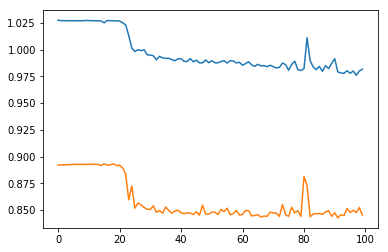

**********************Test**********************


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,Stellar Radius,Stellar Mass,Global
MAE,26.683167,0.083607,26.089551,2.036402,171.713847,265.482936,0.010233,22.215980,0.079932,0.051110,1.899833,485.589064,0.300940,0.152829,71.599245
MApE,395.378874,62.208190,2403.285238,2.457714,344.404253,41.304021,46.194225,151.377019,18.416879,30.762444,623.318218,9.553087,30.992742,18.594556,298.446247
MSE,1919.841046,0.012420,1709.485743,11.346776,83194.964920,119721.047961,0.000523,1064.324793,0.009806,0.004318,15.324039,398150.435633,0.227172,0.042699,43270.504846
MeAE,20.523305,0.069971,20.348832,1.677421,127.344467,222.789734,0.006925,17.991211,0.070686,0.042514,1.503028,393.885254,0.224005,0.115225,57.613756
RMSLE,1.334228,0.088903,1.600096,0.042235,1.352721,0.442510,0.020407,0.933115,0.067541,0.054229,0.700709,0.124596,0.191376,0.107202,0.504276


{'MAE': [26.683167404495176,
  0.08360678418676294,
  26.089550724046088,
  2.036402156414371,
  171.71384655036547,
  265.48293614151453,
  0.010232732278049583,
  22.21597966749739,
  0.07993212393675701,
  0.051109639489532704,
  1.899833258911586,
  485.58906443378714,
  0.30093999270826277,
  0.15282902220452188,
  71.5992450451311],
 'MApE': [395.3788735552889,
  62.20819013877071,
  2403.2852378535686,
  2.4577138963832112,
  344.40425340305364,
  41.30402076552584,
  46.19422548543343,
  151.37701865055877,
  18.416878703878336,
  30.76244423709814,
  623.3182177107163,
  9.553086874841608,
  30.99274240191402,
  18.594555583634556,
  298.44624709004756],
 'MSE': [1919.8410462946283,
  0.01241976663523905,
  1709.4857429565927,
  11.346775634231305,
  83194.96492036006,
  119721.04796121675,
  0.0005227696208766051,
  1064.32479296255,
  0.009805688451093357,
  0.004317873104071399,
  15.324038818619137,
  398150.43563331186,
  0.2271721319011107,
  0.042698718570319094,
  4327

In [27]:
model_cnn = build_cnn_model(X_train.shape[1:], Y_train.shape[1], 32, L=3, 
                        kernel_s =5, pool=3, BN=False, drop=0.2,padding='valid',dil_r=1 )
model_cnn.compile(loss='mse', optimizer='adam')
model_cnn.summary()

hist = train_model(model_cnn, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2)
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

Y_test_hat = model_cnn.predict(X_test)
##evaluate with mse between metadata (and the values before)..
print("**********************Test**********************")
evaluate_metadata_raw(Y_test, scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         (None, 2015, 256)         0         
_________________________________________________________________
conv1d_19 (Conv1D)           (None, 2011, 32)          40992     
_________________________________________________________________
conv1d_20 (Conv1D)           (None, 2007, 32)          5152      
_________________________________________________________________
k_max_pooling_4 (KMaxPooling (None, 1344, 32)          0         
_________________________________________________________________
conv1d_21 (Conv1D)           (None, 1340, 64)          10304     
_________________________________________________________________
conv1d_22 (Conv1D)           (None, 1336, 64)          20544     
_________________________________________________________________
k_max_pooling_5 (KMaxPooling (None, 672, 64)           0         
__________

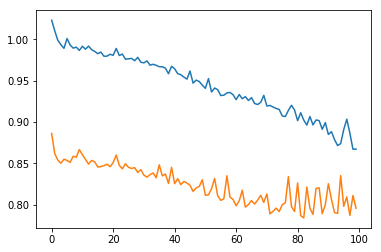

**********************Test**********************


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,Stellar Radius,Stellar Mass,Global
MAE,22.693514,0.073770,25.393722,2.037867,170.809827,257.835922,0.010019,20.383935,0.079488,0.051493,1.915739,491.232481,0.264400,0.151404,70.923827
MApE,275.199388,48.549823,2373.442713,2.456524,358.123799,38.837575,45.252700,125.386528,18.724239,29.845264,558.240838,9.425352,25.643191,17.667119,280.485361
MSE,1939.028066,0.011763,1760.643346,11.829353,81422.689350,114685.588189,0.000627,1050.241473,0.009664,0.004349,14.883213,383411.085381,0.178664,0.039821,41735.445233
MeAE,13.090469,0.050401,19.000500,1.509845,130.867569,208.678345,0.006833,14.564985,0.068885,0.042211,1.357503,420.217285,0.170902,0.117646,57.838813
RMSLE,1.254083,0.085657,1.583750,0.043239,1.369754,0.423285,0.021840,0.929251,0.067336,0.054219,0.696651,0.120819,0.169458,0.103223,0.494469


{'MAE': [22.693514239283033,
  0.0737701317909834,
  25.39372162199142,
  2.037866797116723,
  170.8098267054794,
  257.83592196927214,
  0.010019294665399756,
  20.383935212083856,
  0.07948780957023696,
  0.05149332383198313,
  1.9157391870444267,
  491.23248085550745,
  0.2643998455481954,
  0.15140416475428214,
  70.92382722556711],
 'MApE': [275.19938814044457,
  48.54982290443822,
  2373.4427129556384,
  2.456524171650987,
  358.12379881257607,
  38.83757482721015,
  45.25269981576008,
  125.38652755653845,
  18.72423883794782,
  29.845264399180493,
  558.2408379013108,
  9.425352023557936,
  25.643191215972923,
  17.66711856175785,
  280.4853608659989],
 'MSE': [1939.0280656927393,
  0.011762919043575926,
  1760.6433460958258,
  11.829352865050232,
  81422.68935027934,
  114685.58818947713,
  0.0006266073698864933,
  1050.2414729218344,
  0.009663541153714714,
  0.004348712332852431,
  14.883213119629222,
  383411.08538146963,
  0.17866385795963202,
  0.03982070964106676,
  4173

In [28]:
#version 1
model_kpool = build_kpool_model(X_train.shape[1:], Y_train.shape[1], 32, L=3,
                        kernel_s =5, K_top=80, BN = False, drop=0., padding='valid') #menos k??
model_kpool.compile(loss='mse', optimizer='adam')
model_kpool.summary()

hist = train_model(model_kpool, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2)
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

Y_test_hat = model_kpool.predict(X_test)
print("**********************Test**********************")
evaluate_metadata_raw(Y_test, scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used)

#period: 214.779069

### T = 32 (simple modelo)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         (None, 2015, 128)         0         
_________________________________________________________________
conv1d_25 (Conv1D)           (None, 2011, 32)          20512     
_________________________________________________________________
conv1d_26 (Conv1D)           (None, 2007, 32)          5152      
_________________________________________________________________
dropout_9 (Dropout)          (None, 2007, 32)          0         
_________________________________________________________________
average_pooling1d_7 (Average (None, 669, 32)           0         
_________________________________________________________________
conv1d_27 (Conv1D)           (None, 665, 64)           10304     
_________________________________________________________________
conv1d_28 (Conv1D)           (None, 661, 64)           20544     
__________

2841/2841 [==============================] - 21s 7ms/step - loss: 0.6750 - val_loss: 0.8113
Epoch 55/100
2841/2841 [==============================] - 20s 7ms/step - loss: 0.6606 - val_loss: 0.8296
Epoch 56/100
2841/2841 [==============================] - 20s 7ms/step - loss: 0.6467 - val_loss: 0.8349
Epoch 57/100
2841/2841 [==============================] - 20s 7ms/step - loss: 0.6540 - val_loss: 0.8562
Epoch 58/100
2841/2841 [==============================] - 20s 7ms/step - loss: 0.6433 - val_loss: 0.8520
Epoch 59/100
2841/2841 [==============================] - 20s 7ms/step - loss: 0.6450 - val_loss: 0.8314
Epoch 60/100
2841/2841 [==============================] - 21s 7ms/step - loss: 0.6307 - val_loss: 0.8548
Epoch 61/100
2841/2841 [==============================] - 21s 7ms/step - loss: 0.6462 - val_loss: 0.8659
Epoch 62/100
2841/2841 [==============================] - 20s 7ms/step - loss: 0.6396 - val_loss: 0.8838
Epoch 63/100
2841/2841 [==============================] - 21s 7ms/st

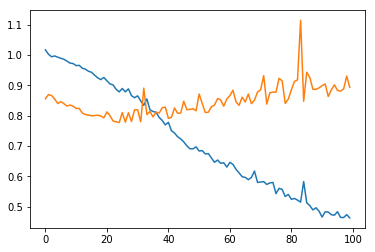

**********************Test**********************


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,Stellar Radius,Stellar Mass,Global
MAE,24.369103,0.082650,25.574967,2.132963,175.145581,293.872116,0.009439,20.663612,0.074563,0.047425,1.616155,446.928402,0.319967,0.151392,70.784881
MApE,277.366001,59.515261,1833.955019,2.528765,316.259103,44.807570,40.754625,121.061255,16.402388,29.236593,416.580945,8.964845,31.972804,18.414987,229.844297
MSE,2274.510272,0.013228,1855.554535,10.861945,89499.964128,147894.514371,0.000403,1199.014023,0.009733,0.004391,12.885565,374316.029056,0.290261,0.040504,44075.978030
MeAE,11.143952,0.060813,17.570063,1.425466,95.275742,227.852478,0.006431,11.869121,0.057658,0.033630,0.891791,326.687012,0.212752,0.113490,49.514314
RMSLE,1.249345,0.091178,1.542290,0.039543,1.342985,0.472100,0.017908,0.921134,0.067588,0.054302,0.620734,0.123182,0.201319,0.103605,0.489087


{'MAE': [24.369102539994095,
  0.08265032103546696,
  25.574967008456877,
  2.132962752842667,
  175.14558094515658,
  293.8721158169284,
  0.009439100012301218,
  20.66361217198136,
  0.0745625342012632,
  0.04742497468537622,
  1.6161550301009702,
  446.9284015315594,
  0.3199666447993552,
  0.15139166074837787,
  70.78488093089302],
 'MApE': [277.36600090762727,
  59.51526137677231,
  1833.955018506487,
  2.5287646934887347,
  316.2591034399006,
  44.807570014451755,
  40.754624625732454,
  121.06125478505487,
  16.402388208579524,
  29.236593297184456,
  416.58094528941876,
  8.964845431942392,
  31.972804341755616,
  18.414987331741315,
  229.84429730358121],
 'MSE': [2274.5102715932117,
  0.01322812663251174,
  1855.554535422385,
  10.861944833680415,
  89499.96412769252,
  147894.5143707244,
  0.0004025748942745263,
  1199.014022950119,
  0.009733139181696304,
  0.0043909023213507,
  12.885564767099417,
  374316.02905572025,
  0.29026095704520133,
  0.04050386895806758,
  44075.

In [34]:
model_cnn = build_cnn_model(X_train.shape[1:], Y_train.shape[1], 32, L=3, 
                        kernel_s =5, pool=3, BN=False, drop=0.2,padding='valid',dil_r=1 )
model_cnn.compile(loss='mse', optimizer='adam')
model_cnn.summary()

hist = train_model(model_cnn, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2)
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

Y_test_hat = model_cnn.predict(X_test)
##evaluate with mse between metadata (and the values before)..
print("**********************Test**********************")
evaluate_metadata_raw(Y_test, scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         (None, 2015, 128)         0         
_________________________________________________________________
conv1d_31 (Conv1D)           (None, 2011, 32)          20512     
_________________________________________________________________
conv1d_32 (Conv1D)           (None, 2007, 32)          5152      
_________________________________________________________________
k_max_pooling_7 (KMaxPooling (None, 1344, 32)          0         
_________________________________________________________________
conv1d_33 (Conv1D)           (None, 1340, 64)          10304     
_________________________________________________________________
conv1d_34 (Conv1D)           (None, 1336, 64)          20544     
_________________________________________________________________
k_max_pooling_8 (KMaxPooling (None, 672, 64)           0         
__________

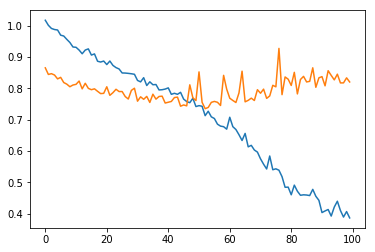

**********************Test**********************


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,Stellar Radius,Stellar Mass,Global
MAE,27.349636,0.083443,26.408534,2.213792,191.793592,305.679293,0.010726,22.525262,0.071703,0.046162,1.608662,411.589439,0.258751,0.135407,70.698172
MApE,338.922763,56.205606,2767.270287,2.643495,355.503153,45.528638,46.610729,127.709041,16.377344,27.177387,383.092345,8.113654,26.026111,16.234616,301.243941
MSE,2487.966885,0.013895,1897.505852,13.489240,103907.042890,162460.018715,0.000760,1307.770080,0.008204,0.003745,11.515124,317324.889551,0.156001,0.032302,42100.743803
MeAE,12.713031,0.060854,17.751068,1.332561,105.240906,244.334717,0.006438,14.315039,0.061677,0.034238,0.922860,334.895508,0.176183,0.103568,52.282046
RMSLE,1.468559,0.093981,1.669565,0.045600,1.696594,0.500477,0.023798,0.994622,0.061637,0.050523,0.599168,0.111929,0.161703,0.094136,0.540878


{'MAE': [27.34963602523608,
  0.08344349732160018,
  26.408533841450396,
  2.213791806966951,
  191.79359162916052,
  305.6792934304417,
  0.01072646025503331,
  22.525261766877154,
  0.07170276168171723,
  0.04616200349189267,
  1.6086624125377165,
  411.5894386215965,
  0.2587510770750518,
  0.1354065281971846,
  70.69817156159212],
 'MApE': [338.9227632150564,
  56.205606339116635,
  2767.2702874183906,
  2.643494528191772,
  355.5031534947561,
  45.5286377919032,
  46.61072859466201,
  127.7090411175038,
  16.377343955296176,
  27.17738680509139,
  383.09234458886544,
  8.113654331201504,
  26.02611094647885,
  16.23461563984018,
  301.2439406261681],
 'MSE': [2487.9668847492894,
  0.013894794248041865,
  1897.5058515144406,
  13.489239756721805,
  103907.04289010601,
  162460.01871515377,
  0.0007600206820285156,
  1307.770080456014,
  0.008204392690109105,
  0.003744620964037204,
  11.515123500912498,
  317324.8895513832,
  0.15600141663678718,
  0.03230212971627453,
  42100.7438

In [35]:
#version 1
model_kpool = build_kpool_model(X_train.shape[1:], Y_train.shape[1], 32, L=3,
                        kernel_s =5, K_top=80, BN = False, drop=0., padding='valid') #menos k??
model_kpool.compile(loss='mse', optimizer='adam')
model_kpool.summary()

hist = train_model(model_kpool, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2)
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

Y_test_hat = model_kpool.predict(X_test)
print("**********************Test**********************")
evaluate_metadata_raw(Y_test, scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used)

#period: 214.779069

* op4_GRU-T (op4_D fusionado por GRU)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 2015, 128)         0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 2011, 32)          20512     
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 2007, 32)          5152      
_________________________________________________________________
dropout_1 (Dropout)          (None, 2007, 32)          0         
_________________________________________________________________
average_pooling1d_1 (Average (None, 669, 32)           0         
_________________________________________________________________
conv1d_3 (Conv1D)            (None, 665, 64)           10304     
_________________________________________________________________
conv1d_4 (Conv1D)            (None, 661, 64)           20544     
__________

2841/2841 [==============================] - 17s 6ms/step - loss: 0.6840 - val_loss: 0.7847
Epoch 55/100
2841/2841 [==============================] - 18s 6ms/step - loss: 0.6388 - val_loss: 0.8246
Epoch 56/100
2841/2841 [==============================] - 17s 6ms/step - loss: 0.6393 - val_loss: 0.8067
Epoch 57/100
2841/2841 [==============================] - 17s 6ms/step - loss: 0.6348 - val_loss: 0.8095
Epoch 58/100
2841/2841 [==============================] - 17s 6ms/step - loss: 0.6365 - val_loss: 0.7937
Epoch 59/100
2841/2841 [==============================] - 17s 6ms/step - loss: 0.6192 - val_loss: 0.8325
Epoch 60/100
2841/2841 [==============================] - 17s 6ms/step - loss: 0.6265 - val_loss: 0.8468
Epoch 61/100
2841/2841 [==============================] - 17s 6ms/step - loss: 0.6130 - val_loss: 0.8217
Epoch 62/100
2841/2841 [==============================] - 17s 6ms/step - loss: 0.6115 - val_loss: 0.8029
Epoch 63/100
2841/2841 [==============================] - 17s 6ms/st

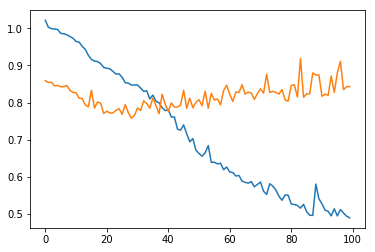

**********************Test**********************


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,Stellar Radius,Stellar Mass,Global
MAE,26.243553,0.078339,26.695501,2.123131,178.286406,290.584590,0.009129,21.952583,0.076135,0.048576,1.668625,442.447315,0.283984,0.145763,70.760259
MApE,298.930331,55.466637,2202.606829,2.552994,370.634678,45.286222,40.753849,111.597757,17.205224,29.101530,419.288419,8.676722,27.075501,16.877270,260.432426
MSE,5071.146564,0.015258,2713.285486,12.304274,93008.314835,147689.718881,0.000357,2337.801319,0.009754,0.004460,12.606309,339685.719430,0.225660,0.037334,42180.799280
MeAE,9.882991,0.047487,16.946422,1.466584,97.168884,225.773315,0.006310,10.947340,0.061593,0.035421,0.949893,349.374023,0.177516,0.117805,50.925399
RMSLE,1.247895,0.096563,1.542359,0.043630,1.435880,0.538911,0.016950,0.920956,0.067099,0.054662,0.627326,0.114484,0.179680,0.098637,0.498931


{'MAE': [26.2435530654355,
  0.07833912102512086,
  26.69550146547096,
  2.1231307300529854,
  178.28640590695352,
  290.58459031511063,
  0.009129174996396103,
  21.95258289595217,
  0.07613537264153508,
  0.0485760045484151,
  1.6686250798046538,
  442.4473149365718,
  0.28398394962260776,
  0.1457631713612245,
  70.76025937068195],
 'MApE': [298.93033090396403,
  55.46663733492899,
  2202.6068287592675,
  2.5529940824311574,
  370.6346784090411,
  45.28622178776992,
  40.75384853894731,
  111.59775685713977,
  17.2052243812531,
  29.101530140261296,
  419.2884190453218,
  8.676722267084372,
  27.075500744949863,
  16.87727046577782,
  260.432425979867],
 'MSE': [5071.146563962089,
  0.015257741678499585,
  2713.2854860161483,
  12.304273527634082,
  93008.31483542922,
  147689.71888059253,
  0.00035745558859327396,
  2337.801319486878,
  0.009754088737118454,
  0.0044604709120914365,
  12.60630948885676,
  339685.71942964074,
  0.22566037766941796,
  0.03733429658533361,
  42180.799

In [21]:
model_cnn = build_cnn_model(X_train.shape[1:], Y_train.shape[1], 32, L=3, 
                        kernel_s =5, pool=3, BN=False, drop=0.2,padding='valid',dil_r=1 )
model_cnn.compile(loss='mse', optimizer='adam')
model_cnn.summary()

hist = train_model(model_cnn, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2)
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

Y_test_hat = model_cnn.predict(X_test)
##evaluate with mse between metadata (and the values before)..
print("**********************Test**********************")
evaluate_metadata_raw(Y_test, scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 2015, 128)         0         
_________________________________________________________________
conv1d_7 (Conv1D)            (None, 2011, 32)          20512     
_________________________________________________________________
conv1d_8 (Conv1D)            (None, 2007, 32)          5152      
_________________________________________________________________
k_max_pooling_1 (KMaxPooling (None, 1344, 32)          0         
_________________________________________________________________
conv1d_9 (Conv1D)            (None, 1340, 64)          10304     
_________________________________________________________________
conv1d_10 (Conv1D)           (None, 1336, 64)          20544     
_________________________________________________________________
k_max_pooling_2 (KMaxPooling (None, 672, 64)           0         
__________

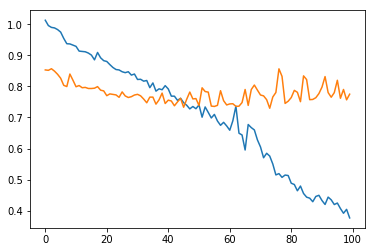

**********************Test**********************


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,Stellar Radius,Stellar Mass,Global
MAE,23.653835,0.071723,24.385887,2.516239,203.982667,300.451692,0.009623,21.002996,0.070074,0.045388,1.739661,425.569209,0.277734,0.136624,71.708097
MApE,229.829006,42.847486,1677.231570,2.984649,406.295352,46.402006,39.815931,106.868480,16.185168,26.298439,518.156198,8.270943,27.220221,15.825932,226.016527
MSE,2177.317808,0.012070,1862.106523,16.256975,111959.835265,157731.502111,0.000554,1199.046583,0.008181,0.003707,10.266016,335949.954422,0.253633,0.033103,43636.185496
MeAE,10.249578,0.044179,16.091229,1.568091,105.292221,233.514771,0.006047,12.216262,0.055139,0.035327,1.079512,307.750488,0.177765,0.103592,49.156014
RMSLE,1.364395,0.086885,1.530259,0.050184,1.528159,0.491499,0.020347,0.937117,0.061747,0.050150,0.634543,0.114697,0.179498,0.094231,0.510265


{'MAE': [23.653835495892157,
  0.07172303774669067,
  24.38588672981147,
  2.5162390432829906,
  203.98266711083085,
  300.45169217704546,
  0.009623114424663607,
  21.002996027393742,
  0.07007431582601945,
  0.04538771793275776,
  1.7396606555852985,
  425.5692087909963,
  0.27773381250589196,
  0.13662389366697555,
  71.70809656592436],
 'MApE': [229.82900560091068,
  42.847485522373105,
  1677.231569981936,
  2.984649346921479,
  406.295351923173,
  46.40200566102083,
  39.8159306634976,
  106.86847988176247,
  16.185168063777393,
  26.298438830746495,
  518.1561980143944,
  8.270942621694832,
  27.22022060109035,
  15.825932204545348,
  226.01652706556027],
 'MSE': [2177.3178078579153,
  0.012070334767129844,
  1862.1065229770388,
  16.256975056562997,
  111959.83526536406,
  157731.5021105923,
  0.0005535734411965184,
  1199.0465832429568,
  0.00818108346033726,
  0.003707074055048559,
  10.266015559937662,
  335949.9544217071,
  0.2536326082542687,
  0.03310273252402508,
  43636

In [22]:
#version 1
model_kpool = build_kpool_model(X_train.shape[1:], Y_train.shape[1], 32, L=3,
                        kernel_s =5, K_top=80, BN = False, drop=0., padding='valid') #menos k??
model_kpool.compile(loss='mse', optimizer='adam')
model_kpool.summary()

hist = train_model(model_kpool, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2)
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

Y_test_hat = model_kpool.predict(X_test)
print("**********************Test**********************")
evaluate_metadata_raw(Y_test, scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used)

#period: 214.779069

### T = 32 (simple modelo)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         (None, 2015, 128)         0         
_________________________________________________________________
conv1d_13 (Conv1D)           (None, 2011, 32)          20512     
_________________________________________________________________
conv1d_14 (Conv1D)           (None, 2007, 32)          5152      
_________________________________________________________________
dropout_5 (Dropout)          (None, 2007, 32)          0         
_________________________________________________________________
average_pooling1d_4 (Average (None, 669, 32)           0         
_________________________________________________________________
conv1d_15 (Conv1D)           (None, 665, 64)           10304     
_________________________________________________________________
conv1d_16 (Conv1D)           (None, 661, 64)           20544     
__________

2841/2841 [==============================] - 20s 7ms/step - loss: 0.7297 - val_loss: 0.8056
Epoch 55/100
2841/2841 [==============================] - 20s 7ms/step - loss: 0.7197 - val_loss: 0.8032
Epoch 56/100
2841/2841 [==============================] - 19s 7ms/step - loss: 0.7104 - val_loss: 0.7927
Epoch 57/100
2841/2841 [==============================] - 20s 7ms/step - loss: 0.6977 - val_loss: 0.8252
Epoch 58/100
2841/2841 [==============================] - 20s 7ms/step - loss: 0.7022 - val_loss: 0.8925
Epoch 59/100
2841/2841 [==============================] - 20s 7ms/step - loss: 0.7318 - val_loss: 0.8097
Epoch 60/100
2841/2841 [==============================] - 20s 7ms/step - loss: 0.7077 - val_loss: 0.7973
Epoch 61/100
2841/2841 [==============================] - 20s 7ms/step - loss: 0.7002 - val_loss: 0.7819
Epoch 62/100
2841/2841 [==============================] - 19s 7ms/step - loss: 0.6876 - val_loss: 0.7905
Epoch 63/100
2841/2841 [==============================] - 20s 7ms/st

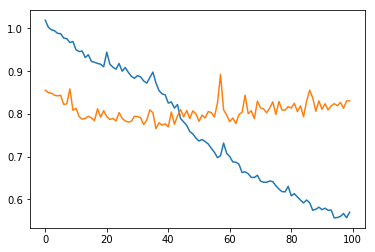

**********************Test**********************


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,Stellar Radius,Stellar Mass,Global
MAE,25.604133,0.080767,26.061564,1.983637,168.694256,271.736946,0.009765,21.461795,0.070358,0.045832,1.687097,423.010030,0.252196,0.138180,67.202611
MApE,320.214529,55.992411,2465.855945,2.394146,263.682230,38.956789,44.253039,136.389153,16.073053,27.484332,482.145476,8.295246,24.810868,16.387488,278.781050
MSE,2287.756630,0.012255,1824.616615,11.683680,92939.521984,134912.571457,0.000441,1202.306195,0.007965,0.003687,8.968161,318926.005682,0.161206,0.033511,39436.689248
MeAE,11.574286,0.059209,18.608178,1.192984,94.048737,199.400574,0.006613,12.021806,0.055634,0.035756,1.089691,326.877930,0.169245,0.107818,47.517747
RMSLE,1.257754,0.088088,1.583060,0.042543,1.375232,0.471020,0.018646,0.918201,0.060818,0.050094,0.639789,0.114738,0.161594,0.094535,0.491151


{'MAE': [25.604133000840893,
  0.08076742784547805,
  26.061563826141267,
  1.9836371774201342,
  168.6942564180582,
  271.73694596243377,
  0.009765061684823271,
  21.461795431201292,
  0.07035810409442034,
  0.04583231259832288,
  1.687097141051729,
  423.01003007038986,
  0.25219599373317003,
  0.13818033857770487,
  67.20261130471937],
 'MApE': [320.2145285105968,
  55.99241057156178,
  2465.855945342428,
  2.3941460146617057,
  263.6822298300218,
  38.95678941877475,
  44.25303864284484,
  136.38915282560293,
  16.07305340167169,
  27.484331733910228,
  482.1454755469183,
  8.2952455710459,
  24.810868003217575,
  16.387487730102716,
  278.78105022452564],
 'MSE': [2287.756630182557,
  0.012254605064376345,
  1824.616615045298,
  11.683679548639494,
  92939.52198441976,
  134912.5714574797,
  0.00044053723439740493,
  1202.3061946340463,
  0.00796464637743477,
  0.00368732542819828,
  8.968160757788317,
  318926.00568225374,
  0.16120596828586203,
  0.033510755100676776,
  39436.6

In [29]:
model_cnn = build_cnn_model(X_train.shape[1:], Y_train.shape[1], 32, L=3, 
                        kernel_s =5, pool=3, BN=False, drop=0.2,padding='valid',dil_r=1 )
model_cnn.compile(loss='mse', optimizer='adam')
model_cnn.summary()

hist = train_model(model_cnn, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2)
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

Y_test_hat = model_cnn.predict(X_test)
##evaluate with mse between metadata (and the values before)..
print("**********************Test**********************")
evaluate_metadata_raw(Y_test, scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         (None, 2015, 128)         0         
_________________________________________________________________
conv1d_19 (Conv1D)           (None, 2011, 32)          20512     
_________________________________________________________________
conv1d_20 (Conv1D)           (None, 2007, 32)          5152      
_________________________________________________________________
k_max_pooling_4 (KMaxPooling (None, 1344, 32)          0         
_________________________________________________________________
conv1d_21 (Conv1D)           (None, 1340, 64)          10304     
_________________________________________________________________
conv1d_22 (Conv1D)           (None, 1336, 64)          20544     
_________________________________________________________________
k_max_pooling_5 (KMaxPooling (None, 672, 64)           0         
__________

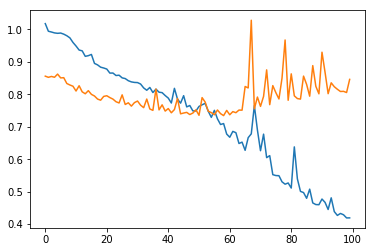

**********************Test**********************


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,Stellar Radius,Stellar Mass,Global
MAE,25.566460,0.077812,27.078649,2.075014,187.935204,294.991075,0.010695,22.704432,0.078700,0.051167,2.173305,503.970823,0.265760,0.157449,76.224039
MApE,243.595671,46.796221,2239.602174,2.476217,343.589852,43.029540,50.254165,132.002959,18.759030,28.268625,709.242230,9.510174,24.523643,17.791655,279.245868
MSE,2442.374910,0.013424,1986.392202,11.029954,90954.797174,156571.380134,0.000632,1316.056259,0.009740,0.004414,18.112889,443147.904151,0.176938,0.044210,49746.306931
MeAE,9.610313,0.052131,19.380925,1.269869,111.564453,216.351440,0.007302,12.329767,0.066106,0.039875,1.335591,385.430664,0.185848,0.117351,54.124402
RMSLE,1.502467,0.091882,1.666482,0.040851,1.663897,0.487154,0.022074,0.970971,0.067756,0.054508,0.737284,0.130810,0.169164,0.110146,0.551103


{'MAE': [25.56646009963539,
  0.07781191466195828,
  27.07864910542796,
  2.0750138489373837,
  187.9352036315616,
  294.9910746659383,
  0.010695124317351543,
  22.704432340080075,
  0.07870018600260859,
  0.05116703546708173,
  2.1733047095120615,
  503.9708225363552,
  0.2657604144573211,
  0.15744904958835923,
  76.22403890442448],
 'MApE': [243.59567122053082,
  46.796220741099454,
  2239.6021737453866,
  2.4762173449481333,
  343.5898523458258,
  43.02954010317858,
  50.25416469024907,
  132.0029593263338,
  18.759029728925604,
  28.268624867194376,
  709.2422300213426,
  9.510174021506801,
  24.52364280491287,
  17.791654527594083,
  279.24586824921636],
 'MSE': [2442.3749101214053,
  0.013424482616199152,
  1986.392201710641,
  11.029954115634373,
  90954.79717407528,
  156571.3801336233,
  0.0006322407834597539,
  1316.0562592577373,
  0.009740257909232683,
  0.004413820904968587,
  18.11288882429495,
  443147.9041506452,
  0.1769381207234231,
  0.04420967928407132,
  49746.30

In [30]:
#version 1
model_kpool = build_kpool_model(X_train.shape[1:], Y_train.shape[1], 32, L=3,
                        kernel_s =5, K_top=80, BN = False, drop=0., padding='valid') #menos k??
model_kpool.compile(loss='mse', optimizer='adam')
model_kpool.summary()

hist = train_model(model_kpool, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2)
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

Y_test_hat = model_kpool.predict(X_test)
print("**********************Test**********************")
evaluate_metadata_raw(Y_test, scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used)

* op4_GRU-T (op4_D fusionado por GRU+ TIME)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         (None, 2015, 256)         0         
_________________________________________________________________
conv1d_13 (Conv1D)           (None, 2011, 32)          40992     
_________________________________________________________________
conv1d_14 (Conv1D)           (None, 2007, 32)          5152      
_________________________________________________________________
dropout_5 (Dropout)          (None, 2007, 32)          0         
_________________________________________________________________
average_pooling1d_4 (Average (None, 669, 32)           0         
_________________________________________________________________
conv1d_15 (Conv1D)           (None, 665, 64)           10304     
_________________________________________________________________
conv1d_16 (Conv1D)           (None, 661, 64)           20544     
__________

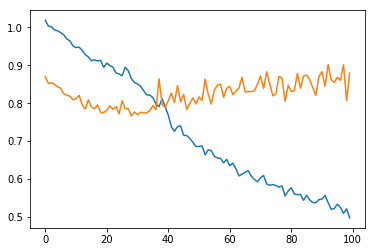

**********************Test**********************


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,Stellar Radius,Stellar Mass,Global
MAE,25.982534,0.081358,25.737930,1.994644,162.543921,280.317278,0.009392,21.228916,0.076171,0.048213,1.548063,451.475978,0.300554,0.150925,69.392563
MApE,293.155967,58.781495,2151.077416,2.402463,267.739767,41.940076,42.254795,119.786285,16.616834,30.241828,418.393301,9.074375,30.433016,18.585190,250.034486
MSE,2448.298632,0.012864,1900.603268,11.219764,85257.386271,136073.597137,0.000363,1254.457444,0.009999,0.004447,10.077265,382364.566887,0.264755,0.042249,43522.895810
MeAE,11.809188,0.057731,17.418723,1.272162,83.496353,222.097046,0.006739,11.180433,0.056802,0.032574,0.835159,324.450684,0.203957,0.118577,48.074009
RMSLE,1.251927,0.090092,1.552561,0.041746,1.371071,0.454234,0.017111,0.922984,0.068141,0.054970,0.616759,0.130688,0.189599,0.103711,0.490400


{'MAE': [25.98253397666755,
  0.0813575085129919,
  25.737929603594054,
  1.994643952322478,
  162.54392103818384,
  280.3172778441174,
  0.00939204587393468,
  21.228916426718115,
  0.0761705233942164,
  0.04821302047200722,
  1.5480625119655074,
  451.47597813370203,
  0.30055378211559636,
  0.1509247939133408,
  69.39256251153951],
 'MApE': [293.15596670931154,
  58.78149458659458,
  2151.0774159998923,
  2.402462880988785,
  267.7397671279847,
  41.940076303956616,
  42.254795029872454,
  119.78628464863668,
  16.61683359499809,
  30.241828463331277,
  418.39330079129223,
  9.074374952152239,
  30.433015845418694,
  18.585190259676406,
  250.03448622815054],
 'MSE': [2448.298631637402,
  0.012863830583923,
  1900.6032681063712,
  11.219763610803412,
  85257.38627051655,
  136073.59713714107,
  0.0003631150833661747,
  1254.4574442719427,
  0.009999182082705147,
  0.004447323616745956,
  10.077264969579081,
  382364.5668873049,
  0.2647546027566582,
  0.042249321504386456,
  43522.8

In [62]:
model_cnn = build_cnn_model(X_train.shape[1:], Y_train.shape[1], 32, L=3, 
                        kernel_s =5, pool=3, BN=False, drop=0.2,padding='valid',dil_r=1 )
model_cnn.compile(loss='mse', optimizer='adam')
model_cnn.summary()

hist = train_model(model_cnn, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2)
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

Y_test_hat = model_cnn.predict(X_test)
##evaluate with mse between metadata (and the values before)..
print("**********************Test**********************")
evaluate_metadata_raw(Y_test, scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         (None, 2015, 256)         0         
_________________________________________________________________
conv1d_19 (Conv1D)           (None, 2011, 32)          40992     
_________________________________________________________________
conv1d_20 (Conv1D)           (None, 2007, 32)          5152      
_________________________________________________________________
k_max_pooling_4 (KMaxPooling (None, 1344, 32)          0         
_________________________________________________________________
conv1d_21 (Conv1D)           (None, 1340, 64)          10304     
_________________________________________________________________
conv1d_22 (Conv1D)           (None, 1336, 64)          20544     
_________________________________________________________________
k_max_pooling_5 (KMaxPooling (None, 672, 64)           0         
__________

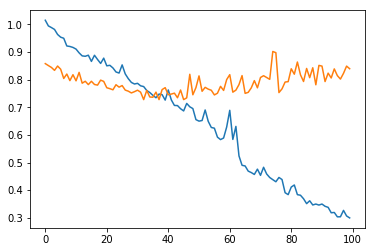

**********************Test**********************


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,Stellar Radius,Stellar Mass,Global
MAE,24.623077,0.076889,26.094937,2.191646,184.849347,302.592480,0.009610,20.455440,0.077909,0.050522,1.650045,475.850547,0.279786,0.153831,74.211148
MApE,284.866408,49.662923,2285.587027,2.630418,281.547656,43.971213,41.382371,116.445766,17.536438,29.750343,370.391096,9.427131,30.648199,18.627497,255.891035
MSE,2344.834425,0.012505,1942.779312,13.874466,101414.201929,161074.347883,0.000565,1215.395977,0.010442,0.004868,9.960841,429003.633864,0.190469,0.043119,49787.092190
MeAE,9.741762,0.051368,16.939839,1.462811,95.937342,228.913635,0.005840,10.518574,0.057749,0.033656,0.996312,325.830078,0.189031,0.116797,49.342485
RMSLE,1.353419,0.088384,1.572452,0.046523,1.549670,0.556927,0.020460,1.011814,0.069801,0.057333,0.642477,0.134705,0.184287,0.111646,0.528564


{'MAE': [24.62307722270568,
  0.07688882045004154,
  26.09493662933497,
  2.191646044740582,
  184.84934714654884,
  302.5924797435798,
  0.009610386478082083,
  20.455439782094956,
  0.07790948611250019,
  0.05052213218625229,
  1.6500446988549202,
  475.8505472617574,
  0.27978557829479184,
  0.15383145592590372,
  74.21114759921893],
 'MApE': [284.86640823459356,
  49.66292287921643,
  2285.5870272617194,
  2.63041814258053,
  281.5476563443721,
  43.97121260174992,
  41.3823712773295,
  116.44576580210095,
  17.536438462168626,
  29.75034296552515,
  370.39109587640354,
  9.427131066505554,
  30.64819868738085,
  18.627496686417288,
  255.89103473486165],
 'MSE': [2344.834425080819,
  0.012505483255090523,
  1942.7793116396101,
  13.874465953039389,
  101414.2019294504,
  161074.3478833679,
  0.0005646879338024582,
  1215.395976685758,
  0.01044216503042178,
  0.00486778715216311,
  9.960840625546323,
  429003.6338642869,
  0.19046932427790467,
  0.04311881113868725,
  49787.092190

In [63]:
#version 1
model_kpool = build_kpool_model(X_train.shape[1:], Y_train.shape[1], 32, L=3,
                        kernel_s =5, K_top=80, BN = False, drop=0., padding='valid') #menos k??
model_kpool.compile(loss='mse', optimizer='adam')
model_kpool.summary()

hist = train_model(model_kpool, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2)
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

Y_test_hat = model_kpool.predict(X_test)
print("**********************Test**********************")
evaluate_metadata_raw(Y_test, scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used)

### T = 32 (simple modelo)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 2015, 160)         0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 2011, 32)          25632     
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 2007, 32)          5152      
_________________________________________________________________
dropout_1 (Dropout)          (None, 2007, 32)          0         
_________________________________________________________________
average_pooling1d_1 (Average (None, 669, 32)           0         
_________________________________________________________________
conv1d_3 (Conv1D)            (None, 665, 64)           10304     
_________________________________________________________________
conv1d_4 (Conv1D)            (None, 661, 64)           20544     
__________

2841/2841 [==============================] - 19s 7ms/step - loss: 0.6724 - val_loss: 0.7767
Epoch 55/100
2841/2841 [==============================] - 19s 7ms/step - loss: 0.6937 - val_loss: 0.8107
Epoch 56/100
2841/2841 [==============================] - 19s 7ms/step - loss: 0.6853 - val_loss: 0.7927
Epoch 57/100
2841/2841 [==============================] - 20s 7ms/step - loss: 0.6731 - val_loss: 0.7761
Epoch 58/100
2841/2841 [==============================] - 19s 7ms/step - loss: 0.7078 - val_loss: 0.7703
Epoch 59/100
2841/2841 [==============================] - 19s 7ms/step - loss: 0.6613 - val_loss: 0.7910
Epoch 60/100
2841/2841 [==============================] - 20s 7ms/step - loss: 0.6580 - val_loss: 0.7879
Epoch 61/100
2841/2841 [==============================] - 19s 7ms/step - loss: 0.6488 - val_loss: 0.7938
Epoch 62/100
2841/2841 [==============================] - 20s 7ms/step - loss: 0.6447 - val_loss: 0.7756
Epoch 63/100
2841/2841 [==============================] - 20s 7ms/st

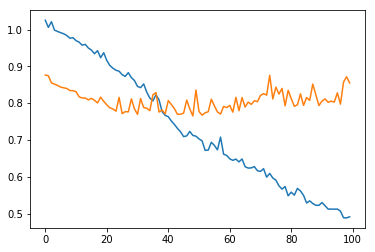

**********************Test**********************


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,Stellar Radius,Stellar Mass,Global
MAE,23.534463,0.076952,25.727838,2.288216,217.898673,309.964546,0.009636,20.317424,0.073892,0.047048,1.901845,464.932945,0.280731,0.151182,76.228957
MApE,215.741129,50.129814,1890.221543,2.716929,410.145748,47.296608,41.830182,108.489387,17.011510,27.812836,552.218393,9.087012,26.480008,18.234619,244.101123
MSE,2135.121809,0.012944,1923.471686,13.255143,148373.150816,166299.713388,0.000390,1170.672419,0.008822,0.003909,12.883796,414790.124300,0.236974,0.042268,52479.907047
MeAE,10.199512,0.050514,17.691638,1.496178,120.710327,251.833862,0.006541,11.734593,0.059657,0.034880,1.199974,346.232422,0.174143,0.110367,54.395329
RMSLE,1.211475,0.088682,1.550339,0.044831,1.416772,0.486346,0.017681,0.919170,0.064057,0.051500,0.671823,0.378537,0.180110,0.103360,0.513192


{'MAE': [23.534463480058466,
  0.076951900370959,
  25.72783846512245,
  2.288216439728689,
  217.89867323696024,
  309.96454594678215,
  0.009635872689007534,
  20.317424499219005,
  0.07389221814268887,
  0.04704750122622688,
  1.90184458924994,
  464.9329449644183,
  0.2807307039473317,
  0.15118211600473613,
  76.22895656670856],
 'MApE': [215.74112867591873,
  50.12981380055657,
  1890.2215427312267,
  2.7169293098848937,
  410.14574838437363,
  47.29660832353698,
  41.83018164182446,
  108.48938683919332,
  17.01150953013222,
  27.81283625612907,
  552.2183925962568,
  9.08701170362618,
  26.480007743019918,
  18.234618871518073,
  244.10112260051415],
 'MSE': [2135.121808576813,
  0.012943639845411194,
  1923.471686267237,
  13.255142865604475,
  148373.15081553967,
  166299.71338843106,
  0.0003896542570331853,
  1170.6724189850713,
  0.008822432994714332,
  0.00390946366129448,
  12.883796392344859,
  414790.1242996813,
  0.2369739239871921,
  0.04226774520601142,
  52479.9070

In [56]:
model_cnn = build_cnn_model(X_train.shape[1:], Y_train.shape[1], 32, L=3, 
                        kernel_s =5, pool=3, BN=False, drop=0.2,padding='valid',dil_r=1 )
model_cnn.compile(loss='mse', optimizer='adam')
model_cnn.summary()

hist = train_model(model_cnn, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2)
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

Y_test_hat = model_cnn.predict(X_test)
##evaluate with mse between metadata (and the values before)..
print("**********************Test**********************")
evaluate_metadata_raw(Y_test, scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 2015, 160)         0         
_________________________________________________________________
conv1d_7 (Conv1D)            (None, 2011, 32)          25632     
_________________________________________________________________
conv1d_8 (Conv1D)            (None, 2007, 32)          5152      
_________________________________________________________________
k_max_pooling_1 (KMaxPooling (None, 1344, 32)          0         
_________________________________________________________________
conv1d_9 (Conv1D)            (None, 1340, 64)          10304     
_________________________________________________________________
conv1d_10 (Conv1D)           (None, 1336, 64)          20544     
_________________________________________________________________
k_max_pooling_2 (KMaxPooling (None, 672, 64)           0         
__________

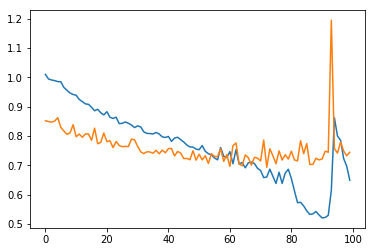

**********************Test**********************


,Period,Duration,Time of Transit Epoch,Inclination,Transit Number,Teq,r/R,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Fitted Stellar Density,Teff,Stellar Radius,Stellar Mass,Global
MAE,25.715311,0.072748,24.869397,2.043568,166.372796,269.442506,0.009861,21.246887,0.071970,0.046830,1.795697,423.128106,0.241280,0.136285,66.799517
MApE,288.985239,45.712272,1172.771133,2.448406,364.816299,40.178311,42.392965,121.714866,17.060723,26.849665,543.722567,8.141855,23.447893,15.862616,193.864629
MSE,2328.594332,0.011602,1906.797103,11.730314,77311.967519,123811.962215,0.000604,1169.962873,0.007925,0.003668,13.583951,305313.978785,0.154187,0.031709,36562.056199
MeAE,12.999202,0.049079,15.553454,1.412790,109.840195,220.967224,0.006396,13.258132,0.062961,0.038350,1.225556,346.900391,0.174630,0.112456,51.614344
RMSLE,1.328553,0.085001,1.559824,0.042923,1.377957,0.443064,0.020865,0.908816,0.060968,0.049849,0.661318,0.109161,0.157082,0.092814,0.492728


{'MAE': [25.715310636312463,
  0.07274798791589596,
  24.86939729823916,
  2.0435675432564,
  166.37279593200967,
  269.44250597056777,
  0.009861096915956772,
  21.246886641137433,
  0.07196997481006208,
  0.046829809533251394,
  1.7956974318973427,
  423.1281056621287,
  0.24128026376148262,
  0.13628477797319394,
  66.79951721617563],
 'MApE': [288.98523894711684,
  45.71227198744267,
  1172.7711333393672,
  2.448405501814157,
  364.81629899644645,
  40.178310643689926,
  42.392964652350884,
  121.7148658170659,
  17.060722611656498,
  26.84966524517006,
  543.7225673030058,
  8.141854534886534,
  23.44789314016648,
  15.862615610375375,
  193.86462916646818],
 'MSE': [2328.594332163913,
  0.011601907808126782,
  1906.7971030161368,
  11.730313571619687,
  77311.9675190012,
  123811.96221511098,
  0.000603810064015615,
  1169.9628725700227,
  0.007924556572224323,
  0.0036675991334315585,
  13.583950806556006,
  305313.97878484346,
  0.15418670504042326,
  0.03170890842314337,
  365

In [57]:
#version 1
model_kpool = build_kpool_model(X_train.shape[1:], Y_train.shape[1], 32, L=3,
                        kernel_s =5, K_top=80, BN = False, drop=0., padding='valid') #menos k??
model_kpool.compile(loss='mse', optimizer='adam')
model_kpool.summary()

hist = train_model(model_kpool, X_train, Ystd_train, epochs=100, batch_size=64, val_split=0.2)
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.show()

Y_test_hat = model_kpool.predict(X_test)
print("**********************Test**********************")
evaluate_metadata_raw(Y_test, scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used)

In [21]:
%%time
Y_train_hat = model_simple.predict(X_train, batch_size=1024)
Y_test_hat = model_simple.predict(X_test, batch_size=1024)

CPU times: user 6.57 s, sys: 2.03 s, total: 8.6 s
Wall time: 3.3 s


In [33]:
%%time
model = model_kpool
Y_train_hat = model.predict(X_train, batch_size=1024)
Y_test_hat = model.predict(X_test, batch_size=1024)

CPU times: user 1min 5s, sys: 14.2 s, total: 1min 19s
Wall time: 8.19 s


## Evaluate

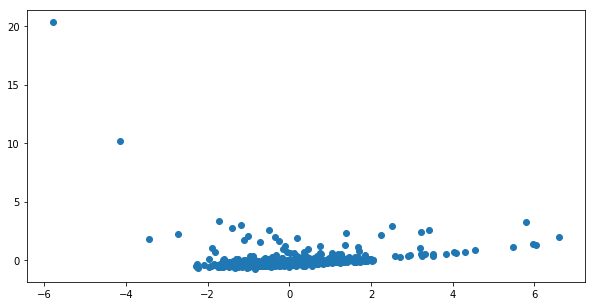

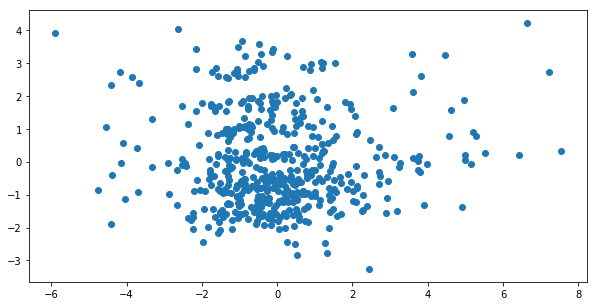

In [42]:
from sklearn.decomposition import PCA
aux_model = PCA(2)
plot_enc = aux_model.fit_transform(Y_test_hat)

plt.figure(figsize=(10,5))
plt.scatter(plot_enc[:,0],plot_enc[:,1])
plt.show()

aux_model = PCA(2)
plot_enc = aux_model.fit_transform(Ystd_test)

plt.figure(figsize=(10,5))
plt.scatter(plot_enc[:,0],plot_enc[:,1])
plt.show()

In [22]:
from IPython.display import display, HTML
from evaluation import evaluate_metadata, evaluate_metadata_raw

def plot_n_meta(real, pred, n= 10, plot_real = True):
    if plot_real:
        pred = scaler_meta.inverse_transform(pred)
    for _ in range(n):
        n_sampled = np.random.randint(0,real.shape[0])
        aux = pd.DataFrame()
        aux["Real"] = real[n_sampled]
        aux["Predicted"] = pred[n_sampled]
        aux.index=metadata_used
        display(aux.transpose())
        print("----------------------------------------------------------------")

    
### deprecated
def evaluate_meta(real, pred, scaler_meta, plot=True):
    res_metadata = {}
    inv_real = scaler_meta.inverse_transform(real)
    inv_pred = scaler_meta.inverse_transform(pred)
    
    res = evaluate_metadata(real,pred)
    res_true = evaluate_metadata(inv_real,inv_pred)
    
    res_metadata = {key: [value, res[key]] for key,value in res_true.items() }    
    if plot:
        df = pd.DataFrame(res_metadata)
        df.index = ["Real","Scaled"]
        print(df)
    return res_metadata

In [35]:
###  plot some examples..
print("Train")
plot_n_meta(Y_train, Y_train_hat)
print("Test")
plot_n_meta(Y_test, Y_test_hat)

Train


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
Real,35.968269,2.83900,138.66885,88.97000,0.227000,0.018000,674.000000,40.000000,0.367000,0.286000
Predicted,32.837322,4.72735,156.17514,87.61293,0.164976,0.016041,835.386597,188.780365,0.407819,0.255353


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
Real,1.646802,1.196600,132.061500,89.300000,0.022000,0.015000,806.000000,807.000000,0.316000,0.387000
Predicted,18.373137,2.159765,137.171021,85.320435,0.061263,0.017204,1116.647705,699.628479,0.516683,0.196814


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
Real,14.887767,4.981000,141.95432,86.850000,0.119000,0.01600,831.00000,91.000000,0.315000,0.303000
Predicted,38.168129,5.400047,150.74527,88.219292,0.190438,0.01334,780.83252,121.623024,0.402252,0.261673


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
Real,25.762685,6.908000,147.696300,89.320000,0.171000,0.023000,633.00000,47.00000,0.410000,0.260000
Predicted,66.930138,6.885375,179.079971,89.091835,0.281068,0.025438,607.36731,47.25045,0.400495,0.263634


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
Real,1.118548,1.553400,132.848260,87.680000,0.019000,0.01400,1174.000000,1192.000000,0.685000,0.066000
Predicted,19.149321,4.120082,139.248062,86.940559,0.113646,0.01367,963.416992,328.233307,0.415272,0.256143


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
Real,8.506981,2.938000,134.644210,86.530000,0.08000,0.018000,900.000000,160.00000,0.393000,0.268000
Predicted,23.100954,4.131449,143.688126,87.590782,0.12312,0.014855,888.516846,234.33136,0.404807,0.258538


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
Real,34.211502,4.947000,154.575080,89.960000,0.189000,0.015000,427.000000,39.000000,0.557000,0.16100
Predicted,60.729019,4.713846,165.412384,88.438232,0.255712,0.020464,599.412781,143.990051,0.490832,0.20687


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
Real,0.693843,1.619700,132.181570,86.590000,0.015000,0.006000,2161.000000,1930.000000,0.455000,0.233000
Predicted,-13.999569,1.414462,132.474777,83.930351,0.002583,0.013212,1408.998413,1060.396362,0.496514,0.203435


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
Real,20.264202,4.664000,135.279190,86.420000,0.149000,0.015000,770.000000,51.000000,0.366000,0.284000
Predicted,45.664730,5.890095,172.176743,88.855209,0.219155,0.022689,674.379211,74.135597,0.396745,0.265082


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
Real,36.292017,8.19800,132.176910,90.000000,0.223000,0.018000,694.000000,36.000000,0.405000,0.264000
Predicted,15.388481,3.97101,144.371063,85.924698,0.104504,0.016489,1074.228271,469.598633,0.429813,0.247873


----------------------------------------------------------------
Test


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
Real,13.722368,5.123100,137.84083,89.980000,0.105000,0.022000,746.000000,97.000000,0.37300,0.279000
Predicted,8.599157,5.093306,164.02800,89.032402,0.107747,0.029436,702.213806,141.968903,0.39482,0.280912


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
Real,1.855558,2.356720,137.181028,84.470000,0.029000,0.097000,1436.000000,725.000000,0.393000,0.268000
Predicted,13.342141,2.507035,151.040009,89.250885,0.045111,0.050715,1417.306152,586.108887,0.398918,0.245121


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
Real,11.008176,2.013000,143.226110,89.970000,0.0820,0.034000,488.00000,125.000000,0.644000,0.101000
Predicted,14.440279,2.253772,148.765884,86.746582,0.0801,0.018697,927.16156,497.826233,0.482159,0.219235


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
Real,44.964075,4.981000,144.56002,89.910000,0.2300,0.025000,379.000000,30.000000,0.632000,0.105000
Predicted,50.978561,4.764045,173.82724,90.089989,0.2548,0.041799,545.421265,108.599762,0.412916,0.261538


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
Real,10.712535,2.718600,137.164990,88.160000,0.078000,0.034000,485.000000,105.000000,0.574000,0.150000
Predicted,17.078119,3.737796,147.480118,87.216583,0.104427,0.018169,950.515808,244.080963,0.422406,0.247769


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
Real,6.098556,2.981500,135.929060,89.220000,0.063000,0.008000,927.000000,196.000000,0.453000,0.233000
Predicted,12.949014,3.030324,158.476089,88.774986,0.098479,0.024134,672.663574,113.753166,0.476994,0.225329


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
Real,2.553150,1.84900,132.448490,88.190000,0.037000,0.013000,1312.000000,448.00000,0.345000,0.292000
Predicted,67.403053,6.74118,177.730606,89.123703,0.277282,0.024538,625.071472,57.38456,0.397075,0.265404


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
Real,5.700706,1.640800,132.69229,88.15000,0.064000,0.019000,1035.000000,221.00000,0.366000,0.284000
Predicted,24.271538,4.777128,148.87764,88.16011,0.146759,0.017119,862.380859,152.46492,0.396859,0.261537


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
Real,19.986592,4.391000,135.522650,85.750000,0.140000,0.031000,720.000000,68.000000,0.455000,0.233000
Predicted,17.276369,3.830859,140.285553,87.250336,0.106409,0.014524,944.383179,303.552277,0.416118,0.253695


----------------------------------------------------------------


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2
Real,43.034336,6.571000,137.690070,88.070000,0.233000,0.025000,484.000000,27.000000,0.453000,0.233000
Predicted,45.768337,5.363133,176.420486,89.455696,0.221241,0.028321,543.612549,30.319876,0.441317,0.234996


----------------------------------------------------------------


#### evaluate by column


In [23]:
print("**********************Train**********************")
evaluate_metadata_raw(scaler_meta.inverse_transform(Ystd_train), scaler_meta.inverse_transform(Y_train_hat),
                     metadata_used=metadata_used)
print("**********************Test**********************")
evaluate_metadata_raw(scaler_meta.inverse_transform(Ystd_test), scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used) #simple

**********************Train**********************


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2,Global
MAE,24.962333,1.757245,24.477475,1.967178,0.089477,0.009467,288.384425,167.007103,0.080461,0.051917,50.878708
MApE,352.003952,52.040690,13.904120,2.409277,114.188987,48.246836,42.782755,331.605804,19.449320,29.213462,100.584520
MSE,2775.905133,6.950051,1735.333223,12.035770,0.021912,0.000265,144623.122612,83944.540924,0.009586,0.004406,23309.792388
MeAE,17.383145,1.338850,18.910277,1.598384,0.064892,0.006922,236.328033,121.643578,0.074480,0.045977,39.739454
RMSLE,1.257925,0.424071,0.195343,0.045165,0.109671,0.014913,0.459701,1.322100,0.067360,0.054282,0.395053


**********************Test**********************


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2,Global
MAE,24.575240,1.843374,25.354540,1.983744,0.089887,0.009955,262.746661,161.179408,0.079481,0.050842,47.791313
MApE,339.682799,53.045987,14.433631,2.396241,112.213800,47.365156,39.668716,322.162357,18.697662,30.004794,97.967114
MSE,1879.285816,6.928522,1710.455258,10.939832,0.018793,0.000483,117814.507963,78222.109861,0.009367,0.004169,19964.426006
MeAE,17.777108,1.387015,19.513426,1.607633,0.069765,0.006999,223.571167,116.893280,0.074895,0.044952,38.094624
RMSLE,1.255863,0.444779,0.197794,0.041501,0.106375,0.019542,0.433691,1.310417,0.066178,0.053232,0.392937


{'MAE': [24.575239843396414,
  1.843373827219957,
  25.35453984197285,
  1.9837436033947629,
  0.08988650480197502,
  0.009954606018857198,
  262.7466611956606,
  161.1794084605604,
  0.0794805030298705,
  0.05084173560166123,
  47.79131301216573],
 'MApE': [339.6827989669769,
  53.04598673454461,
  14.433631407124462,
  2.396240798366084,
  112.2137997815652,
  47.36515642261941,
  39.66871584867032,
  322.16235680610816,
  18.69766248015925,
  30.0047939913506,
  97.9671143237485],
 'MSE': [1879.285815794876,
  6.928521508520139,
  1710.45525801533,
  10.939832003098807,
  0.018792763062563646,
  0.00048262343706829963,
  117814.50796286539,
  78222.10986114114,
  0.009367458705435408,
  0.004169346074253799,
  19964.42600635196],
 'MeAE': [17.77710774953125,
  1.387015328979492,
  19.513425708007816,
  1.6076330566406227,
  0.06976527881622314,
  0.006998895004391669,
  223.5711669921875,
  116.89328002929688,
  0.07489500474929811,
  0.044951915383338925,
  38.094623995859685],
 'R

In [28]:
print("**********************Train**********************")
evaluate_metadata_raw(scaler_meta.inverse_transform(Ystd_train), scaler_meta.inverse_transform(Y_train_hat),
                     metadata_used=metadata_used)
print("**********************Test**********************")
evaluate_metadata_raw(scaler_meta.inverse_transform(Ystd_test), scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used) #cnn

**********************Train**********************


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2,Global
MAE,13.068994,1.212200,19.243824,1.832825,0.049725,0.007030,203.109426,135.497588,0.074105,0.048855,37.414457
MApE,140.212151,31.375801,11.039661,2.227890,55.036873,37.654023,29.532940,213.019597,18.416837,25.938311,56.445408
MSE,869.116905,3.783902,1181.248343,9.881922,0.007677,0.000124,77553.931127,53526.854910,0.008236,0.003964,13314.483711
MeAE,6.093614,0.774234,13.238217,1.221547,0.029153,0.005346,156.012238,84.034580,0.065804,0.041294,26.151603
RMSLE,0.813732,0.308114,0.161451,0.041087,0.066810,0.010412,0.373354,1.078957,0.062776,0.051182,0.296787


**********************Test**********************


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2,Global
MAE,21.070577,1.638998,23.311137,2.055609,0.077559,0.009228,256.838161,168.165564,0.075672,0.049400,47.329190
MApE,243.055520,40.901853,13.067943,2.476073,83.779080,42.512291,38.794038,344.960207,18.191565,27.649706,85.538828
MSE,2003.114992,6.898591,1737.039381,11.527436,0.018906,0.000482,119403.028709,79740.023604,0.008355,0.003828,20290.166428
MeAE,7.516153,0.914965,15.011577,1.382113,0.039827,0.006425,191.434509,100.158020,0.069524,0.043318,31.657643
RMSLE,1.164805,0.416212,0.199658,0.042466,0.106503,0.019411,0.427697,1.294304,0.062725,0.050809,0.378459


{'MAE': [21.070577308504337,
  1.638997517443213,
  23.311136658821933,
  2.055608823870668,
  0.07755918537713219,
  0.009227709283657593,
  256.83816075088953,
  168.16556362869716,
  0.07567230697150278,
  0.04939987708129505,
  47.329190376694044],
 'MApE': [243.05552040752062,
  40.90185318425973,
  13.067942547652686,
  2.4760730261506994,
  83.7790804812369,
  42.51229132118427,
  38.794037772412274,
  344.9602071722344,
  18.191564874256063,
  27.649706083077184,
  85.53882768699847],
 'MSE': [2003.1149918695908,
  6.8985913880264,
  1737.0393805426763,
  11.527436437569392,
  0.018906337583509823,
  0.00048166721535145414,
  119403.02870902183,
  79740.02360429226,
  0.00835486854236408,
  0.0038282873480070395,
  20290.166428471268],
 'MeAE': [7.516152948339844,
  0.9149646949768067,
  15.01157687011721,
  1.3821127319335886,
  0.03982695966958999,
  0.006425477445125578,
  191.43450927734375,
  100.15802001953124,
  0.06952363228797914,
  0.043318410873413093,
  31.657643102

In [31]:
print("**********************Train**********************")
evaluate_metadata_raw(scaler_meta.inverse_transform(Ystd_train), scaler_meta.inverse_transform(Y_train_hat),
                     metadata_used=metadata_used)
print("**********************Test**********************")
evaluate_metadata_raw(scaler_meta.inverse_transform(Ystd_test), scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used) #kmaxpool

**********************Train**********************


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2,Global
MAE,19.005626,1.419307,21.097286,1.858076,0.068687,0.007398,240.106247,150.395949,0.072260,0.047198,43.407803
MApE,204.895244,38.086330,11.838734,2.269451,74.055834,39.619943,35.197179,274.575694,17.516662,26.321990,72.437706
MSE,2324.906476,5.430307,1517.342630,10.766392,0.016911,0.000135,108906.877983,68342.148764,0.008179,0.003893,18110.750167
MeAE,9.248928,0.853616,14.696285,1.352444,0.038707,0.005819,182.151367,93.472351,0.061407,0.037245,30.191817
RMSLE,1.043147,0.361896,0.179766,0.042815,0.094110,0.010905,0.398201,1.214094,0.062239,0.050957,0.345813


**********************Test**********************


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2,Global
MAE,19.980560,1.552461,23.789185,2.010539,0.075116,0.009759,249.548491,156.180607,0.074394,0.047913,45.326902
MApE,249.772180,41.297813,13.339335,2.422597,87.654631,44.216235,36.868365,309.791877,17.370466,28.204190,83.093769
MSE,1748.464852,5.987551,1778.492836,11.953485,0.016924,0.000588,120047.993356,77446.621974,0.008546,0.003851,20103.954396
MeAE,10.054932,0.918946,16.631180,1.446089,0.042732,0.006460,191.934082,88.823853,0.064416,0.038514,30.996120
RMSLE,1.122965,0.401895,0.198067,0.043608,0.099657,0.021181,0.415911,1.257112,0.063158,0.051173,0.367473


{'MAE': [19.980560123530065,
  1.5524612536862628,
  23.789184819798113,
  2.010538650663772,
  0.0751159104293028,
  0.009758506138047369,
  249.5484906187152,
  156.18060746502758,
  0.07439432253554316,
  0.04791281163149542,
  45.326902448215534],
 'MApE': [249.77218033051156,
  41.29781278561232,
  13.339334681947266,
  2.4225972780943015,
  87.65463054216086,
  44.21623531811225,
  36.86836502595062,
  309.79187668960446,
  17.370466015313706,
  28.204190039818677,
  83.0937688707126],
 'MSE': [1748.464851735621,
  5.987550896352244,
  1778.4928357105389,
  11.953485295397904,
  0.016924280645377245,
  0.0005882228872286184,
  120047.99335603317,
  77446.6219735464,
  0.008545688347867163,
  0.0038507776627324797,
  20103.954396218705],
 'MeAE': [10.054931698022461,
  0.9189458007812501,
  16.63118013183592,
  1.4460888671874983,
  0.04273154914379121,
  0.006459864690899847,
  191.93408203125,
  88.8238525390625,
  0.06441573333740236,
  0.03851419234275816,
  30.996120240765446

In [34]:
print("**********************Train**********************")
evaluate_metadata_raw(scaler_meta.inverse_transform(Ystd_train), scaler_meta.inverse_transform(Y_train_hat),
                     metadata_used=metadata_used)
print("**********************Test**********************")
evaluate_metadata_raw(scaler_meta.inverse_transform(Ystd_test), scaler_meta.inverse_transform(Y_test_hat),
                     metadata_used=metadata_used) #kmaxpool -V2

**********************Train**********************


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2,Global
MAE,20.920315,1.337555,22.080556,1.813828,0.070604,0.007288,240.240664,139.237661,0.071877,0.046874,42.582722
MApE,252.198378,39.054129,12.790852,2.214849,85.077601,38.995059,33.111068,207.203669,17.197152,26.536558,71.437931
MSE,1991.569034,4.374810,1465.887344,10.452993,0.013833,0.000128,107564.227012,61952.538505,0.008159,0.003891,17298.907571
MeAE,11.589850,0.859648,14.842190,1.181031,0.043928,0.005765,180.933380,76.174042,0.060028,0.036555,28.572642
RMSLE,1.084911,0.338300,0.180456,0.042135,0.087457,0.010622,0.436457,1.236933,0.062046,0.051025,0.353034


**********************Test**********************


,Period,Duration,Time of Transit Epoch,Inclination,Semi-major Axis,r/R,Teq,Transit Number,Limb Darkening Coeff1,Limb Darkening Coeff2,Global
MAE,26.656466,1.730587,25.164723,2.085489,0.090368,0.009608,258.165298,168.141293,0.073573,0.047623,48.216503
MApE,359.209091,47.693456,14.507317,2.514649,109.640070,43.670154,38.339515,342.403424,17.059601,28.336380,100.337366
MSE,2421.734738,7.255215,1826.075727,11.918164,0.022503,0.000480,123675.342751,90768.075350,0.008436,0.003883,21871.043725
MeAE,12.555651,0.969312,16.479471,1.409066,0.046686,0.006387,202.738098,86.963417,0.062567,0.036616,32.126727
RMSLE,1.313562,0.424900,0.209361,0.043071,0.115992,0.019430,0.445732,1.526287,0.062686,0.051420,0.421244


{'MAE': [26.65646613301059,
  1.7305869370508478,
  25.16472344051671,
  2.0854888021639075,
  0.09036848741840608,
  0.00960754139190263,
  258.1652976460976,
  168.14129264378312,
  0.073572562769616,
  0.047622589586040764,
  48.21650267837887],
 'MApE': [359.2090907225054,
  47.69345567022337,
  14.507317225732319,
  2.514648566307226,
  109.64007000648586,
  43.67015362394192,
  38.33951530889823,
  342.4034243636621,
  17.059600862619007,
  28.336379657869955,
  100.33736560082454],
 'MSE': [2421.734738364122,
  7.255215358148769,
  1826.0757273483853,
  11.918163729026563,
  0.02250270549327637,
  0.0004800693280282515,
  123675.34275123903,
  90768.07535017513,
  0.008435986111195415,
  0.003883350782969836,
  21871.043724832558],
 'MeAE': [12.555650753281249,
  0.9693124160766606,
  16.47947077636718,
  1.4090655517578057,
  0.04668580579757692,
  0.006387171894311906,
  202.73809814453125,
  86.96341705322266,
  0.0625670990943909,
  0.03661644411087034,
  32.1267271216134],


### acc obtain with new encoder rep..

In [36]:
Y_aux_train = scaler_meta.transform(df_meta_obj.values[mask_train])
Y_aux_test  = scaler_meta.transform(df_meta_obj.values[mask_test])

#labels
exop_train = 1*(all_labels=="CONFIRMED")[mask_train].values
exop_test = 1*(all_labels=="CONFIRMED")[mask_test].values

print("Metadata train shape: ",Y_aux_train.shape)
print("Metadata test shape: ", Y_aux_test.shape)
print("Exo-Label train shape: ",exop_train.shape)
print("Exo-Label test shape: ",exop_test.shape)

Metadata train shape:  (4692, 10)
Metadata test shape:  (1565, 10)
Exo-Label train shape:  (4692,)
Exo-Label test shape:  (1565,)


In [37]:
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, cross_validate
from sklearn.metrics import make_scorer, f1_score, recall_score, accuracy_score, precision_score
scorers = {
    'f1_score_we':make_scorer(f1_score,average='weighted'),
    'f1_score_macro':make_scorer(f1_score,average='macro'),
    'f1_score_micro':make_scorer(f1_score,average='micro')
}

from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier(n_jobs=-1, random_state=0)
param_grid = {
    'n_estimators' : [10,20,30,40,50,60,70,80,90,100],
    'min_samples_split': [2,5,10,15,20,25],
    #'max_depth': np.arange(5,25),
    'class_weight' : ['balanced','balanced_subsample',None]
}

skf = StratifiedKFold(n_splits=5)
grid_search = GridSearchCV(clf, param_grid, scoring=scorers, refit='f1_score_we',
                       cv=skf, return_train_score=False, n_jobs=-1)
grid_search.fit(Y_aux_train, exop_train)

print('Best params for completeness:', grid_search.best_params_)
results = pd.DataFrame(grid_search.cv_results_)
bestResults = results[results.params == grid_search.best_params_]
f1_w = float(bestResults['mean_test_f1_score_we'])
print('F1-score weighted: {:.4f}'.format(f1_w))
f1_ma = float(bestResults['mean_test_f1_score_macro'])
print('F1-score macro: {:.4f}'.format(f1_ma))
f1_mi = float(bestResults['mean_test_f1_score_micro'])
print('F1-score micro: {:.4f}'.format(f1_mi))

/users/fmena/anaconda3/envs/tesis/lib/python3.5/site-packages/sklearn/ensemble/weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.
  from numpy.core.umath_tests import inner1d


Best params for completeness: {'min_samples_split': 5, 'n_estimators': 80, 'class_weight': 'balanced_subsample'}
F1-score weighted: 0.9019
F1-score macro: 0.8965
F1-score micro: 0.9013


#### Baseline model (real metadata)

Train


,F1 macro,F1 micro,F1 raw,F1 weighted,Precision raw,Recall raw
False Positive,0.995024,0.995311,0.996220,0.995314,0.998278,0.994170
Confirmed,0.995024,0.995311,0.993827,0.995314,0.990492,0.997185


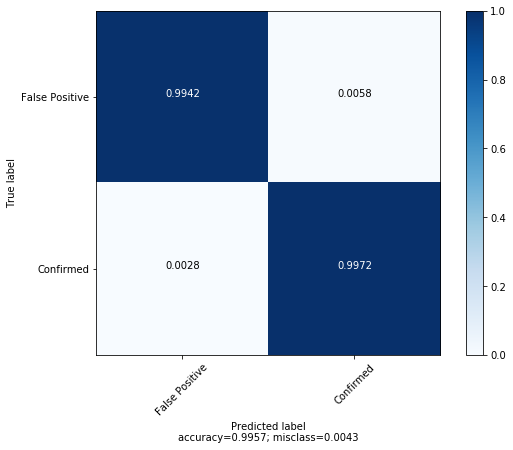

Test


,F1 macro,F1 micro,F1 raw,F1 weighted,Precision raw,Recall raw
False Positive,0.851957,0.86262,0.891688,0.866047,0.956757,0.834906
Confirmed,0.851957,0.86262,0.812227,0.866047,0.726562,0.920792


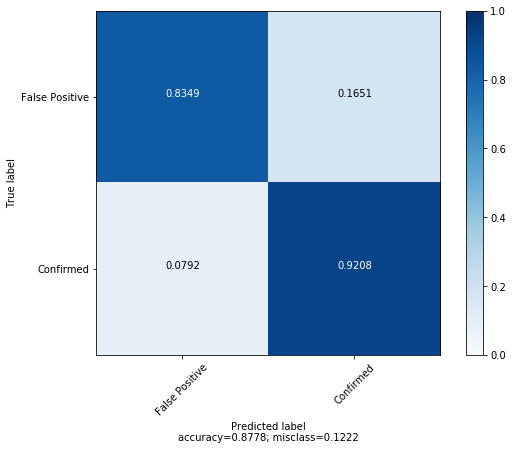

In [38]:
ens_model = RandomForestClassifier(n_jobs=-1, random_state=0, **grid_search.best_params_) 
ens_model.fit(Y_aux_train, exop_train) 

exop_train_pred = ens_model.predict(Y_aux_train)
exop_test_pred = ens_model.predict(Y_aux_test)

print("Train")
aux = calculate_metrics(exop_train, exop_train_pred)
print("Test")
aux = calculate_metrics(exop_test, exop_test_pred) 

#### with Encoder model

In [39]:
time_kepler = np.load(folder_lc+"npy/KOI_LC_time.npy")
process_lc = np.load(folder_lc+'/cleaned/LC_kepler_processed.npy')
N, T = time_kepler.shape
print((N,T))

for i in range(N):
    time_kepler[i], process_lc[i] = generate_representation(time_kepler[i], process_lc[i])

coupled_lc_scaled = []
delta_time = []
for i in range(N):
    mask_nan_aux = np.isnan(process_lc[i])
    lc_i = process_lc[i][~mask_nan_aux]
    time = time_kepler[i][~mask_nan_aux]
    
    std_i = lc_i.std(keepdims=True)
    coupled_lc_scaled.append(lc_i/std_i) #PRE-PROCESS SELECTED
    delta_time.append(np.hstack([[0],np.diff(time)]))    
coupled_lc_scaled = np.asarray(coupled_lc_scaled)
delta_time = np.asarray(delta_time)

max_len = 64482
X_time_aux = keras.preprocessing.sequence.pad_sequences(delta_time,maxlen=max_len, value=0,dtype='float32',padding='post')
X_lc_scaled_aux = keras.preprocessing.sequence.pad_sequences(coupled_lc_scaled,maxlen=max_len, value=0,dtype='float32',padding='post')
print("Shape with padding: ", X_lc_scaled.shape)

X_lc_scaled_aux = np.expand_dims(np.squeeze(X_lc_scaled_aux),axis=-1)
X_time_aux = np.expand_dims(np.squeeze(X_time_aux),axis=-1)

X_enc_aux  = encoder_model.predict(np.concatenate([X_lc_scaled_aux,X_time_aux],axis=2), batch_size=512)
X_aux_train = X_enc_aux[mask_train]
X_aux_test = X_enc_aux[mask_test]
print("Done!")

(8054, 71427)
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423941 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423941 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform samp

New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old le

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old le

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old le

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423942 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old le

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old le

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old le

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old le

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old le

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old le

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423943 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old le

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old le

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old le

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423944 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old le

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old le

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old le

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old le

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old le

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old le

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old le

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old le

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423945 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old le

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old le

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old le

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old le

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423946 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old le

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old le

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old le

New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************M

New sampling rate: 0.020433 (JD) --- 29.423947 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old le

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old le

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423948 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old le

***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is b

New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423949 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423950 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423951 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423952 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old le

New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old length: 71427
New length: 71427
Assuming uniform sampling
***************Mask values to get uniform sampling rate is being done..
New sampling rate: 0.020433 (JD) --- 29.423953 (mins)
Old le

In [44]:
Y_aux_train_hat = model.predict(X_aux_train, batch_size=1024)
Y_aux_test_hat = model.predict(X_aux_test, batch_size=1024)

Train


,F1 macro,F1 micro,F1 raw,F1 weighted,Precision raw,Recall raw
False Positive,0.996828,0.997016,0.997600,0.997016,0.997258,0.997942
Confirmed,0.996828,0.997016,0.996056,0.997016,0.996618,0.995495


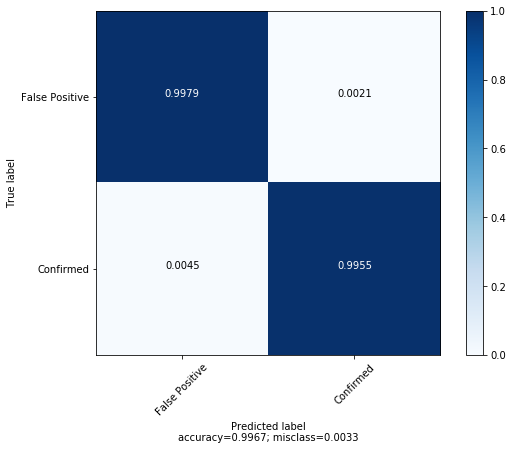

Test


,F1 macro,F1 micro,F1 raw,F1 weighted,Precision raw,Recall raw
False Positive,0.615112,0.640256,0.713486,0.649999,0.774586,0.661321
Confirmed,0.615112,0.640256,0.516738,0.649999,0.456061,0.596040


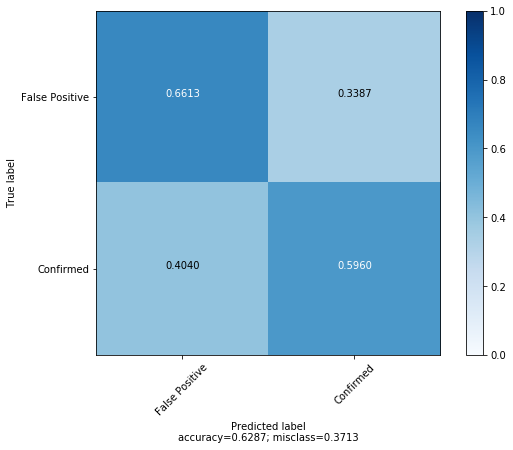

In [45]:
ens_model = RandomForestClassifier(n_jobs=-1, random_state=0, **grid_search.best_params_) 
ens_model.fit(Y_aux_train_hat, exop_train) 

exop_train_pred = ens_model.predict(Y_aux_train_hat)
exop_test_pred = ens_model.predict(Y_aux_test_hat)

print("Train")
aux = calculate_metrics(exop_train, exop_train_pred)
print("Test")
aux = calculate_metrics(exop_test, exop_test_pred) 

In [ ]:
#https://arxiv.org/pdf/1609.03499.pdf -- dilated causal conv..
#https://github.com/peustr/wavenet/blob/master/wavenet/model.py
#https://github.com/philipperemy/keras-tcn

In [ ]:
### medir MSE diviendo por el error de la medicion?? (pareciera ser lo mas correcto?)